In [1]:
import pandas as pd
import numpy as np
from vivarium import Artifact
import os
from pathlib import Path
from db_queries import get_outputs, get_ids, get_model_results, get_population
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import gbd_mapping
from matplotlib.backends.backend_pdf import PdfPages
pd.set_option('use_inf_as_na', True)
sns.set(context = 'paper', style='whitegrid', font_scale=1.8, rc = {'axes.spines.right':False, 'axes.spines.top': False, 'figure.figsize':(12.7,8.6)}, palette='Set1')


## Change variable save_path to local directory file path for file results



In [2]:
mapping_dict_data = {'cause': {'acute_myocardial_infarction':'ischemic_heart_disease','post_myocardial_infarction':'ischemic_heart_disease','acute_ischemic_stroke':'ischemic_stroke','post_ischemic_stroke':'ischemic_stroke', 'ischemic_stroke':'ischemic_stroke', 'chronic_kidney_disease':'chronic_kidney_disease', 'ischemic_heart_disease':'ischemic_heart_disease', 'diabetes_mellitus':'diabetes_mellitus', 'other_causes':'other_causes', 'albuminuria':'chronic_kidney_disease', 'stage_iii_chronic_kidney_disease':'chronic_kidney_disease','stage_iv_chronic_kidney_disease':'chronic_kidney_disease','stage_v_chronic_kidney_disease':'chronic_kidney_disease','moderate_diabetes_mellitus':'diabetes_mellitus','severe_diabetes_mellitus':'diabetes_mellitus', 'chronic_kidney_disease':'chronic_kidney_disease'},
                    'cause_client': {'ischemic_heart_disease':'Ischemic heart disease', 'ischemic_stroke':'Ischemic stroke', 'chronic_kidney_disease':'Chronic kidney disease', 'diabetes_mellitus':'Diabetes mellitus', 'other_causes':'Other causes', 'CVD':'CVD'},
                    'sequela':{378:'acute_myocardial_infarction', 379:'acute_myocardial_infarction',380:'post_myocardial_infarction', 381:'post_myocardial_infarction', 382:'post_myocardial_infarction', 383:'post_myocardial_infarction', 384:'post_myocardial_infarction', 385:'post_myocardial_infarction', 953:'post_myocardial_infarction', 1040:'post_myocardial_infarction', 5726:'post_myocardial_infarction', 386: 'acute_ischemic_stroke', 387: 'acute_ischemic_stroke', 388: 'acute_ischemic_stroke', 389: 'acute_ischemic_stroke', 390: 'acute_ischemic_stroke', 391:'post_ischemic_stroke', 392: 'post_ischemic_stroke', 393:'post_ischemic_stroke', 394:'post_ischemic_stroke', 395:'post_ischemic_stroke', 946:'post_ischemic_stroke'},
                    'location': {'china':'China', 'brazil':'Brazil', 'france':'France', 'italy':'Italy', 'russian_federation':'Russia', 'spain':'Spain'},
                    'sex':{'female':'female','male':'male', 'both_sexes_combined':'both sexes'},
                    'scenario': {'baseline':'Business as Usual', 'guideline':'Intervention 1 (multiple pills)', 'guideline_and_new_treatment':'Intervention 2 (FDC)'},
                    'measure':{'death':'deaths','ylds':'ylds','ylls':'ylls'},
                    'measure_client':{'deaths':'Deaths', 'incidence':'Incidence'},
                    'model_7_results':{'brazil':'brazil/2020_04_07_18_51_12', 'china':'china/2020_04_07_18_54_07','france':'france/2020_04_07_18_51_32', 'italy':'italy/2020_04_07_18_55_54', 'russian_federation':'russian_federation/2020_04_07_18_51_57', 'spain':'spain/2020_04_07_18_52_09'}}

locations = ['brazil', 'china', 'france', 'italy','russian_federation', 'spain']
measures = ['deaths', 'person_time','population','ylds','ylls', 'prevalence', 'incidence']
save_path_j = '/home/j/Project/simulation_science/zenon/result/interim_results_round_2'

## GBD 2019 Population


In [3]:
def get_gbd_pops():
    ages = list(range(13, 21))+[30, 31, 32, 235]
    numbers = 1
    pops = get_population(age_group_id=ages, single_year_age=False, location_id=[135,6,80,86,68, 62, 92], location_set_id=1,sex_id=[1,2,3],gbd_round_id=6, with_ui=True, decomp_step='iterative', forecasted_pop=False)
    ages = get_ids('age_group')
    locs = get_ids('location')
    sexes = get_ids('sex')
    pops_ages = pd.merge(pops,ages,left_on='age_group_id', right_on='age_group_id',how='left')
    pops_locs = pd.merge(pops_ages,locs,left_on='location_id',right_on='location_id',how='left')
    pops_sexs = pd.merge(pops_locs,sexes,left_on='sex_id',right_on='sex_id',how='left')
    pops = pops_sexs.drop(columns='location_description')
    pops_40plus = pops.groupby(['location_name','sex']).population.sum().reset_index()
    pops_40plus['age_group_name'] = '40+'
    pops_frames = [pops,pops_40plus]
    pops = pd.concat(pops_frames)
    pops['sex'] = pops.sex.str.replace('Male','male')
    pops['sex'] = pops.sex.str.replace('Female','female')
    pops['sex'] = pops.sex.str.replace('Both','both sexes')
    pops['location_name'] = pops.location_name.str.replace('Russian Federation', 'Russia')
    pops = pops[['location_name','sex','age_group_name','population']]

    return pops

In [4]:
gbd_pops = get_gbd_pops()

/share/code/santonis/miniconda/envs/validation/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  from ipykernel import kernelapp as app


## Load Artifact Data to get 'Table 1'

In [5]:
def load_artifact_data_rf(locations):
    master_art_data = pd.DataFrame()
    for location in locations:
        for risk_factor in ['high_ldl_cholesterol', 'high_systolic_blood_pressure', 'high_fasting_plasma_glucose_continuous', 'impaired_kidney_function']:
            art = Artifact(f'/share/costeffectiveness/artifacts/vivarium_csu_zenon/{location}.hdf', filter_terms=['year_start ==2017', 'age_start > 29'])
            data = art.load(f'risk_factor.{risk_factor}.exposure')

            data = pd.DataFrame(data.mean(axis=1)).reset_index().rename(columns={0:'value'})
            data['Location'] = f'{location}'
            data['Entity'] = f'Risk factor: {risk_factor.capitalize()}'
            data['Age group'] = 0
            data['Measure'] = ' Exposure'
            data = data.rename(columns={'parameter':'Parameter', 'sex':'Sex'})
            data['Age group'] = np.where(data['age_start'] == 30.0, '30_to_34', 
                                         np.where(data['age_start'] == 35.0, '35_to_39',
                                                  np.where(data['age_start'] == 40.0, '40_to_44',
                                                          np.where(data['age_start'] == 45.0, '45_to_49',
                                                                  np.where(data['age_start'] == 50.0, '50_to_54',
                                                                           np.where(data['age_start'] == 55.0, '55_to_59',
                                                                                   np.where(data['age_start'] == 60.0, '60_to_64',
                                                                                            np.where(data['age_start'] == 65.0, '65_to_69',
                                                                                                     np.where(data['age_start'] == 70.0, '70_to_74',
                                                                                                              np.where(data['age_start'] == 75.0, '75_to_79',
                                                                                                                       np.where(data['age_start'] == 80.0, '80_to_84',
                                                                                                                               np.where(data['age_start'] == 85.0, '85_to_89',
                                                                                                                                       np.where(data['age_start'] == 90.0, '90_to_94',
                                                                                                                                                np.where(data['age_start'] == 95.0, '95_plus', 'too_young'))))))))))))))
            master_art_data = master_art_data.append(data)
    
        for pop in ['population']:
            art = Artifact(f'/share/costeffectiveness/artifacts/vivarium_csu_zenon/{location}.hdf', filter_terms=['year_start ==2017', 'age_start > 29'])
            data = art.load(f'{pop}.structure')

            data = pd.DataFrame(data.mean(axis=1)).reset_index().rename(columns={0:'value'})
            data['Location'] = f'{location}'
            data['Entity'] = f'{pop.capitalize()}'
            data['Age group'] = 0
            data['Measure'] = 'Structure'
            data['Parameter'] = 'Number'
            data = data.rename(columns={'sex':'Sex'})
            data['Age group'] = np.where(data['age_start'] == 30.0, '30_to_34', 
                                         np.where(data['age_start'] == 35.0, '35_to_39',
                                                  np.where(data['age_start'] == 40.0, '40_to_44',
                                                          np.where(data['age_start'] == 45.0, '45_to_49',
                                                                  np.where(data['age_start'] == 50.0, '50_to_54',
                                                                           np.where(data['age_start'] == 55.0, '55_to_59',
                                                                                   np.where(data['age_start'] == 60.0, '60_to_64',
                                                                                            np.where(data['age_start'] == 65.0, '65_to_69',
                                                                                                     np.where(data['age_start'] == 70.0, '70_to_74',
                                                                                                              np.where(data['age_start'] == 75.0, '75_to_79',
                                                                                                                       np.where(data['age_start'] == 80.0, '80_to_84',
                                                                                                                               np.where(data['age_start'] == 85.0, '85_to_89',
                                                                                                                                       np.where(data['age_start'] == 90.0, '90_to_94',
                                                                                                                                                np.where(data['age_start'] == 95.0, '95_plus', 'too_young'))))))))))))))
            master_art_data = master_art_data.append(data)

    
    master_art_data['Year'] = '2017'
    master_art_data['Entity'] = master_art_data['Entity'].str.replace('_', ' ')
    master_art_data['Age group'] = master_art_data['Age group'].str.replace('_plus', '+')
    master_art_data['Age group'] = master_art_data['Age group'].str.replace('_', ' ')
    master_art_data['Location'] = master_art_data['Location'].map(mapping_dict_data['location'])

    master_art_data = master_art_data.drop(columns=['year_start', 'year_end', 'age_start', 'age_end'])
    master_art_data_gb = master_art_data.groupby(['Entity', 'Measure', 'Location', 'Parameter', 'Year']).value.mean().reset_index()
    master_art_data_gb['Sex'] = 'Both sexes'
    master_art_data_gb['Age group'] = '40+'
    master_art_data = pd.concat([master_art_data, master_art_data_gb])
    master_art_data = master_art_data.set_index(['Entity', 'Measure', 'Sex', 'Age group', 'Location']).sort_index().reset_index()
    master_art_data = master_art_data[['Entity', 'Measure', 'Sex', 'Age group', 'Year', 'Location', 'Parameter', 'value']]
    
    return master_art_data

In [42]:
artifact_table_1 = load_artifact_data_rf(locations)

/share/code/santonis/miniconda/envs/validation/lib/python3.6/site-packages/ipykernel_launcher.py:68: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



In [44]:
brazil_art.load('covariate.outpatient_utilization')

,,,,,,draw_0,draw_1,draw_2,draw_3,draw_4,draw_5,draw_6,draw_7,draw_8,draw_9,...,draw_990,draw_991,draw_992,draw_993,draw_994,draw_995,draw_996,draw_997,draw_998,draw_999
location,sex,age_start,age_end,year_start,year_end,,,,,,,,,,,,,,,,,,,,,


In [43]:
artifact_table_1.to_csv('20200417_zenon_table_1.csv', index=False)

## Zenon Model 7 results



In [5]:
path_template = Path('/share/costeffectiveness/results/vivarium_csu_zenon/v7.2_intervention/')

def get_model_outputs_sequela(locations, measure):
    outcomes = pd.DataFrame([])
    try:   
        for location in locations:
            country_loc = mapping_dict_data['model_7_results'][location]
            outcome = pd.read_hdf(str(path_template / f'{country_loc}/count_data/{measure}.hdf'))
            outcome['location'] = f'{location}'
            if measure != 'transition_count':
                outcome['measure'] = f'{measure}'
            outcomes = outcomes.append(outcome)
        return outcomes
            
    except:
        print(f'{measure} is not a measure in the outputs')

def get_model_outputs_cause(locations, measure):
    outcomes = pd.DataFrame([])
    try:   
    
        for location in locations:
            country_loc = mapping_dict_data['model_7_results'][location]
            outcome = pd.read_hdf(str(path_template / f'{country_loc}/count_data/{measure}.hdf'))
            outcome['location'] = f'{location}'
        
            if measure != 'transition_count':
                outcome['measure'] = f'{measure}'
            outcomes = outcomes.append(outcome)
        outcomes['cause'] = outcomes.cause.map(mapping_dict_data['cause'])
        outcomes = outcomes.groupby(['age_group','sex','year','cause','input_draw','location', 'scenario']).value.sum().reset_index()

        return outcomes
            
    except:
            print(f'{measure} is not a measure in the outputs')



In [6]:
def get_pops(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_7_results'][country]
        outcome = pd.read_hdf(str(path_template / f'{country_loc}/count_data/population.hdf'))
        outcome['location'] = f'{country}'
        outcomes = outcomes.append(outcome)
    return outcomes

def get_person_time(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_7_results'][country]
        outcome = pd.read_hdf(str(path_template / f'{country_loc}/count_data/person_time.hdf'))
        outcome['location'] = f'{country}'
        outcomes = outcomes.append(outcome)
    outcomes = outcomes.groupby(['age_group','sex','year','input_draw', 'location', 'scenario']).value.sum().reset_index()
    return outcomes

def get_person_time_rfs(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_7_results'][country]
        outcome = pd.read_hdf(str(path_template / f'{country_loc}/count_data/person_time.hdf'))
        outcome['location'] = f'{country}'
        outcomes = outcomes.append(outcome)
    return outcomes

def get_person_time_misc(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_7_results'][country]
        outcome = pd.read_hdf(str(path_template / f'{country_loc}/count_data/miscellaneous_person_time.hdf'))
        outcome['location'] = f'{country}'
        outcomes = outcomes.append(outcome)
    return outcomes

In [14]:
person_time_misc = get_person_time_misc(locations)
person_time_rfs = get_person_time_rfs(locations)

In [7]:
def get_rf_data(person_time_misc, person_time_rfs, risk_factor):
    try:
        rf = person_time_misc[(person_time_misc.measure == f'{risk_factor}_person_time')]
        rf['measure'] = f'{risk_factor}'
        index_columns = ['age_group', 'sex', 'year', 'input_draw','location', 'scenario', 'acs', 'sbp','fpg', 'ldl']
        rf = rf.set_index(index_columns + ['measure']).value
        person_time = person_time_rfs.set_index(index_columns).value
        rf_mean_val = rf / person_time 
        rf_mean_val  = rf_mean_val.reset_index()
        rf_mean_val['value'] = rf_mean_val.value.fillna(0)
        rf_mean_val['location'] = rf_mean_val.location.map(mapping_dict_data['location'])
        rf_mean_val['scenario'] = rf_mean_val.scenario.map(mapping_dict_data['scenario'])
        rf_mean_val = rf_mean_val.rename(columns={'scenario':'Scenario'})
        return rf_mean_val
    except:
        print(f'{risk_factor} is not a measure in the outputs. Only acceptable risk_factor value: ldlc, sbp, fpg, acs')

    
def get_transition(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_7_results'][country]
        df = pd.read_hdf(str(path_template / f'{country_loc}/count_data/transition_count.hdf'))
        df['location'] = f'{country}'
        outcomes = outcomes.append(df)
    return outcomes

def get_transition_susceptible_to_acute(locations):
    transitions = get_model_outputs_sequela(locations, 'transition_count')
    transitions = transitions[transitions.measure.str.startswith('susceptible')]
    transitions['susceptible'] = transitions.measure.str.extract('((?<=to_).*?(?=_to))',expand = False)
    transitions['cause'] = transitions.measure.str.extract('((?<=to_).*?(?=_event_count))',expand = False)
    transitions['cause'] = transitions.cause.str.extract('((?<=_to_).*)', expand = False)
    transitions = transitions.drop('measure', axis = 1)
    return transitions

def get_transition_post_to_acute(locations):    
    transitions = get_model_outputs_sequela(locations, 'transition_count')
    transitions = transitions[transitions.measure.str.startswith('post')]
    transitions['susceptible'] = transitions.measure.str.extract('(.*?(?=_to))',expand = False)
    transitions['cause'] = transitions.measure.str.extract('((?<=to_).*?(?=_event_count))',expand = False)
    transitions = transitions.drop('measure', axis = 1)
    return transitions

## LDL-c over time per location

In [10]:
ldlc_rf = get_rf_data(person_time_misc, person_time_rfs, 'ldlc')

/share/code/santonis/miniconda/envs/validation/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


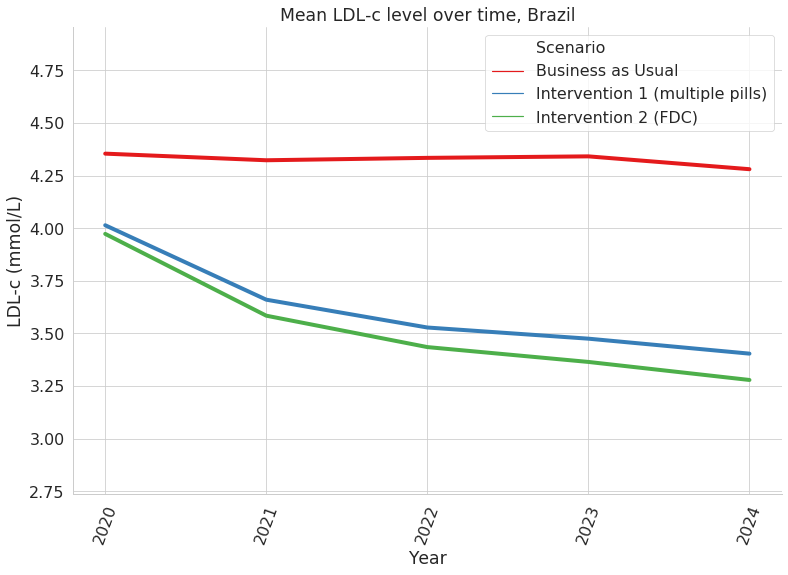

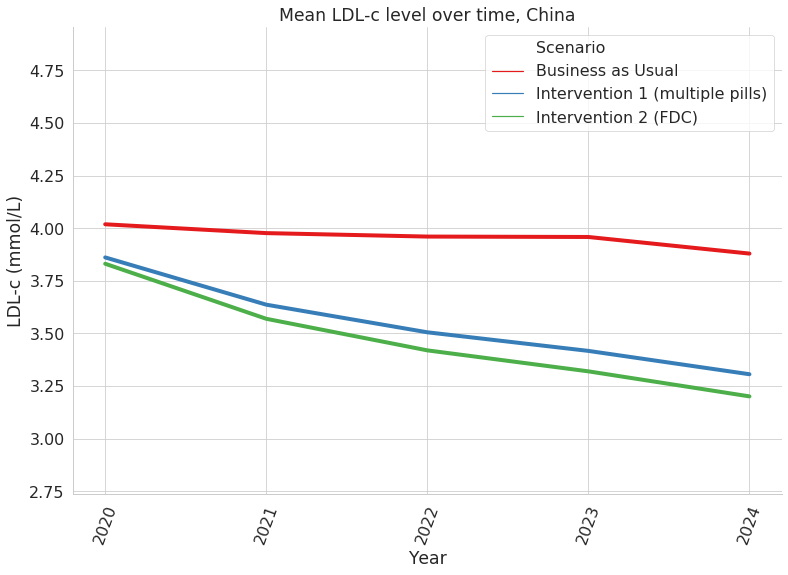

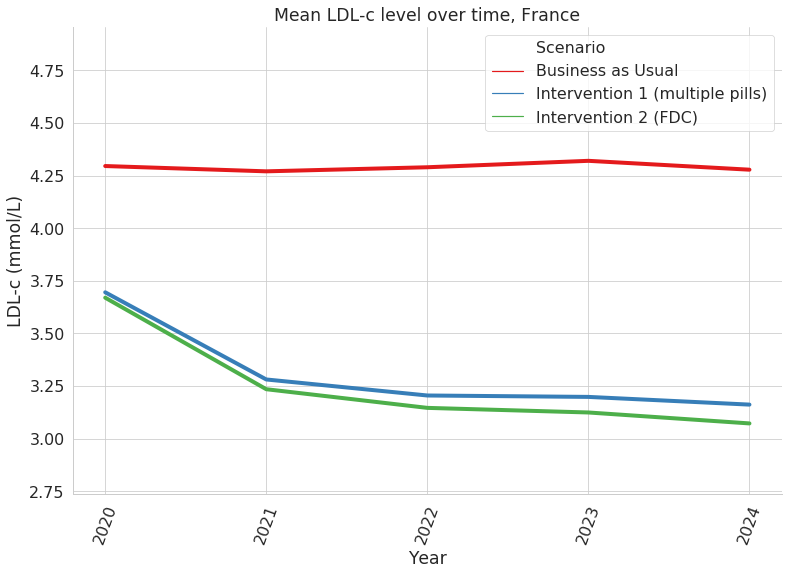

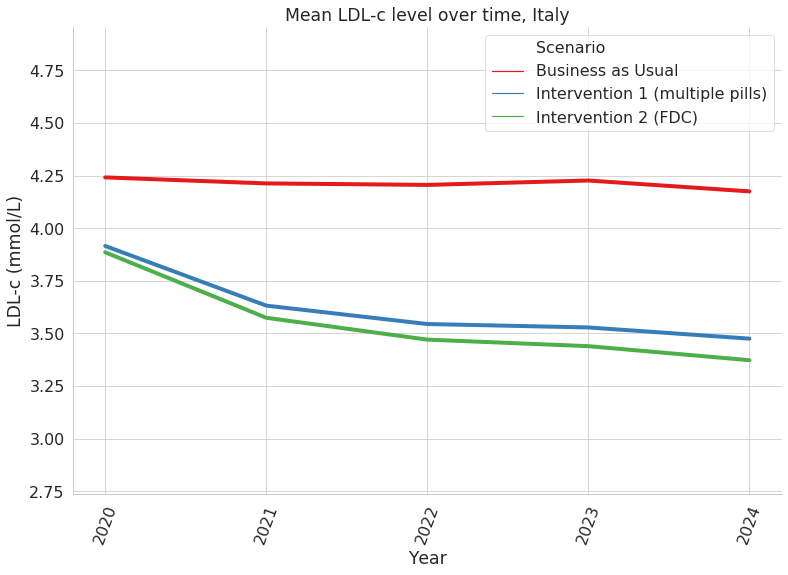

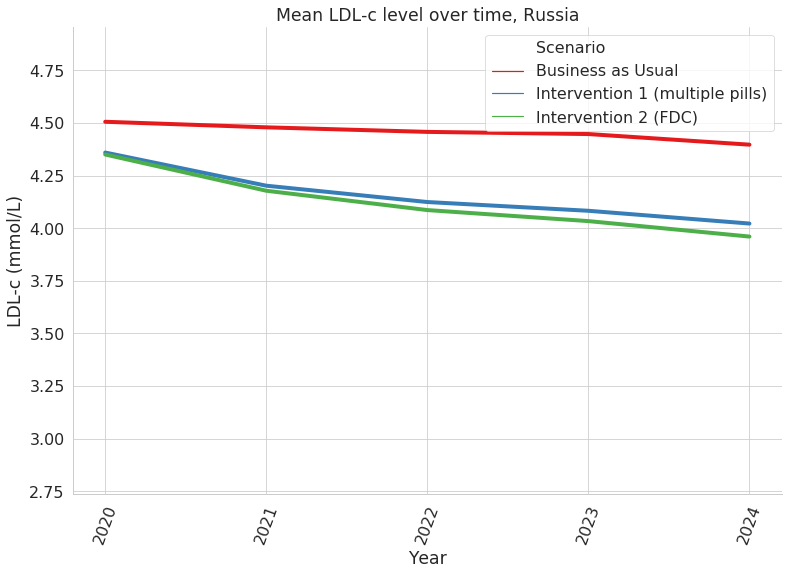

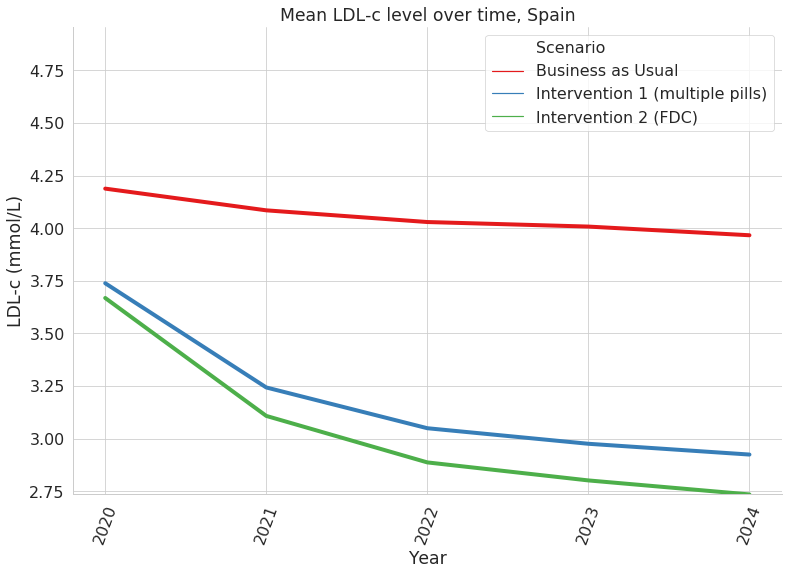

<Figure size 914.4x619.2 with 0 Axes>

In [24]:
def plot_ldl_c_mean(ldlc_rf):
    df = ldlc_rf.groupby(['location', 'year', 'Scenario']).value.mean().reset_index()
    locations = ['Brazil', 'China', 'France', 'Italy','Russia', 'Spain']

    with PdfPages(str(save_path_j)+f'/mean_ldl_c_over_time_model_outputs.pdf') as pdf:
        diff_upper = df.value.max()
        diff_upper = diff_upper * 1.1
        diff_lower = df.value.min()

        for location in locations:
            df_plot = df[(df.location == location)]


            g = sns.lineplot(x='year', y='value', hue = 'Scenario',
                             linewidth=4, data=df_plot)

            g.set_title(f'Mean LDL-c level over time, {location}')
            plt.xticks(rotation=70)
            g.set_xlabel('Year')
            g.set_ylabel(f'LDL-c (mmol/L)')
            g.set_ylim(diff_lower,diff_upper)

            pdf.savefig(orientation = 'landscape', bbox_inches='tight')

            plt.show()
            plt.clf() 

plot_ldl_c_mean(ldlc_rf)

## FPG over time, per location

In [12]:
fpg_rf = get_rf_data(person_time_misc, person_time_rfs, 'fpg')

/share/code/santonis/miniconda/envs/validation/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


In [8]:
fpg_rf.head()

,age_group,sex,year,input_draw,location,Scenario,acs,sbp,fpg,ldl,measure,value
0,30_to_34,female,2020,29,Brazil,Business as Usual,post,high,high,high,fpg,0.000000
1,30_to_34,female,2020,29,Brazil,Business as Usual,none,high,high,high,fpg,0.000000
2,30_to_34,female,2020,29,Brazil,Business as Usual,post,high,low,high,fpg,0.000000
3,30_to_34,female,2020,29,Brazil,Business as Usual,none,high,low,high,fpg,6.039101
4,30_to_34,female,2020,29,Brazil,Business as Usual,post,low,high,high,fpg,0.000000


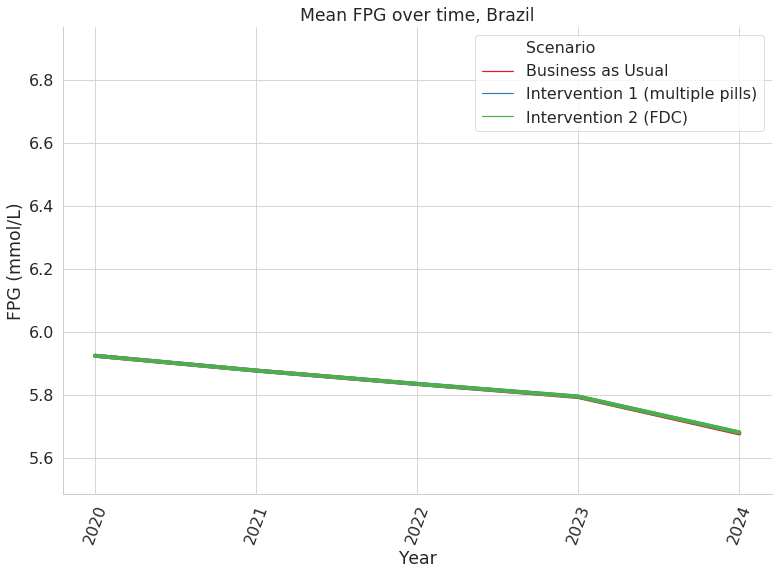

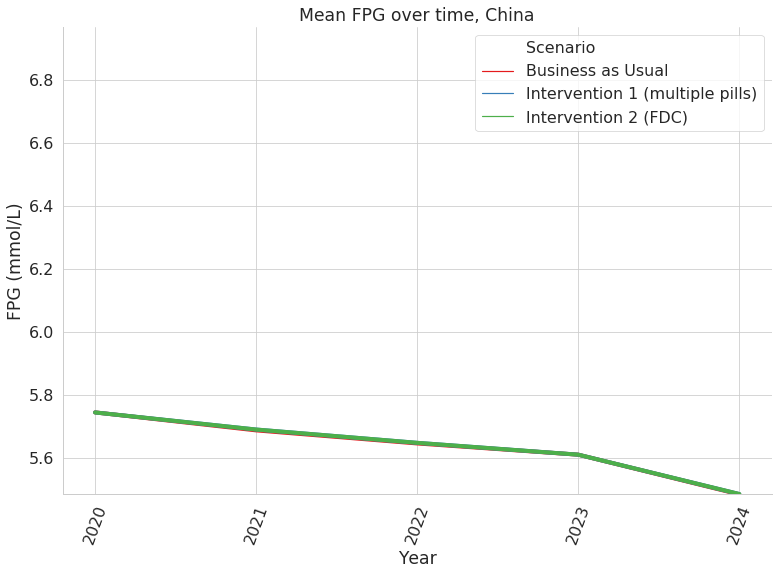

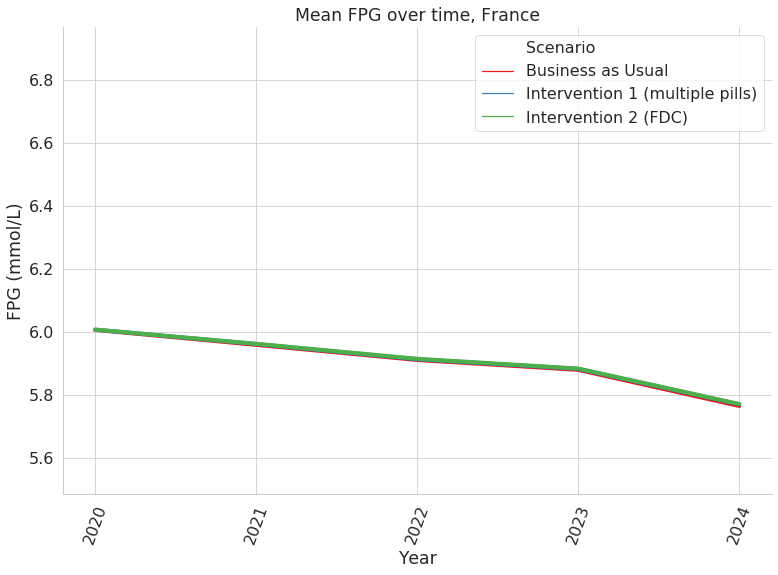

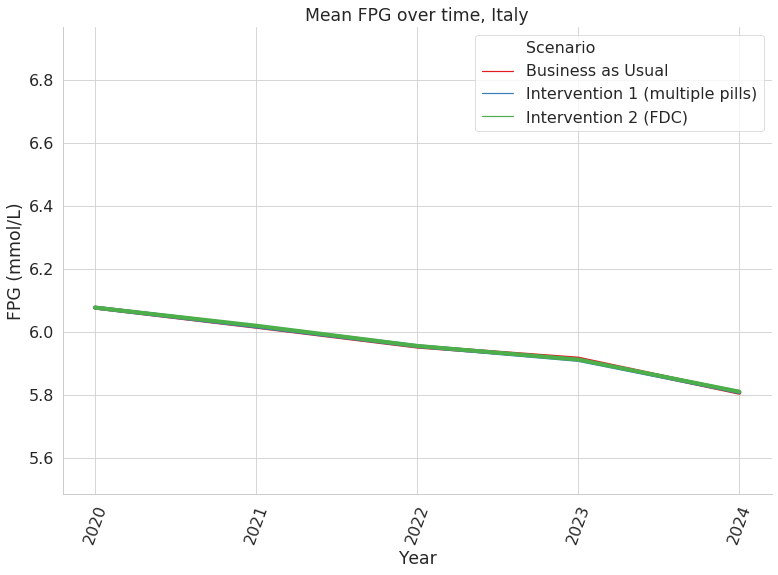

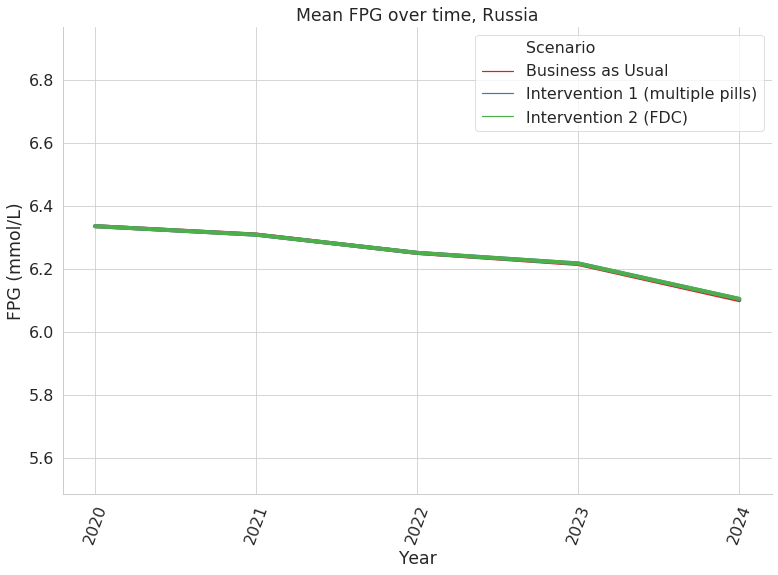

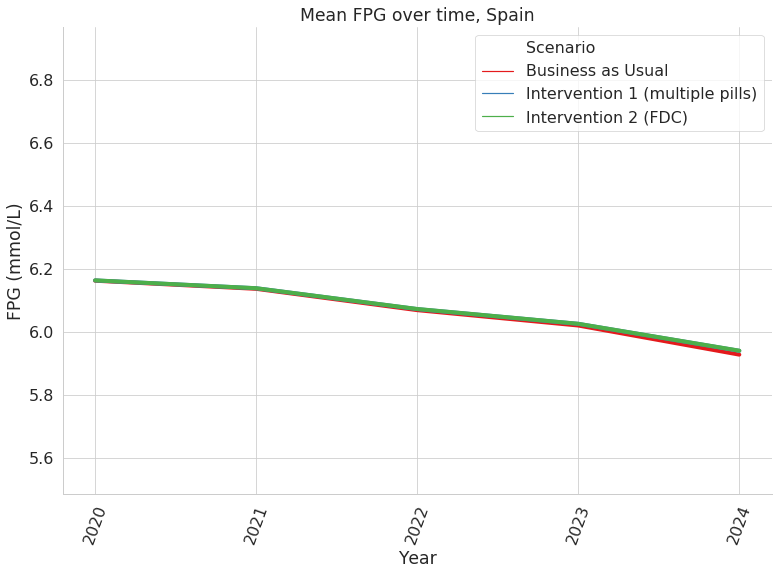

<Figure size 914.4x619.2 with 0 Axes>

In [14]:
def plot_fpg_mean(fpg_rf):
    df = fpg_rf.groupby(['location', 'year', 'Scenario']).value.mean().reset_index()
    locations = ['Brazil', 'China', 'France', 'Italy','Russia', 'Spain']

    with PdfPages(str(save_path_j)+f'/mean_fpg_over_time_model_outputs.pdf') as pdf:
        diff_upper = df.value.max()
        diff_upper = diff_upper * 1.1
        diff_lower = df.value.min()

        for location in locations:
            df_plot = df[(df.location == location)]


            g = sns.lineplot(x='year', y='value', hue = 'Scenario',
                             linewidth=4, data=df_plot)

            g.set_title(f'Mean FPG over time, {location}')
            plt.xticks(rotation=70)
            g.set_xlabel('Year')
            g.set_ylabel(f'FPG (mmol/L)')
            g.set_ylim(diff_lower,diff_upper)

            pdf.savefig(orientation = 'landscape', bbox_inches='tight')

            plt.show()
            plt.clf() 

plot_fpg_mean(fpg_rf)

## SBP over time, per location

In [15]:
sbp_rf = get_rf_data(person_time_misc, person_time_rfs, 'sbp')

/share/code/santonis/miniconda/envs/validation/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


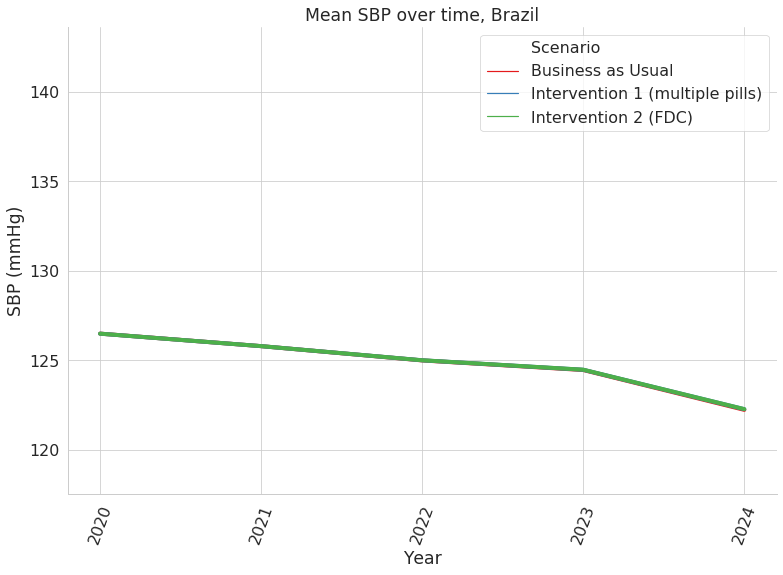

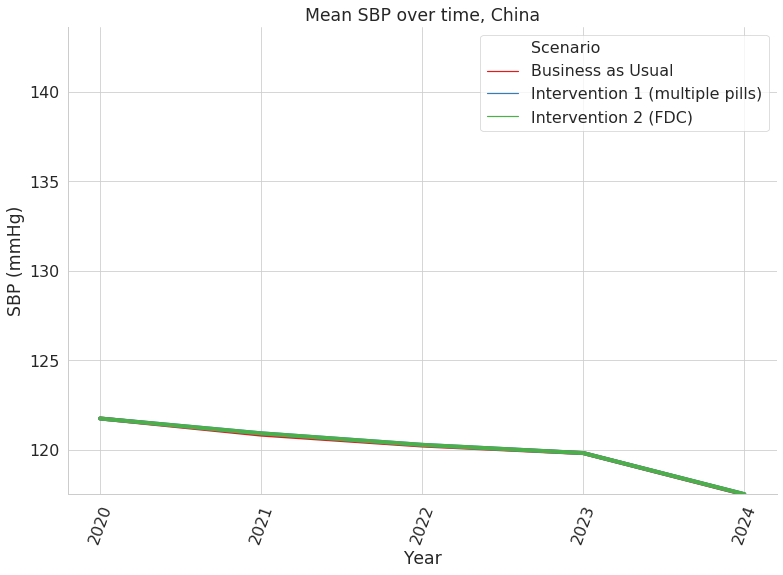

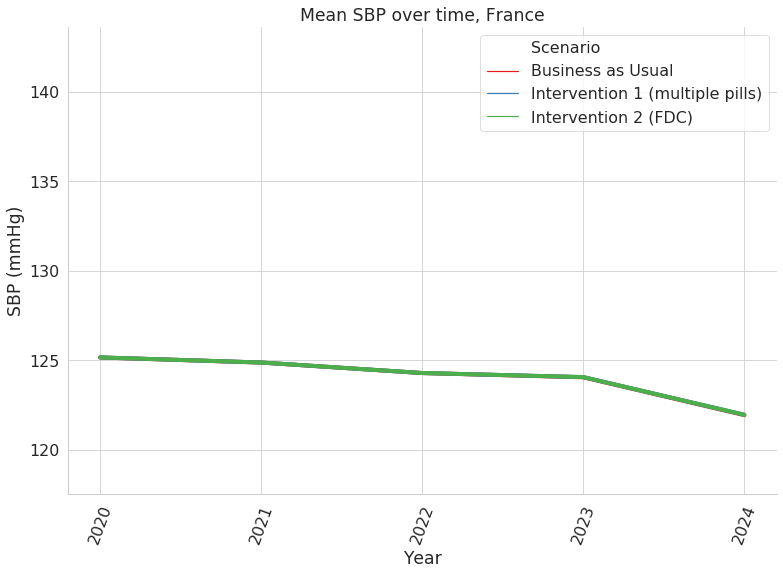

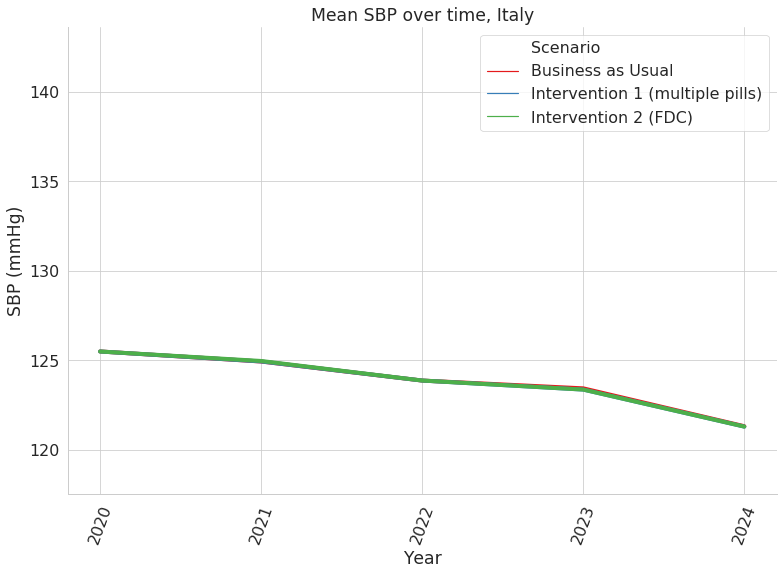

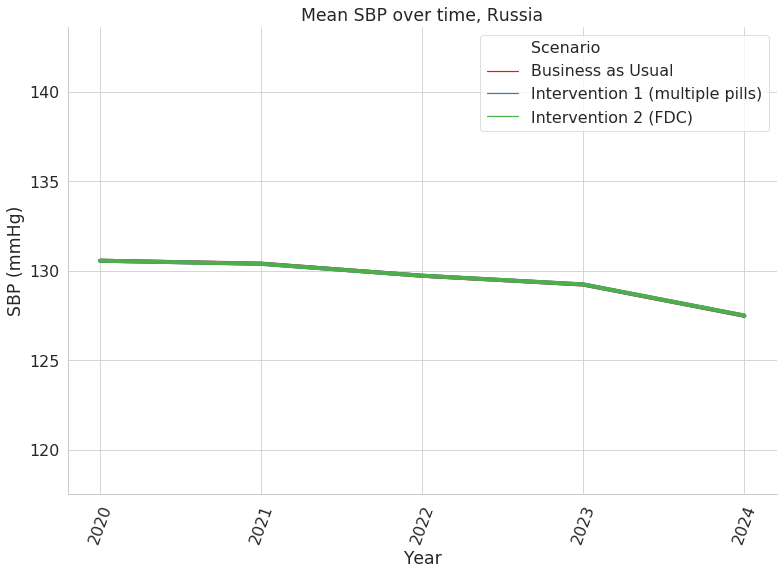

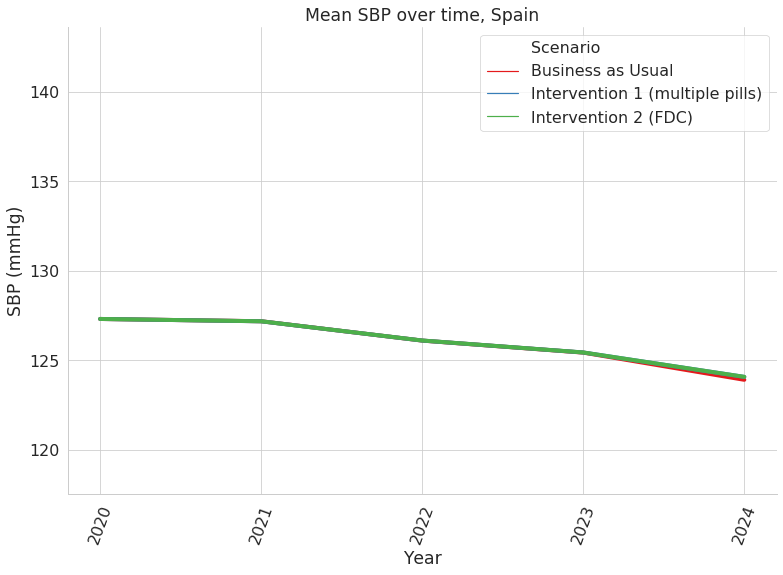

<Figure size 914.4x619.2 with 0 Axes>

In [17]:
def plot_sbp_mean(sbp_rf):
    df = sbp_rf.groupby(['location', 'year', 'Scenario']).value.mean().reset_index()
    locations = ['Brazil', 'China', 'France', 'Italy','Russia', 'Spain']

    with PdfPages(str(save_path_j)+f'/mean_sbp_over_time_model_outputs.pdf') as pdf:
        diff_upper = df.value.max()
        diff_upper = diff_upper * 1.1
        diff_lower = df.value.min()

        for location in locations:
            df_plot = df[(df.location == location)]


            g = sns.lineplot(x='year', y='value', hue = 'Scenario',
                             linewidth=4, data=df_plot)

            g.set_title(f'Mean SBP over time, {location}')
            plt.xticks(rotation=70)
            g.set_xlabel('Year')
            g.set_ylabel(f'SBP (mmHg)')
            g.set_ylim(diff_lower,diff_upper)

            pdf.savefig(orientation = 'landscape', bbox_inches='tight')

            plt.show()
            plt.clf() 

plot_sbp_mean(sbp_rf)

## Adherence over time, per location

In [20]:
adherent_df = get_rf_data(person_time_misc, person_time_rfs, 'adherent')

/share/code/santonis/miniconda/envs/validation/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


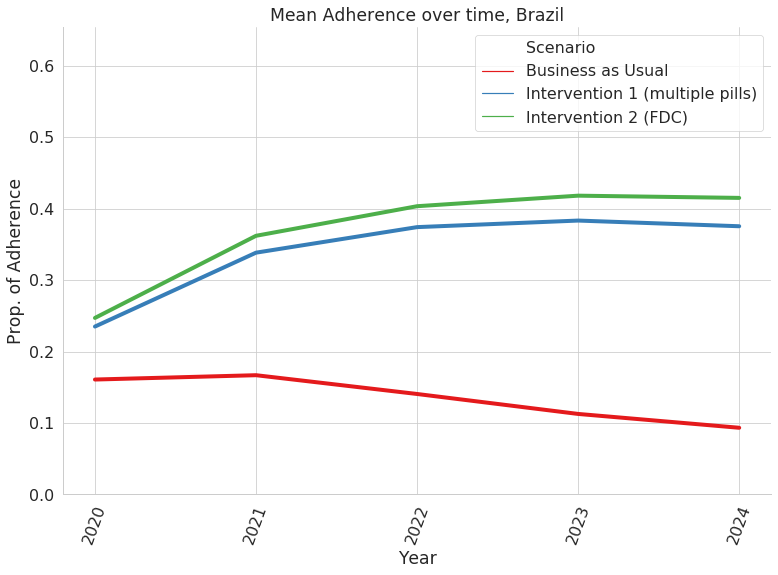

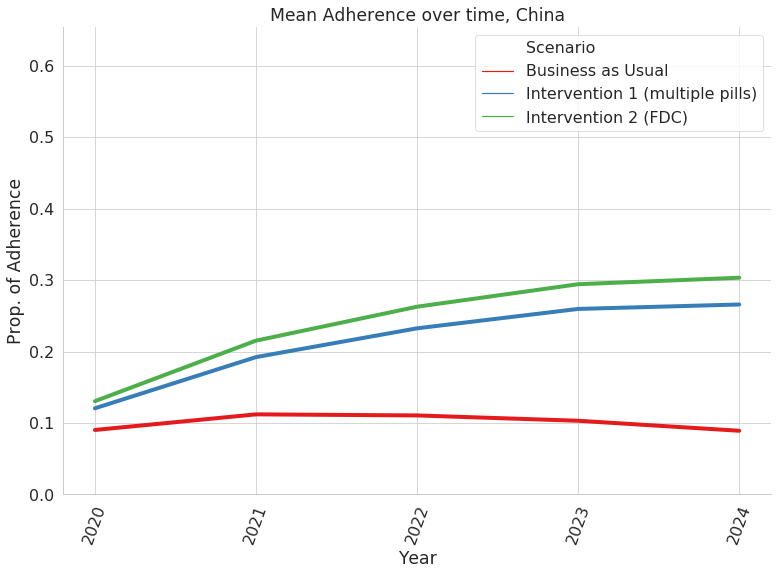

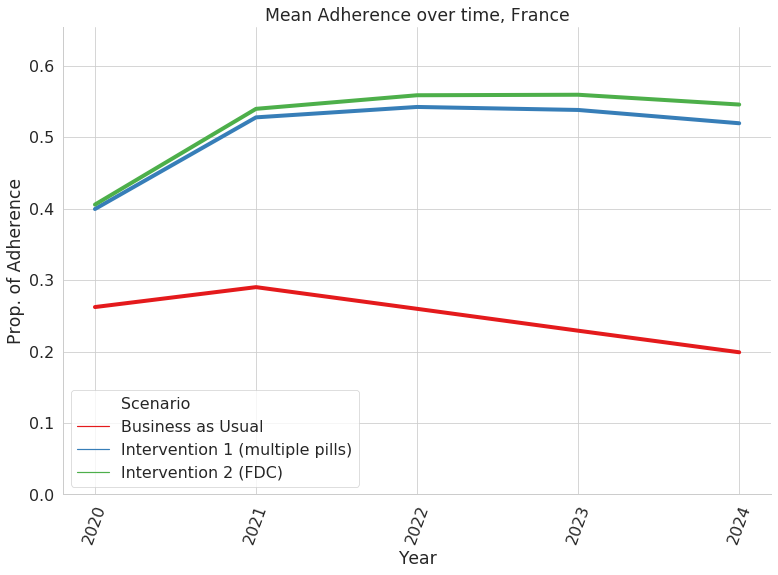

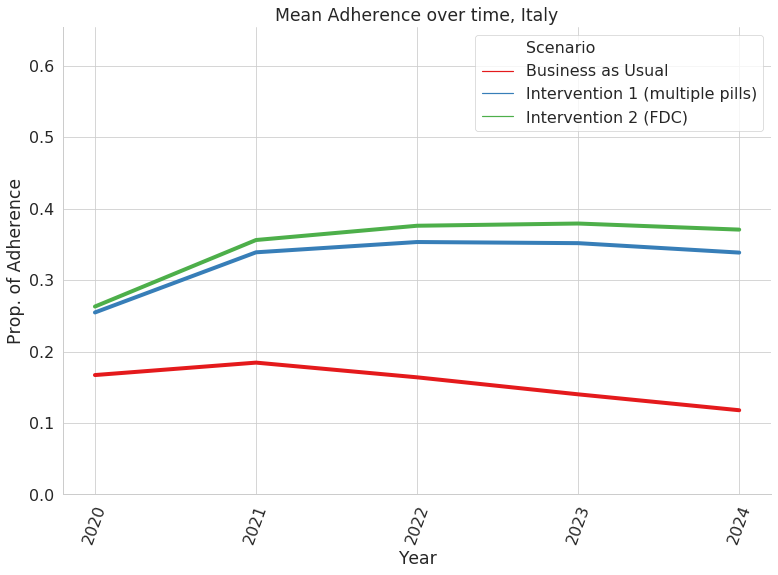

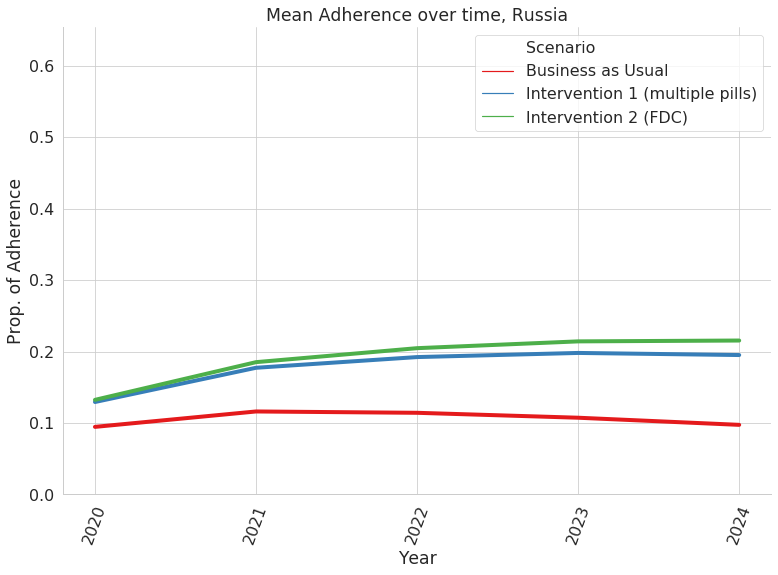

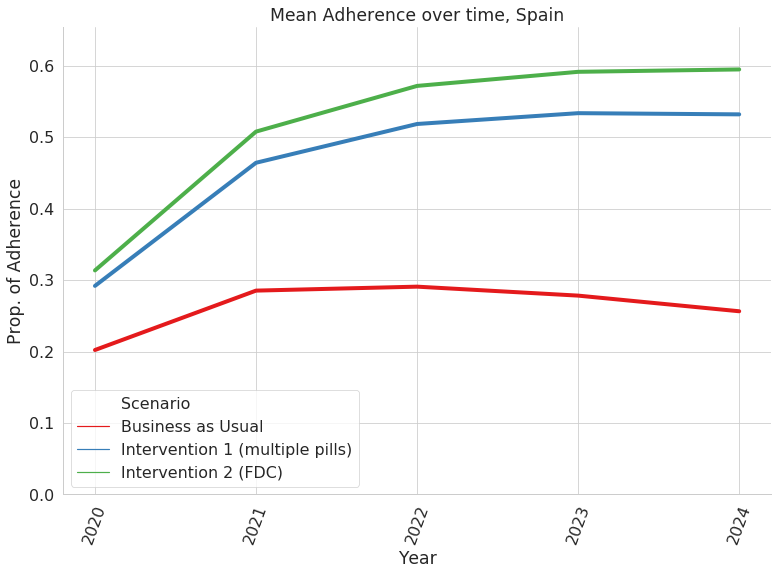

<Figure size 914.4x619.2 with 0 Axes>

In [23]:
def plot_adherent_mean(adherent_df):
    df = adherent_df.groupby(['location', 'year', 'Scenario']).value.mean().reset_index()
    locations = ['Brazil', 'China', 'France', 'Italy','Russia', 'Spain']

    with PdfPages(str(save_path_j)+f'/mean_adherence_over_time_model_outputs.pdf') as pdf:
        diff_upper = df.value.max()
        diff_upper = diff_upper * 1.1
        diff_lower = 0

        for location in locations:
            df_plot = df[(df.location == location)]


            g = sns.lineplot(x='year', y='value', hue = 'Scenario',
                             linewidth=4, data=df_plot)

            g.set_title(f'Mean Adherence over time, {location}')
            plt.xticks(rotation=70)
            g.set_xlabel('Year')
            g.set_ylabel(f'Prop. of Adherence')
            g.set_ylim(diff_lower,diff_upper)

            pdf.savefig(orientation = 'landscape', bbox_inches='tight')

            plt.show()
            plt.clf() 

plot_adherent_mean(adherent_df)

In [8]:
susceptible_to_acute = get_transition_susceptible_to_acute(locations)
post_to_acute = get_transition_post_to_acute(locations)

In [9]:
def collapse_frame(df, column):
    nonidcols = ['value']
    nonidcols.extend(column)
    return(df.groupby([x for x in df.columns if x not in nonidcols])['value'].sum().reset_index())

In [9]:
# def collapse_frame(df, column):
#     nonidcols = ['value']
#     nonidcols.extend(column)
#     return(df.groupby([x for x in df.columns if x not in nonidcols])['value'].sum().reset_index())

# def get_incidence_validation(susceptible_to_acute, post_to_acute, locations, risk_strat = False, final_cause_strat = False, age_strat = False, ages_to_include = None):
#     transitions = pd.concat([susceptible_to_acute, post_to_acute])
#     state = get_model_outputs_sequela(locations, 'state_person_time')
#     if ages_to_include != None:
#         transitions = transitions[transitions.age_group.isin(ages_to_include)]
#         state = state[state.age_group.isin(ages_to_include)]
#     state = state.groupby(['age_group','sex','year','cause','input_draw','location', 'measure', 'scenario']).value.sum().reset_index()
#     state = state[(state.cause.str.contains('susceptible')) | (state.cause.str.contains('post'))]
#     state['susceptible'] = state.cause.str.replace('susceptible_to_', '')
#     state = state.drop(['cause', 'measure'], axis = 1)
#     if not risk_strat:
#         # state = collapse_frame(state, ['acs','fpg', 'sbp', 'ldl'])
#         transitions = collapse_frame(transitions, ['acs','fpg', 'sbp', 'ldl'])
#     if not age_strat:
#         transitions = collapse_frame(transitions, ['age_group', 'sex'])
#         transitions['age_group'] = '40_plus'
#         transitions['sex'] = 'both_sexes_combined'
#         state = collapse_frame(state, ['age_group', 'sex'])
#         state['age_group'] = '40_plus'
#         state['sex'] = 'both_sexes_combined'
#     if not final_cause_strat:
#         transitions = collapse_frame(transitions, ['cause'])
#         transitions = transitions.set_index([x for x in state.columns if x != 'value']).value
#     else:
#         transitions = transitions.set_index([x for x in state.columns if x != 'value'] + ['cause']).value
#     state = state.set_index([x for x in state.columns if x != 'value']).value
#     incidence = (transitions/state * 100000).reset_index()
#     incidence['measure'] = 'incidence'
#     if 'cause' not in incidence.columns:
#         incidence.rename(columns = {'susceptible':'cause'}, inplace = True)
#     incidence['cause'] = incidence.cause.map(mapping_dict_data['cause'])
#     incidence = incidence.groupby(['age_group','sex','year','cause','input_draw','location', 'measure', 'scenario']).value.sum().reset_index()
#     return incidence


# inc_erthing= get_incidence_validation(susceptible_to_acute, post_to_acute, locations)
# inc_special= get_incidence_validation(susceptible_to_acute, post_to_acute, locations, age_strat= True, ages_to_include = ['40_to_44', '45_to_49', '50_to_54', '55_to_59', '60_to_64', '65_to_69', '70_to_74', '75_to_79', '80_to_84', '85_to_89', '90_to_94', '95_plus'])


In [76]:
def get_incidence_validation(susceptible_to_acute, post_to_acute, locations, risk_strat = False, final_cause_strat = False, age_strat = False, ages_to_include = None, cvd_strat=False, causes_to_include=None):
    transitions = pd.concat([susceptible_to_acute, post_to_acute])
    state = get_model_outputs_sequela(locations, 'state_person_time')
    if ages_to_include != None:
        transitions = transitions[transitions.age_group.isin(ages_to_include)]
        state = state[state.age_group.isin(ages_to_include)]
        state = state.groupby(['age_group','sex','year','cause','input_draw','location', 'measure', 'scenario']).value.sum().reset_index()
    state = state[(state.cause.str.contains('susceptible')) | (state.cause.str.contains('post'))]
    state['susceptible'] = state.cause.str.replace('susceptible_to_', '')
    if causes_to_include != None:
        transitions = transitions[transitions.susceptible.isin(causes_to_include)]
        state = state[state.susceptible.isin(causes_to_include)]
    state = state.drop(['cause', 'measure'], axis = 1)
    if not risk_strat:
        state = collapse_frame(state, ['acs','fpg', 'sbp', 'ldl'])
        transitions = collapse_frame(transitions, ['acs','fpg', 'sbp', 'ldl'])
    if not age_strat:
        transitions = collapse_frame(transitions, ['age_group', 'sex'])
        transitions['age_group'] = '40_plus'
        transitions['sex'] = 'both_sexes_combined'
        state = collapse_frame(state, ['age_group', 'sex'])
        state['age_group'] = '40_plus'
        state['sex'] = 'both_sexes_combined'
    if not cvd_strat:
        transitions = collapse_frame(transitions, ['cause'])
        transitions['susceptible'] = 'CVD'
        state = collapse_frame(state, ['cause'])
        state['susceptible'] = 'CVD'
    if not final_cause_strat:
        transitions = collapse_frame(transitions, ['cause'])
        transitions = transitions.set_index([x for x in state.columns if x != 'value']).value
    else:
        transitions = transitions.set_index([x for x in state.columns if x != 'value'] + ['cause']).value
        #added this in to test transitions
    state = state.set_index([x for x in state.columns if x != 'value']).value
    incidence = (transitions/state * 100000).reset_index()
    incidence['measure'] = 'incidence'
    if 'cause' not in incidence.columns:
        incidence.rename(columns = {'susceptible':'cause'}, inplace = True)
    incidence['cause'] = incidence.cause.map(mapping_dict_data['cause_client'])
    incidence = incidence.groupby(['age_group','sex','year','cause','input_draw','location', 'measure', 'scenario']).value.sum().reset_index()
    incidence = incidence.fillna(0)
    return incidence


In [10]:
def get_incidence_pops(susceptible_to_acute, post_to_acute, locations, risk_strat = False, final_cause_strat = False, age_strat = False, ages_to_include = None, cvd_strat=False, causes_to_include=None):
    transitions = pd.concat([susceptible_to_acute, post_to_acute])
    state = get_model_outputs_sequela(locations, 'state_person_time')
    if ages_to_include != None:
        transitions = transitions[transitions.age_group.isin(ages_to_include)]
        state = state[state.age_group.isin(ages_to_include)]
        state = state.groupby(['age_group','sex','year','cause','input_draw','location', 'measure', 'scenario']).value.sum().reset_index()
    state = state[(state.cause.str.contains('susceptible')) | (state.cause.str.contains('post'))]
    state['susceptible'] = state.cause.str.replace('susceptible_to_', '')
    if causes_to_include != None:
        transitions = transitions[transitions.susceptible.isin(causes_to_include)]
        state = state[state.susceptible.isin(causes_to_include)]
    state = state.drop(['cause', 'measure'], axis = 1)
    if not risk_strat:
        state = collapse_frame(state, ['acs','fpg', 'sbp', 'ldl'])
        transitions = collapse_frame(transitions, ['acs','fpg', 'sbp', 'ldl'])
    if not age_strat:
        transitions = collapse_frame(transitions, ['age_group', 'sex'])
        transitions['age_group'] = '40_plus'
        transitions['sex'] = 'both_sexes_combined'
        state = collapse_frame(state, ['age_group', 'sex'])
        state['age_group'] = '40_plus'
        state['sex'] = 'both_sexes_combined'
    if not cvd_strat:
        transitions = collapse_frame(transitions, ['cause'])
        transitions['susceptible'] = 'CVD'
        state = collapse_frame(state, ['cause'])
        state['susceptible'] = 'CVD'
    if not final_cause_strat:
        transitions = collapse_frame(transitions, ['cause'])
        transitions = transitions.set_index([x for x in state.columns if x != 'value']).value
    else:
        transitions = transitions.set_index([x for x in state.columns if x != 'value'] + ['cause']).value
        #added this in to test transitions
    state = state.set_index([x for x in state.columns if x != 'value']).value
    incidence = (transitions/state).reset_index()
    incidence['measure'] = 'incidence'
    if 'cause' not in incidence.columns:
        incidence.rename(columns = {'susceptible':'cause'}, inplace = True)
    incidence['cause'] = incidence.cause.map(mapping_dict_data['cause_client'])
    incidence = incidence.groupby(['age_group','sex','year','cause','input_draw','location', 'measure', 'scenario']).value.sum().reset_index()
    incidence = incidence.fillna(0)
    return incidence


In [11]:
inc_special_pops = get_incidence_pops(susceptible_to_acute, post_to_acute, locations, risk_strat = False, final_cause_strat = False, age_strat = False, ages_to_include = ['40_to_44', '45_to_49', '50_to_54', '55_to_59', '60_to_64', '65_to_69', '70_to_74', '75_to_79', '80_to_84', '85_to_89', '90_to_94', '95_plus'], cvd_strat=False, causes_to_include=['ischemic_heart_disease', 'ischemic_stroke', 'post_myocardial_infarction','post_ischemic_stroke'])

def get_incidence_rates_pops(inc_special_pops):
    baseline = inc_special_pops[inc_special_pops.scenario == 'baseline']
    baseline = baseline.rename(columns = {'value':'baseline'})
    inc_special_pops = pd.merge(inc_special_pops, baseline, left_on=['age_group', 'sex', 'year', 'cause', 'input_draw', 'location', 'measure'], right_on=['age_group', 'sex', 'year', 'cause', 'input_draw', 'location', 'measure'], how='left')
    inc_special_pops['difference_from_baseline_count'] = inc_special_pops.apply(lambda row: (row['baseline'] - row['value']),axis=1)
    inc_special_pops = inc_special_pops.rename(columns={'scenario_x':'scenario'})
    inc_special_pops = inc_special_pops.drop(columns=['scenario_y', 'baseline'])
    return inc_special_pops


In [66]:

def get_incidence_rates(inc_erthing, inc_special):     
    inc = inc_erthing.append(inc_special, ignore_index = True)
    baseline = inc[inc.scenario == 'baseline']
    baseline = baseline.rename(columns = {'value':'baseline'})
    inc = pd.merge(inc, baseline, left_on=['age_group', 'sex', 'year', 'cause', 'input_draw', 'location', 'measure'], right_on=['age_group', 'sex', 'year', 'cause', 'input_draw', 'location', 'measure'], how='left')
    inc['difference_from_baseline_count'] = inc.apply(lambda row: (row['baseline'] - row['value']),axis=1)
    inc = inc.rename(columns={'scenario_x':'scenario'})
    inc = inc.drop(columns=['scenario_y', 'baseline'])
    return inc


In [12]:
ylds = get_model_outputs_cause(locations, 'ylds')
ylds['measure'] = 'ylds'
ylls = get_model_outputs_cause(locations, 'ylls')
ylls['measure'] = 'ylls'
deaths = get_model_outputs_cause(locations, 'deaths')
deaths['measure'] = 'deaths'
state = get_model_outputs_cause(locations, 'state_person_time')
state['measure'] = 'prevalence'
person_time = get_person_time(locations)


In [13]:
def get_pop_level_counts(ylds, ylls, deaths, state, person_time, locations, gbd_pops):
    measures = pd.concat([ylds, ylls, deaths, state])
    #create 'CVD' inclusion cause that sums up IHD and IS measures
    measures_cvd = measures[(measures.cause == 'ischemic_heart_disease') | (measures.cause == 'ischemic_stroke')]
    measures_cvd = measures_cvd.groupby(['sex', 'age_group', 'measure', 'input_draw', 'scenario', 'year', 'location']).sum().reset_index()
    measures_cvd['cause'] = 'CVD'
    measures = pd.concat([measures, measures_cvd])
    #add in both sexes combined
    both_sexes = measures.groupby(['age_group', 'cause', 'measure', 'input_draw', 'scenario', 'year', 'location']).sum().reset_index()
    both_sexes['sex'] = 'both_sexes_combined'
    measures = pd.concat([measures, both_sexes])
    measures = measures[(measures.age_group!= '35_to_39') & (measures.age_group!= '30_to_34')]

    #add in 40+ age group
    measures_40plus = measures[(measures.age_group!= '35_to_39') & (measures.age_group!= '30_to_34')]
    measures_40plus = measures_40plus.groupby(['cause', 'sex','measure', 'input_draw', 'scenario', 'year', 'location']).sum().reset_index()
    measures_40plus['age_group'] = '40_plus'
    measures = pd.concat([measures, measures_40plus])
    #query for 'baseline scenario' only scenario
    measures_baseline = measures[(measures['scenario']=='baseline')]
    #add it back to the original DF for diff. from baseline calculation
    measures = pd.merge(measures, measures_baseline,left_on=['age_group', 'cause', 'measure', 'input_draw', 'sex', 'year', 'location'],right_on=['age_group', 'cause', 'measure', 'input_draw', 'sex', 'year', 'location'],how='left')
    measures['difference_from_baseline_count'] = measures.apply(lambda row: (row['value_y'] - row['value_x']),axis=1)
    measures = measures.rename(columns={'scenario_x':'scenario', 'value_x':'value'})
    measures = measures.drop(columns=['value_y', 'scenario_y'])
    person_time = person_time[(person_time.age_group !='30_to_34') & (person_time.age_group != '35_to_39')]
    person_time_both = person_time.groupby(['age_group', 'input_draw', 'scenario', 'year', 'location']).sum().reset_index()
    person_time_both['sex'] = 'both_sexes_combined'
    person_time = pd.concat([person_time, person_time_both])
    #add in 40+ age group
    person_time_all_ages = person_time.groupby(['sex', 'input_draw', 'scenario', 'year', 'location']).sum().reset_index()
    person_time_all_ages['age_group'] = '40_plus'
    person_time = pd.concat([person_time, person_time_all_ages])
    index_columns = ['age_group', 'sex', 'year', 'input_draw','location', 'scenario']
    measure_counts = measures.set_index(index_columns + ['cause', 'measure']).value
    person_time = person_time.set_index(index_columns).value
    rates = measure_counts / person_time 
    diff_measures = measures.set_index(index_columns + ['cause', 'measure']).difference_from_baseline_count
    diff_rates = diff_measures / person_time 
    rates = rates.reset_index()
    diff_rates = diff_rates.reset_index()
    rates = pd.merge(rates, diff_rates, left_on=['age_group', 'cause','measure','sex', 'year', 'input_draw','location', 'scenario'], right_on=['age_group', 'cause', 'measure', 'sex', 'year', 'input_draw','location', 'scenario'], how='left')
    # #     rates = rates.reset_index().append(get_incidence(susceptible_to_acute, post_to_acute, locations))
    rates = rates.rename(columns={0:'difference_from_baseline_count'})  
    rates = rates.append(get_incidence_rates_pops(inc_special_pops))
    rates = rates[(rates.age_group == '40_plus') & (rates.sex == 'both_sexes_combined')]
    rates['scenario'] = rates.scenario.map(mapping_dict_data['scenario'])
    rates['location'] = rates.location.map(mapping_dict_data['location'])
    rates['sex'] = rates.sex.map(mapping_dict_data['sex'])
    rates = rates.rename(columns={'scenario':'Scenario', 'measure':'Measure'})
    rates['cause'] = rates.cause.map(mapping_dict_data['cause_client'])
    rates['age_group'] = rates.age_group.str.replace('_', ' ')
    rates['age_group'] = rates.age_group.str.replace(' plus', '+')
    rates = pd.merge(rates,gbd_pops,left_on=['age_group','location','sex'],right_on=['age_group_name','location_name','sex'],how='left')
    rates['population_counts'] = rates.apply(lambda row: (row['value'] * row['population']),axis=1)
    rates['population_difference_from_baseline'] = rates.apply(lambda row: (row['difference_from_baseline_count'] * row['population']),axis=1)

    return rates

## Getting population counts of disease outcomes

In [14]:
population_counts = get_pop_level_counts(ylds, ylls, deaths, state, person_time, locations, gbd_pops)

/share/code/santonis/miniconda/envs/validation/lib/python3.6/site-packages/ipykernel_launcher.py:7: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  import sys
/share/code/santonis/miniconda/envs/validation/lib/python3.6/site-packages/ipykernel_launcher.py:11: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  # This is added back by InteractiveShellApp.init_path()
/share/code/santonis/miniconda/envs/validation/lib/python3.6/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will chang

In [16]:
population_counts

,age_group,cause,difference_from_baseline_count,input_draw,location,Measure,Scenario,sex,value,year,location_name,age_group_name,population,population_counts,population_difference_from_baseline
0,40+,CVD,0.000000e+00,29,Brazil,deaths,Business as Usual,both sexes,0.002635,2020,Brazil,40+,8.279758e+07,2.181315e+05,0.000000e+00
1,40+,CVD,0.000000e+00,29,Brazil,prevalence,Business as Usual,both sexes,0.069215,2020,Brazil,40+,8.279758e+07,5.730855e+06,0.000000e+00
2,40+,CVD,0.000000e+00,29,Brazil,ylds,Business as Usual,both sexes,0.005278,2020,Brazil,40+,8.279758e+07,4.370144e+05,0.000000e+00
3,40+,CVD,0.000000e+00,29,Brazil,ylls,Business as Usual,both sexes,0.044558,2020,Brazil,40+,8.279758e+07,3.689270e+06,0.000000e+00
4,40+,Chronic kidney disease,0.000000e+00,29,Brazil,deaths,Business as Usual,both sexes,0.000460,2020,Brazil,40+,8.279758e+07,3.811438e+04,0.000000e+00
5,40+,Chronic kidney disease,0.000000e+00,29,Brazil,prevalence,Business as Usual,both sexes,0.184727,2020,Brazil,40+,8.279758e+07,1.529494e+07,0.000000e+00
6,40+,Chronic kidney disease,0.000000e+00,29,Brazil,ylds,Business as Usual,both sexes,0.002328,2020,Brazil,40+,8.279758e+07,1.927134e+05,0.000000e+00
7,40+,Chronic kidney disease,0.000000e+00,29,Brazil,ylls,Business as Usual,both sexes,0.009813,2020,Brazil,40+,8.279758e+07,8.124650e+05,0.000000e+00
8,40+,Diabetes mellitus,0.000000e+00,29,Brazil,deaths,Business as Usual,both sexes,0.000694,2020,Brazil,40+,8.279758e+07,5.746475e+04,0.000000e+00
9,40+,Diabetes mellitus,0.000000e+00,29,Brazil,prevalence,Business as Usual,both sexes,0.104556,2020,Brazil,40+,8.279758e+07,8.656966e+06,0.000000e+00


## Get population-level reduction in outcomes percentage

In [42]:
def get_pop_pct_diff(population_counts):
    baseline = population_counts[population_counts.Scenario == 'Business as Usual']
    baseline = baseline.rename(columns = {'population_counts':'baseline_population_counts'})
    population_counts = pd.merge(population_counts, baseline, left_on=['age_group', 'sex', 'year', 'cause', 'input_draw', 'location', 'Measure'], right_on=['age_group', 'sex', 'year', 'cause', 'input_draw', 'location', 'Measure'], how='left')
    population_counts['difference_from_baseline_pct'] = population_counts.apply(lambda row: (((row['population_counts'] - row['baseline_population_counts'])/abs(row['baseline_population_counts']) * 100)),axis=1)
    population_counts = population_counts.rename(columns={'Scenario_x':'Scenario'})
    population_counts = population_counts.drop(columns=['Scenario_y', 'baseline_population_counts'])
    return population_counts


In [43]:
population_pct_reduction = get_pop_pct_diff(population_counts)

In [44]:
population_pct_reduction

,age_group,cause,difference_from_baseline_count_x,input_draw,location,Measure,Scenario,sex,value_x,year,...,population_x,population_counts,population_difference_from_baseline_x,difference_from_baseline_count_y,value_y,location_name_y,age_group_name_y,population_y,population_difference_from_baseline_y,difference_from_baseline_pct
0,40+,CVD,0.000000e+00,29,Brazil,deaths,Business as Usual,both sexes,0.002635,2020,...,8.279758e+07,2.181315e+05,0.000000e+00,0.0,0.002635,Brazil,40+,8.279758e+07,0.0,0.000000
1,40+,CVD,0.000000e+00,29,Brazil,prevalence,Business as Usual,both sexes,0.069215,2020,...,8.279758e+07,5.730855e+06,0.000000e+00,0.0,0.069215,Brazil,40+,8.279758e+07,0.0,0.000000
2,40+,CVD,0.000000e+00,29,Brazil,ylds,Business as Usual,both sexes,0.005278,2020,...,8.279758e+07,4.370144e+05,0.000000e+00,0.0,0.005278,Brazil,40+,8.279758e+07,0.0,0.000000
3,40+,CVD,0.000000e+00,29,Brazil,ylls,Business as Usual,both sexes,0.044558,2020,...,8.279758e+07,3.689270e+06,0.000000e+00,0.0,0.044558,Brazil,40+,8.279758e+07,0.0,0.000000
4,40+,Chronic kidney disease,0.000000e+00,29,Brazil,deaths,Business as Usual,both sexes,0.000460,2020,...,8.279758e+07,3.811438e+04,0.000000e+00,0.0,0.000460,Brazil,40+,8.279758e+07,0.0,0.000000
5,40+,Chronic kidney disease,0.000000e+00,29,Brazil,prevalence,Business as Usual,both sexes,0.184727,2020,...,8.279758e+07,1.529494e+07,0.000000e+00,0.0,0.184727,Brazil,40+,8.279758e+07,0.0,0.000000
6,40+,Chronic kidney disease,0.000000e+00,29,Brazil,ylds,Business as Usual,both sexes,0.002328,2020,...,8.279758e+07,1.927134e+05,0.000000e+00,0.0,0.002328,Brazil,40+,8.279758e+07,0.0,0.000000
7,40+,Chronic kidney disease,0.000000e+00,29,Brazil,ylls,Business as Usual,both sexes,0.009813,2020,...,8.279758e+07,8.124650e+05,0.000000e+00,0.0,0.009813,Brazil,40+,8.279758e+07,0.0,0.000000
8,40+,Diabetes mellitus,0.000000e+00,29,Brazil,deaths,Business as Usual,both sexes,0.000694,2020,...,8.279758e+07,5.746475e+04,0.000000e+00,0.0,0.000694,Brazil,40+,8.279758e+07,0.0,0.000000
9,40+,Diabetes mellitus,0.000000e+00,29,Brazil,prevalence,Business as Usual,both sexes,0.104556,2020,...,8.279758e+07,8.656966e+06,0.000000e+00,0.0,0.104556,Brazil,40+,8.279758e+07,0.0,0.000000


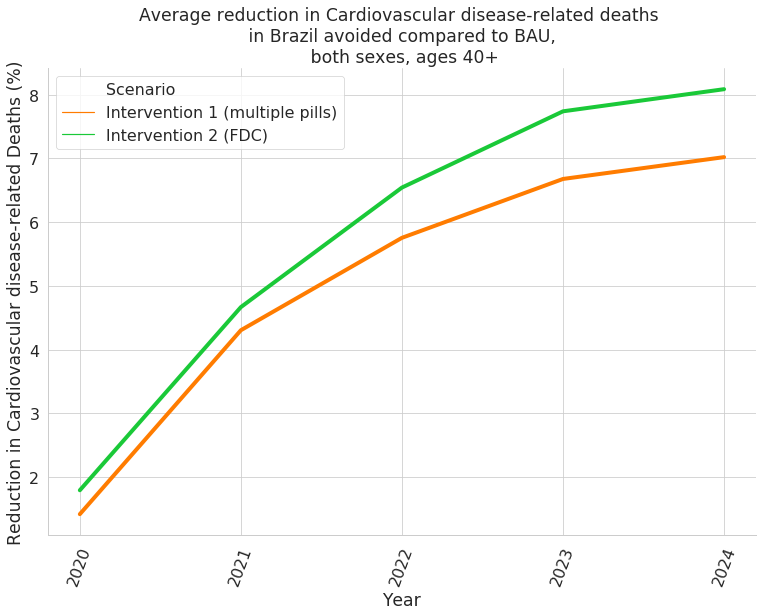

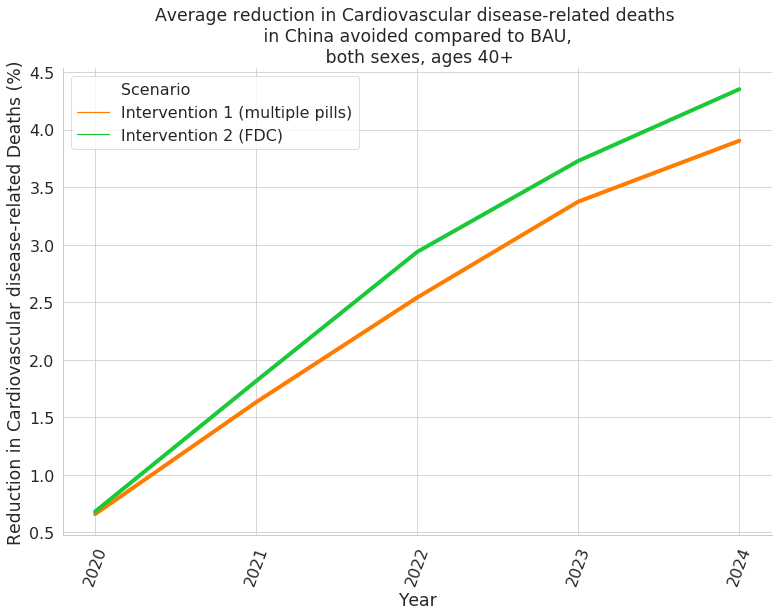

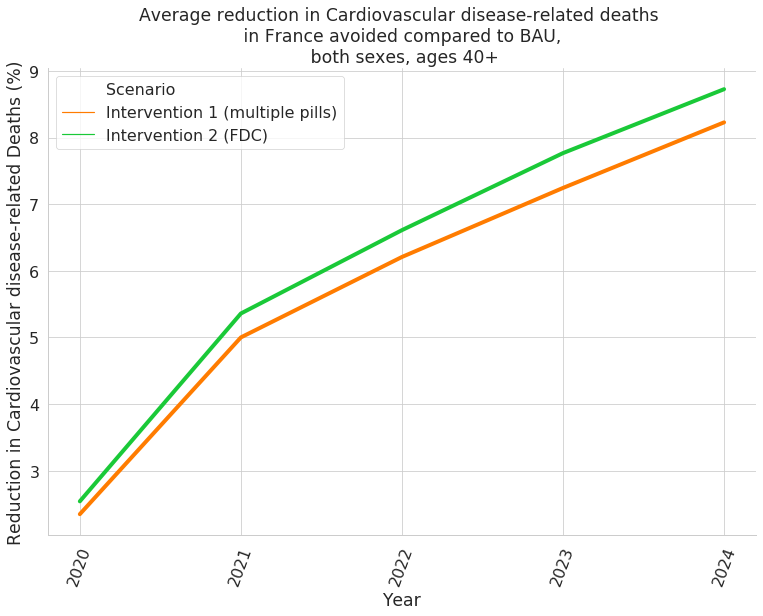

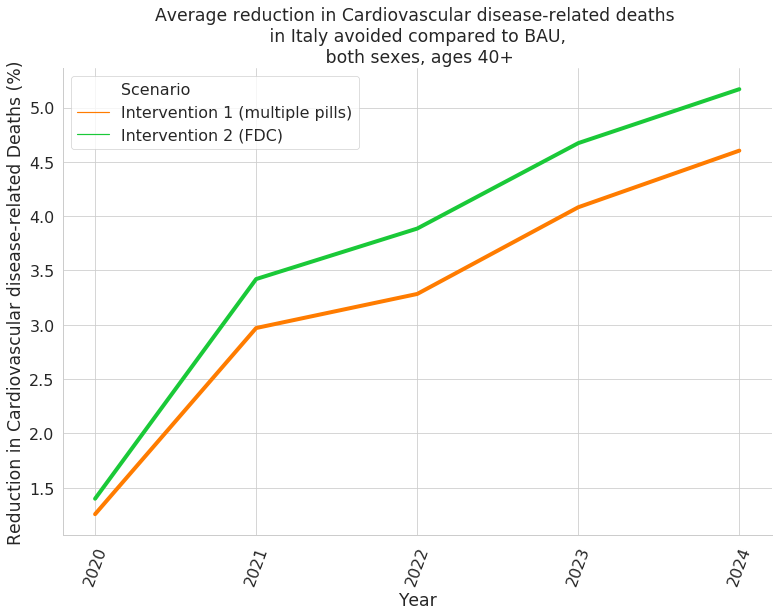

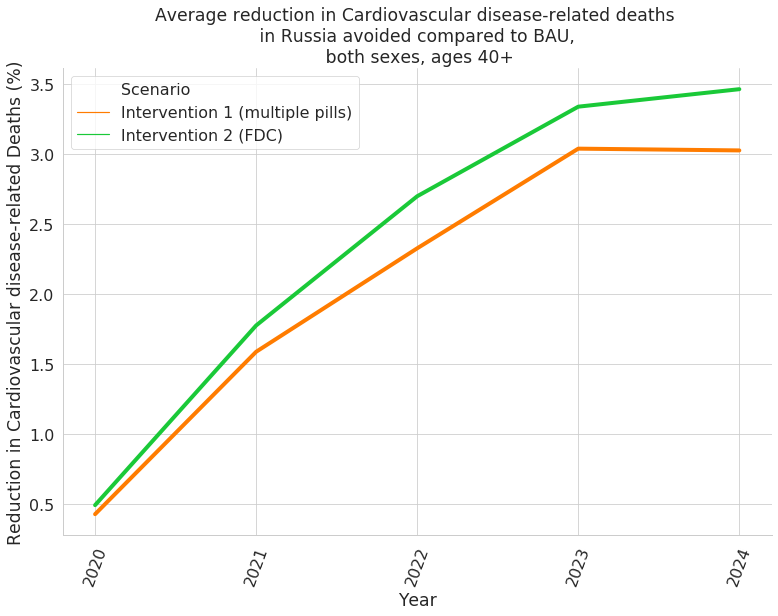

...

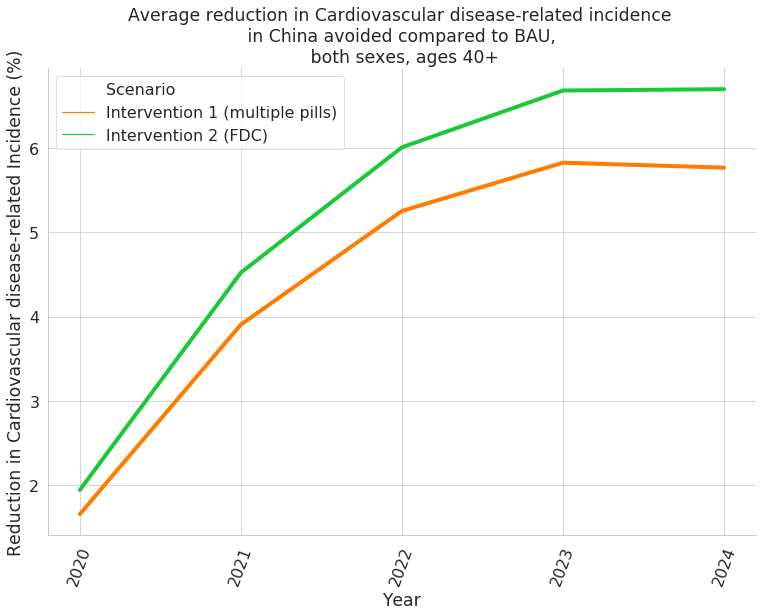

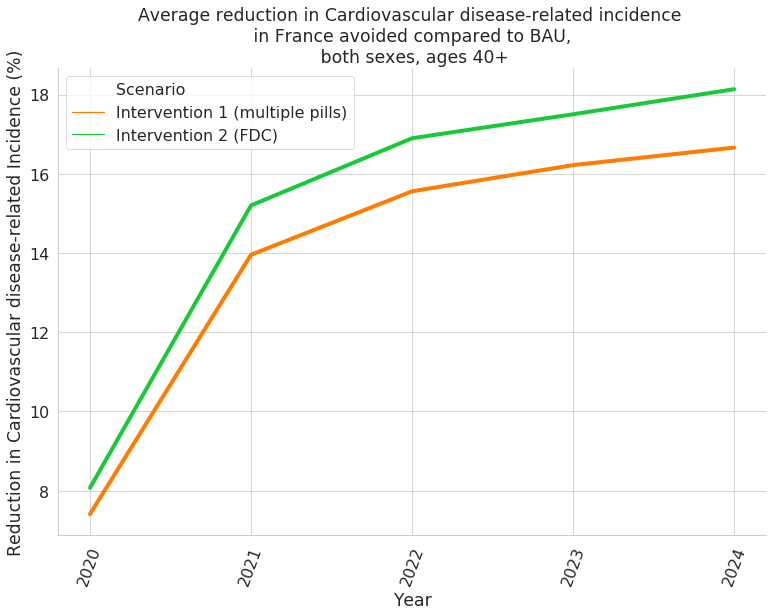

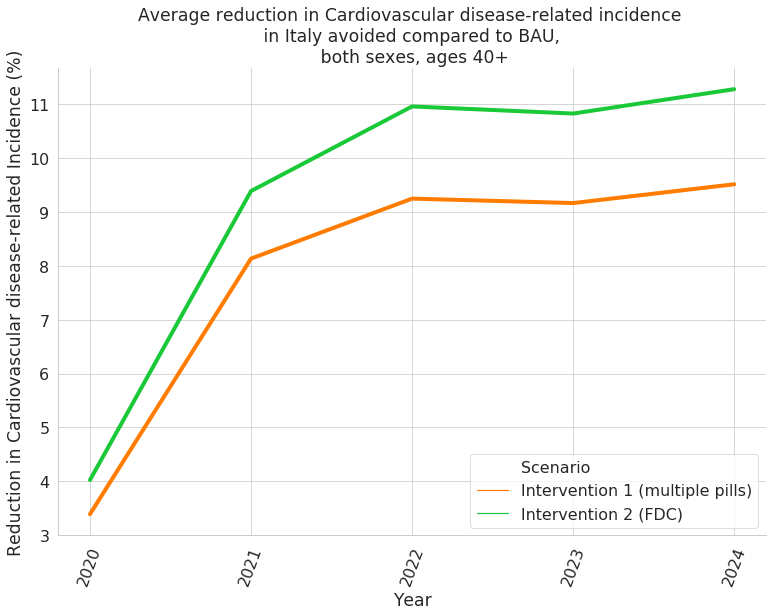

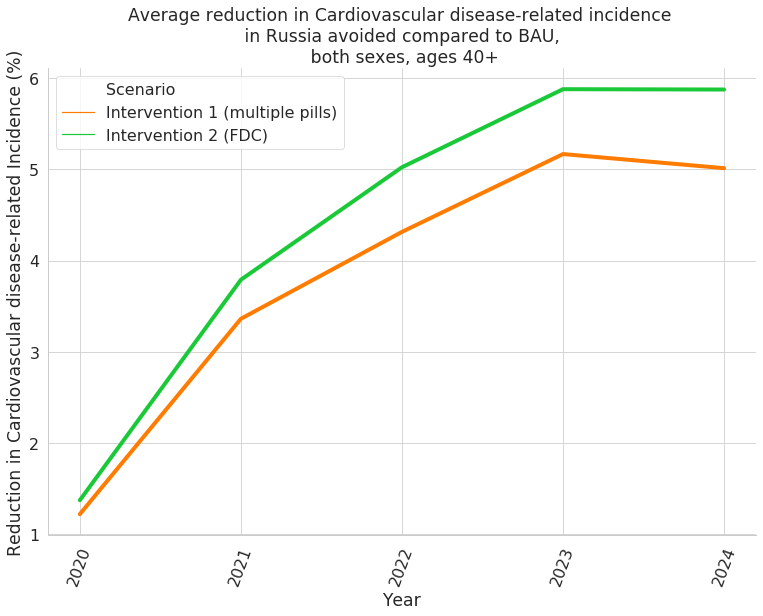

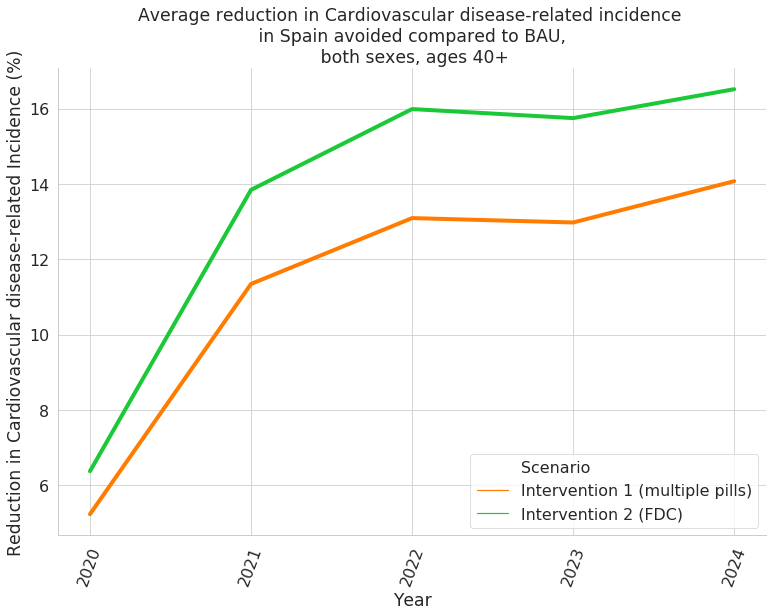

<Figure size 914.4x619.2 with 0 Axes>

In [52]:
def plot_diff_baseline_results_mean_population_pct(population_pct_reduction):

    cause_names = ['CVD']
    measure_names = ['deaths', 'incidence']
    
    scenario_list = ['Intervention 1 (multiple pills)', 'Intervention 2 (FDC)']
    palette_list = ['#ff7c00','#1ac938']
    palette_dict = {x:v for x,v in zip(scenario_list,palette_list)}


    for cause in cause_names:
            for measure in measure_names:
                for sex in ['both sexes']:
                    for age in ['40+']:
                         for location in ['Brazil', 'China', 'France', 'Italy', 'Russia', 'Spain']:

                            with PdfPages(str(save_path_j)+f'/cause_measure_location_diff_baseline/{cause}_{measure}_{location}_pct_difference_from_baseline_population.pdf') as pdf:


                                data_r = population_pct_reduction[(population_pct_reduction.cause == cause) & (population_pct_reduction.sex == sex) & (population_pct_reduction.Measure == measure) & (population_pct_reduction.location == location) & (population_pct_reduction.age_group == age)& (population_pct_reduction.Scenario != 'Business as Usual')]
                                data_m = data_r.groupby(['Scenario','year']).difference_from_baseline_pct.mean().reset_index()
                                data_m['difference_from_baseline_pct'] = data_m['difference_from_baseline_pct'].abs()
                                
                                g = sns.lineplot(x='year', y='difference_from_baseline_pct',
                                                 linewidth=4, palette = palette_dict,
                                                 hue='Scenario', data=data_m)

    #                                 g.ax.fill_between(data_g.age_group, data_g.upper, data_g.lower, alpha=0.3, facecolor='red')

                                g.set_title(f'Average reduction in Cardiovascular disease-related {measure} \n in {location} avoided compared to BAU, \n {sex}, ages {age}')
                                plt.xticks(rotation=70)
                                g.set_xlabel('Year')
                                g.set_ylabel(f'Reduction in Cardiovascular disease-related {measure.capitalize()} (%)')

                                pdf.savefig(orientation = 'landscape', bbox_inches='tight')

                                plt.show()
                                plt.clf() 

plot_diff_baseline_results_mean_population_pct(population_pct_reduction)

## Get rate-space disease outcomes per location

In [43]:
def get_cause_specific_rates(ylds, ylls, deaths, state, person_time, locations):
    measures = pd.concat([ylds, ylls, deaths, state])
    #create 'CVD' inclusion cause that sums up IHD and IS measures
    measures_cvd = measures[(measures.cause == 'ischemic_heart_disease') | (measures.cause == 'ischemic_stroke')]
    measures_cvd = measures_cvd.groupby(['sex', 'age_group', 'measure', 'input_draw', 'scenario', 'year', 'location']).sum().reset_index()
    measures_cvd['cause'] = 'CVD'
    measures = pd.concat([measures, measures_cvd])
    #add in both sexes combined
    both_sexes = measures.groupby(['age_group', 'cause', 'measure', 'input_draw', 'scenario', 'year', 'location']).sum().reset_index()
    both_sexes['sex'] = 'both_sexes_combined'
    measures = pd.concat([measures, both_sexes])
    measures = measures[(measures.age_group!= '35_to_39') & (measures.age_group!= '30_to_34')]

    #add in 40+ age group
    measures_40plus = measures[(measures.age_group!= '35_to_39') & (measures.age_group!= '30_to_34')]
    measures_40plus = measures_40plus.groupby(['cause', 'sex','measure', 'input_draw', 'scenario', 'year', 'location']).sum().reset_index()
    measures_40plus['age_group'] = '40_plus'
    measures = pd.concat([measures, measures_40plus])
    #query for 'baseline scenario' only scenario
    measures_baseline = measures[(measures['scenario']=='baseline')]
    #add it back to the original DF for diff. from baseline calculation
    measures = pd.merge(measures, measures_baseline,left_on=['age_group', 'cause', 'measure', 'input_draw', 'sex', 'year', 'location'],right_on=['age_group', 'cause', 'measure', 'input_draw', 'sex', 'year', 'location'],how='left')
    measures['difference_from_baseline_count'] = measures.apply(lambda row: (row['value_y'] - row['value_x']),axis=1)
    measures = measures.rename(columns={'scenario_x':'scenario', 'value_x':'value'})
    measures = measures.drop(columns=['value_y', 'scenario_y'])
    person_time = person_time[(person_time.age_group !='30_to_34') & (person_time.age_group != '35_to_39')]
    person_time_both = person_time.groupby(['age_group', 'input_draw', 'scenario', 'year', 'location']).sum().reset_index()
    person_time_both['sex'] = 'both_sexes_combined'
    person_time = pd.concat([person_time, person_time_both])
    #add in 40+ age group
    person_time_all_ages = person_time.groupby(['sex', 'input_draw', 'scenario', 'year', 'location']).sum().reset_index()
    person_time_all_ages['age_group'] = '40_plus'
    person_time = pd.concat([person_time, person_time_all_ages])
    index_columns = ['age_group', 'sex', 'year', 'input_draw','location', 'scenario']
    measure_counts = measures.set_index(index_columns + ['cause', 'measure']).value
    person_time = person_time.set_index(index_columns).value
    rates = measure_counts / person_time * 100000
    diff_measures = measures.set_index(index_columns + ['cause', 'measure']).difference_from_baseline_count
    diff_rates = diff_measures / person_time * 100000
    rates = rates.reset_index()
    diff_rates = diff_rates.reset_index()
    rates = pd.merge(rates, diff_rates, left_on=['age_group', 'cause','measure','sex', 'year', 'input_draw','location', 'scenario'], right_on=['age_group', 'cause', 'measure', 'sex', 'year', 'input_draw','location', 'scenario'], how='left')
    # #     rates = rates.reset_index().append(get_incidence(susceptible_to_acute, post_to_acute, locations))
    rates = rates.rename(columns={0:'difference_from_baseline_count'})  
    rates = rates.append(get_incidence_rates(inc_erthing, inc_special))
    rates['scenario'] = rates.scenario.map(mapping_dict_data['scenario'])
    rates['location'] = rates.location.map(mapping_dict_data['location'])
    rates['sex'] = rates.sex.map(mapping_dict_data['sex'])
    rates = rates.rename(columns={'scenario':'Scenario', 'measure':'Measure'})
    rates['cause'] = rates.cause.map(mapping_dict_data['cause_client'])
    rates['age_group'] = rates.age_group.str.replace('_', ' ')
    rates['age_group'] = rates.age_group.str.replace(' plus', '+')
    return rates

In [67]:
rates = get_cause_specific_rates(ylds, ylls, deaths, state, person_time, locations)

/share/code/santonis/miniconda/envs/validation/lib/python3.6/site-packages/ipykernel_launcher.py:7: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  import sys
/share/code/santonis/miniconda/envs/validation/lib/python3.6/site-packages/ipykernel_launcher.py:11: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  # This is added back by InteractiveShellApp.init_path()
/share/code/santonis/miniconda/envs/validation/lib/python3.6/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will chang

## Checking out new 'CVD' aggregate disease

In [68]:
rates[(rates.cause == 'CVD')]

,age_group,cause,difference_from_baseline_count,input_draw,location,Measure,Scenario,sex,value,year
0,40+,CVD,0.000000,29,Brazil,deaths,Business as Usual,both sexes,263.451546,2020
1,40+,CVD,0.000000,29,Brazil,prevalence,Business as Usual,both sexes,6921.524172,2020
2,40+,CVD,0.000000,29,Brazil,ylds,Business as Usual,both sexes,527.810624,2020
3,40+,CVD,0.000000,29,Brazil,ylls,Business as Usual,both sexes,4455.770192,2020
22,40+,CVD,9.206366,29,Brazil,deaths,Intervention 1 (multiple pills),both sexes,254.237325,2020
23,40+,CVD,4.723152,29,Brazil,prevalence,Intervention 1 (multiple pills),both sexes,6916.594619,2020
24,40+,CVD,0.423745,29,Brazil,ylds,Intervention 1 (multiple pills),both sexes,527.371139,2020
25,40+,CVD,216.487744,29,Brazil,ylls,Intervention 1 (multiple pills),both sexes,4239.149576,2020
44,40+,CVD,10.622631,29,Brazil,deaths,Intervention 2 (FDC),both sexes,252.818608,2020
45,40+,CVD,4.831685,29,Brazil,prevalence,Intervention 2 (FDC),both sexes,6916.421672,2020


In [22]:
def plot_diff_baseline_results_mean(rates):

    cause_names = ['Ischemic heart disease', 'Ischemic stroke']
    measure_names = ['deaths', 'incidence']
    
#     scenario_list = ['Intervention 1 (multiple pills)', 'Intervention 2 (FDC)']
#     palette_list = ['#ff7c00','#1ac938']
#     palette_dict = {x:v for x,v in zip(scenario_list,palette_list)}


    for cause in cause_names:
            for measure in measure_names:
                for sex in ['both sexes']:
                    for age in ['40+']:
                        diff_upper = rates[(rates.cause == cause) & (rates.sex == sex) & (rates.age_group == age) & (rates.Measure == measure)].difference_from_baseline_count.max()
#                         diff_upper = diff_upper * 1.1
                        diff_lower = rates[(rates.cause == cause) & (rates.sex == sex) & (rates.age_group == age) & (rates.Measure == measure)].difference_from_baseline_count.min()
#                         diff_lower = diff_lower * 0.3
                        for location in ['Brazil', 'China', 'France', 'Italy', 'Russia', 'Spain']:

                            with PdfPages(str(save_path_j)+f'/cause_measure_location_diff_baseline/{cause}_{measure}_{location}_diff_baseline_mean_v2.pdf') as pdf:


                                data_r = rates[(rates.cause == cause) & (rates.sex == sex) & (rates.Measure == measure) & (rates.location == location) & (rates.age_group == age)& (rates.Scenario != 'Business as Usual')]
                                data_m = data_r.groupby(['Scenario','year']).difference_from_baseline_count.mean().reset_index()

                                g = sns.lineplot(x='year', y='difference_from_baseline_count',
                                                 linewidth=4, 
                                                 hue='Scenario', data=data_m)

    #                                 g.ax.fill_between(data_g.age_group, data_g.upper, data_g.lower, alpha=0.3, facecolor='red')

                                g.set_title(f'{cause} {measure} in {location} avoided compared to BAU (mean), \n {sex}, ages {age}')
                                plt.xticks(rotation=70)
                                g.set_xlabel('Year')
                                g.set_ylabel(f'{measure.capitalize()} per 100,000 person-years')
                                g.set_ylim(diff_lower,diff_upper)

                                pdf.savefig(orientation = 'landscape', bbox_inches='tight')

                                plt.show()
                                plt.clf() 

plot_diff_baseline_results_mean(rates)

NameError: name 'rates' is not defined

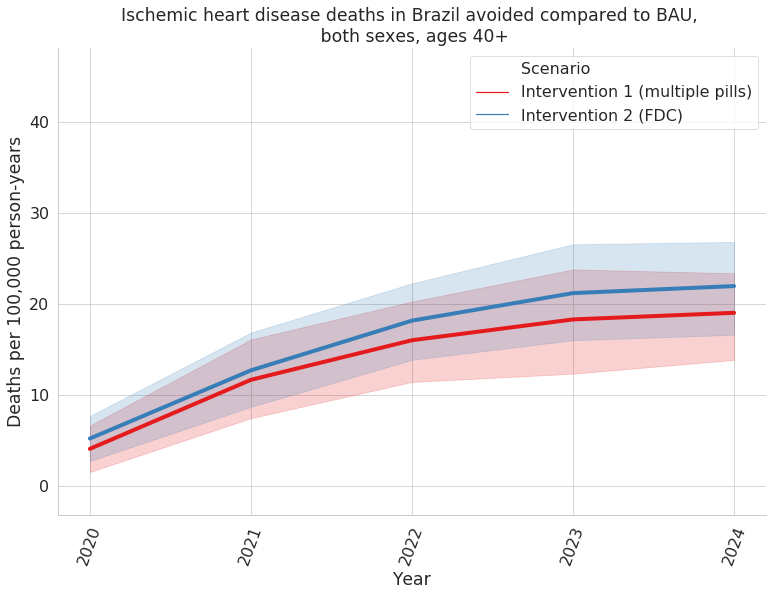

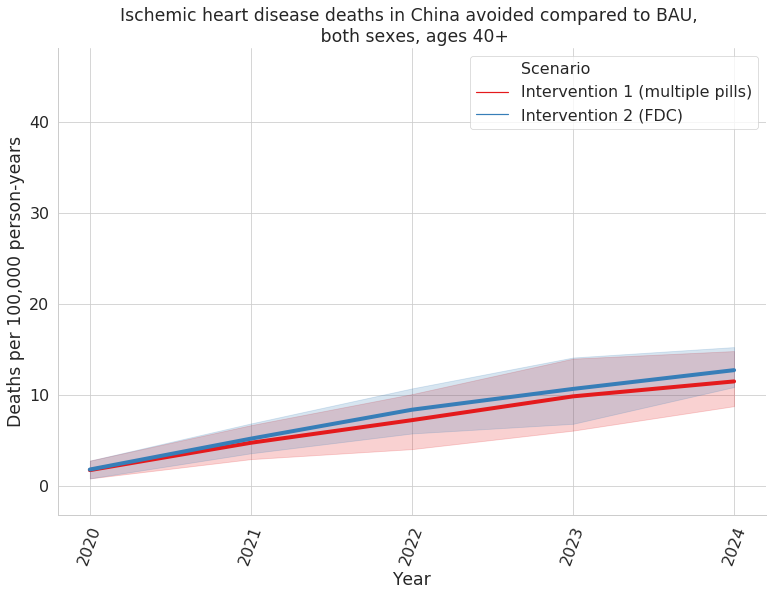

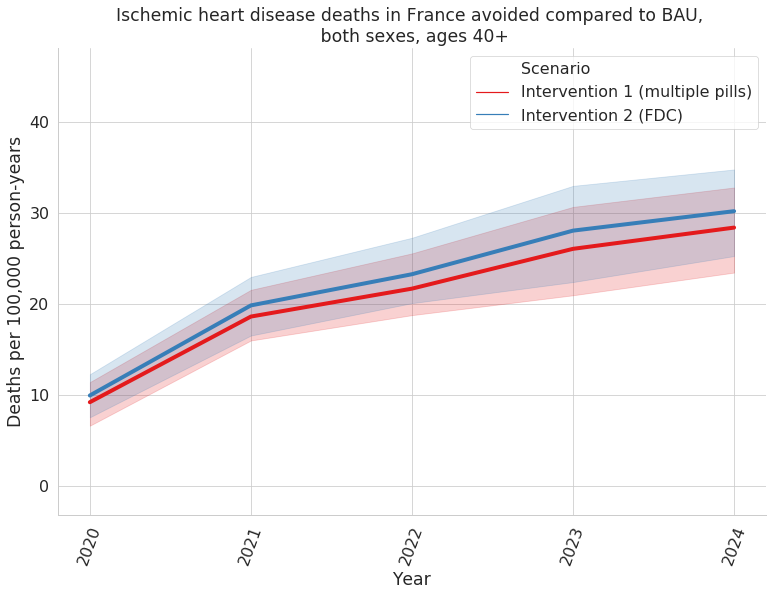

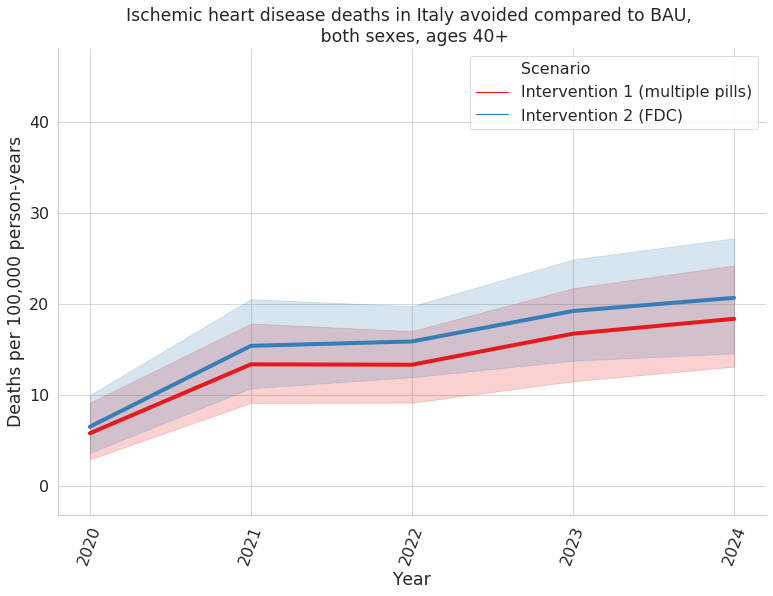

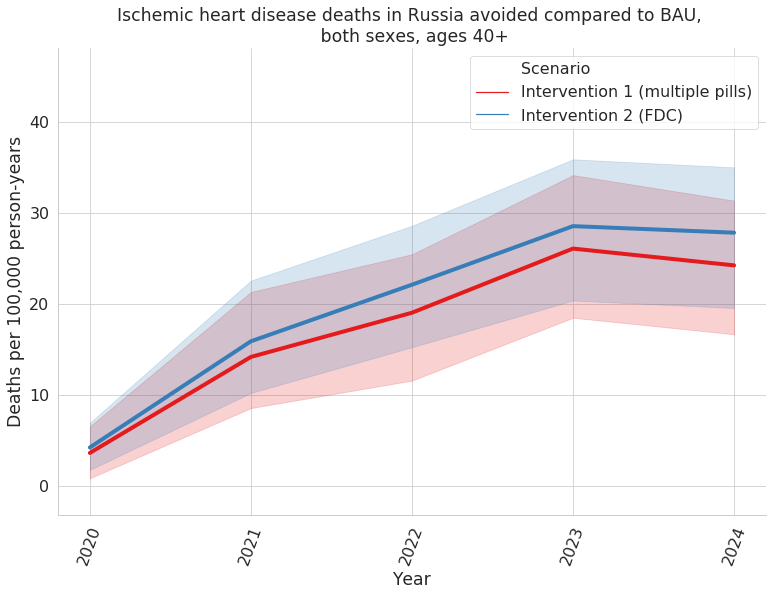

...

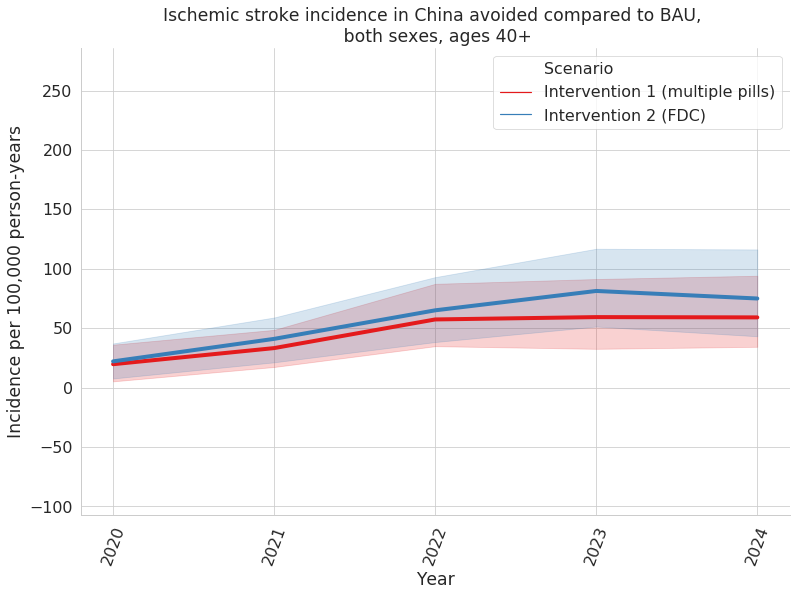

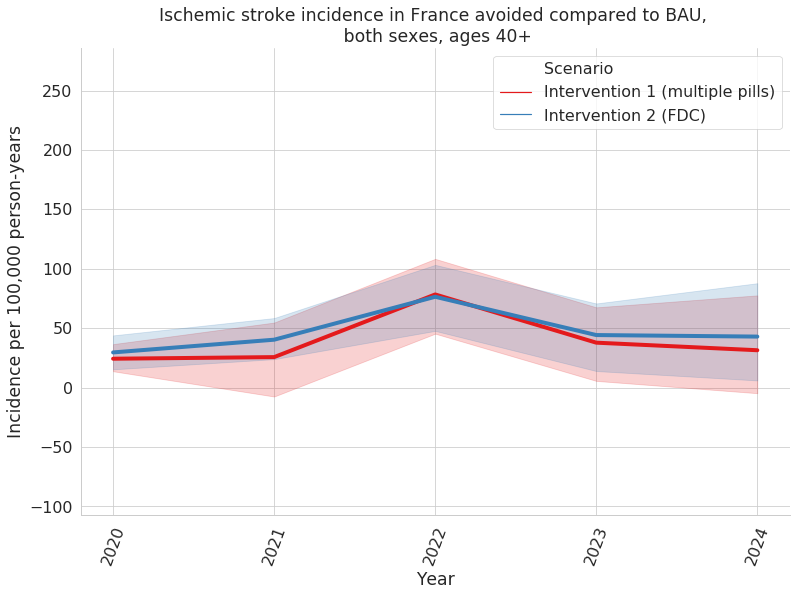

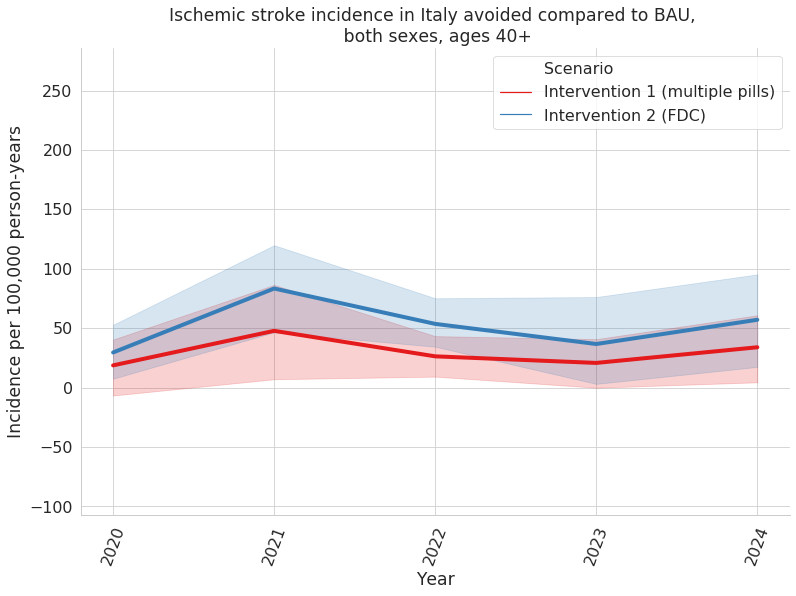

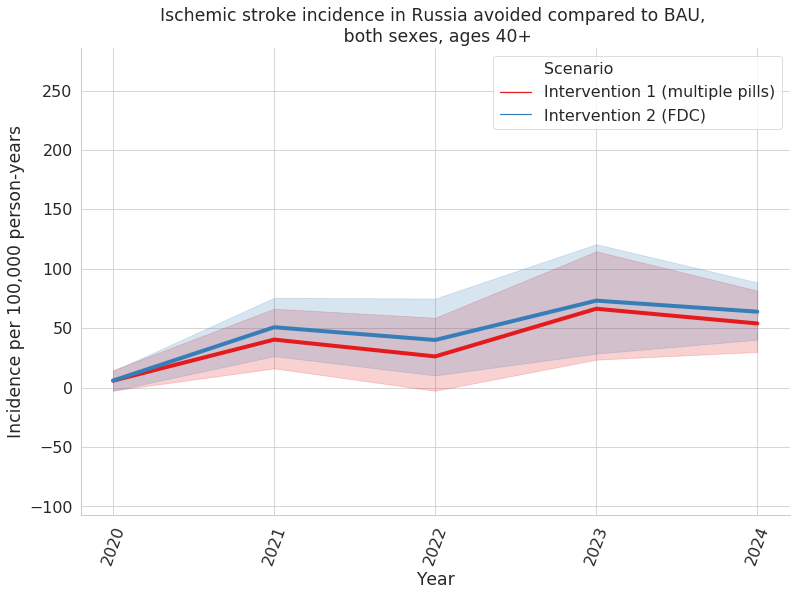

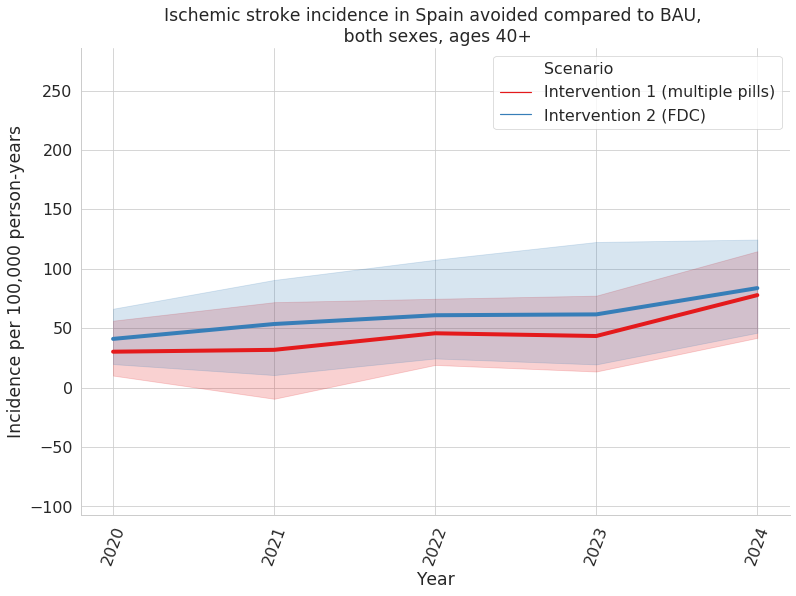

<Figure size 914.4x619.2 with 0 Axes>

In [82]:
def plot_diff_baseline_results(rates):
    cause_names = ['Ischemic heart disease', 'Ischemic stroke']
    measure_names = ['deaths', 'incidence']
    
#     scenario_list = ['Intervention 1 (multiple pills)', 'Intervention 2 (FDC)']
#     palette_list = ['#ff7c00','#1ac938']
#     palette_dict = {x:v for x,v in zip(scenario_list,palette_list)}
    
    for cause in cause_names:
        for measure in measure_names:
            for sex in ['both sexes']:
                for age in ['40+']:
                    diff_upper = rates[(rates.cause == cause) & (rates.sex == sex) & (rates.age_group == age) & (rates.Measure == measure)].difference_from_baseline_count.max()
                    diff_lower = rates[(rates.cause == cause) & (rates.sex == sex) & (rates.age_group == age) & (rates.Measure == measure)].difference_from_baseline_count.min()
                    for location in ['Brazil', 'China', 'France', 'Italy', 'Russia', 'Spain']:

                        with PdfPages(str(save_path_j)+f'/cause_measure_location_diff_baseline/{cause}_{measure}_{location}_diff_baseline_uncertainty_intervals_v2.pdf') as pdf:

                            data_r = rates[(rates.cause == cause) & (rates.sex == sex) & (rates.Measure == measure) & (rates.location == location) & (rates.age_group == age)& (rates.Scenario != 'Business as Usual')]
                            data_m = data_r.groupby(['Scenario','year']).difference_from_baseline_count.mean().reset_index()

                            g = sns.lineplot(x='year', y='difference_from_baseline_count',
                                         linewidth=4, 
                                         hue='Scenario', data=data_r)

                            g.set_title(f'{cause} {measure} in {location} avoided compared to BAU, \n {sex}, ages {age}')
                            plt.xticks(rotation=70)
                            g.set_xlabel('Year')
                            g.set_ylabel(f'{measure.capitalize()} per 100,000 person-years')
                            g.set_ylim(diff_lower,diff_upper)

                            pdf.savefig(orientation = 'landscape', bbox_inches='tight')

                            plt.show()
                            plt.clf() 

plot_diff_baseline_results(rates)


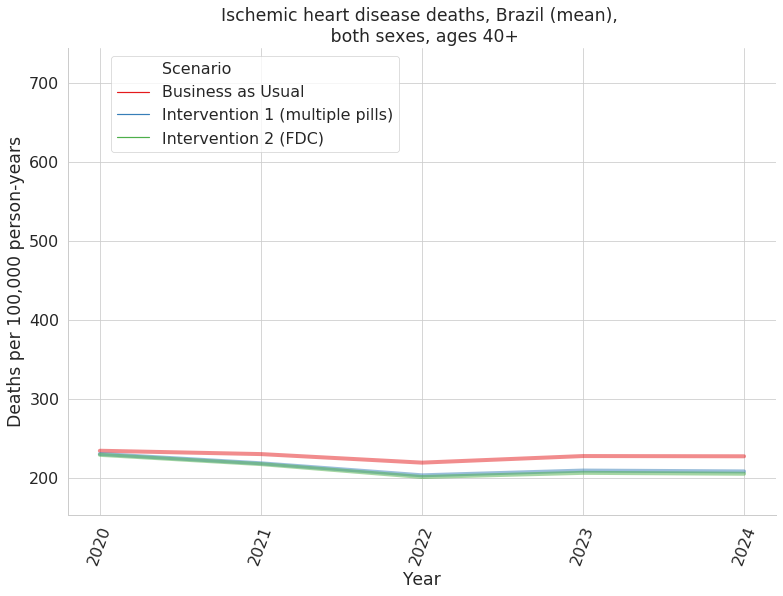

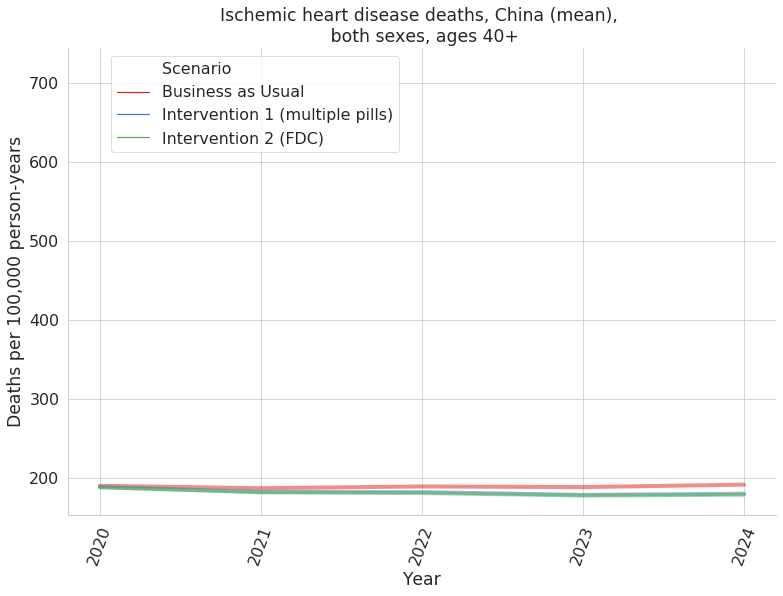

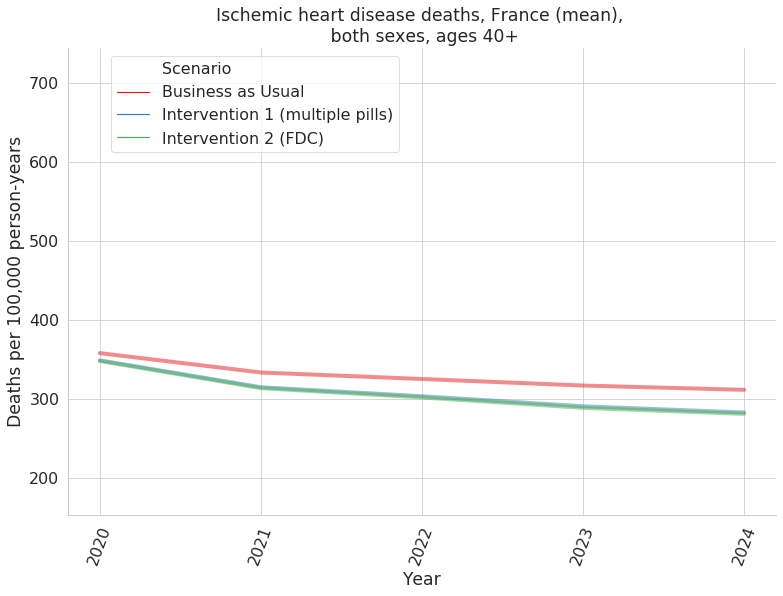

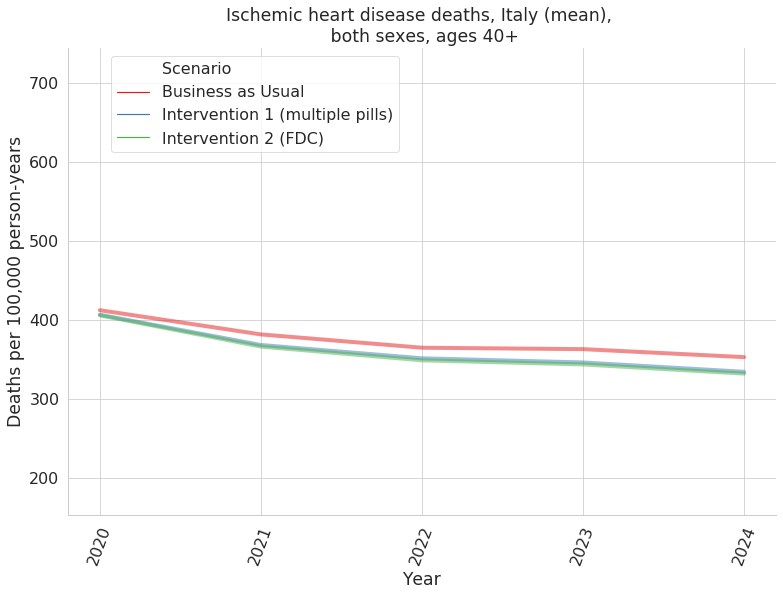

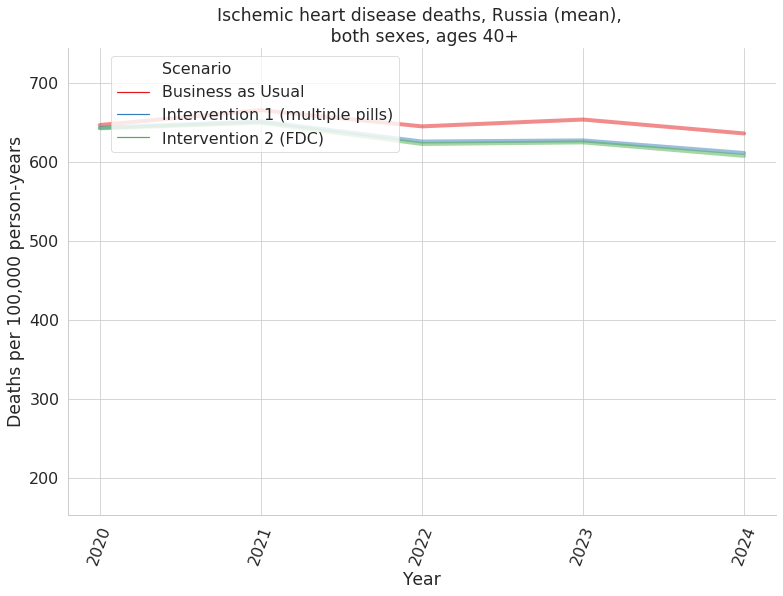

...

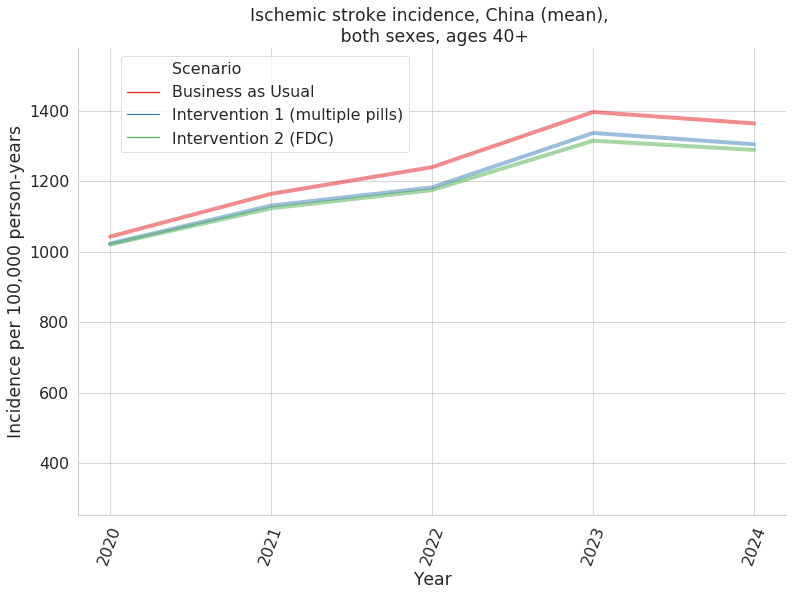

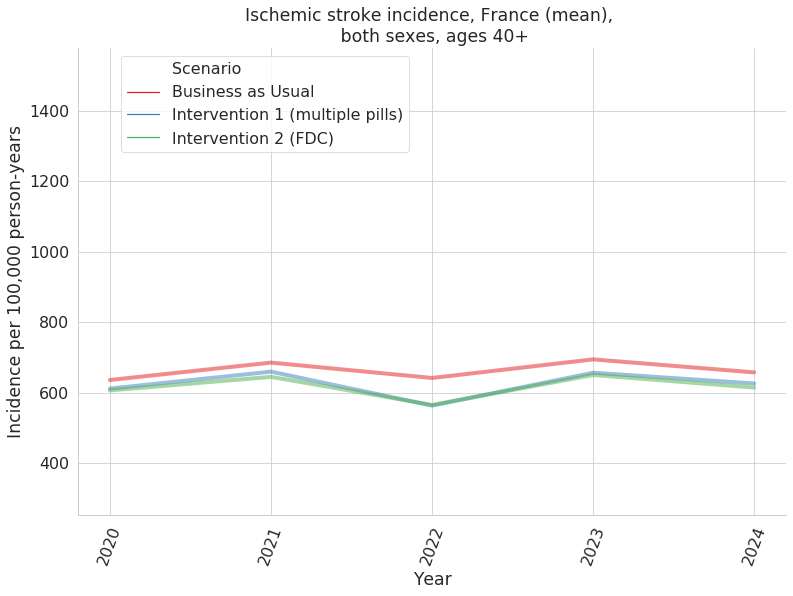

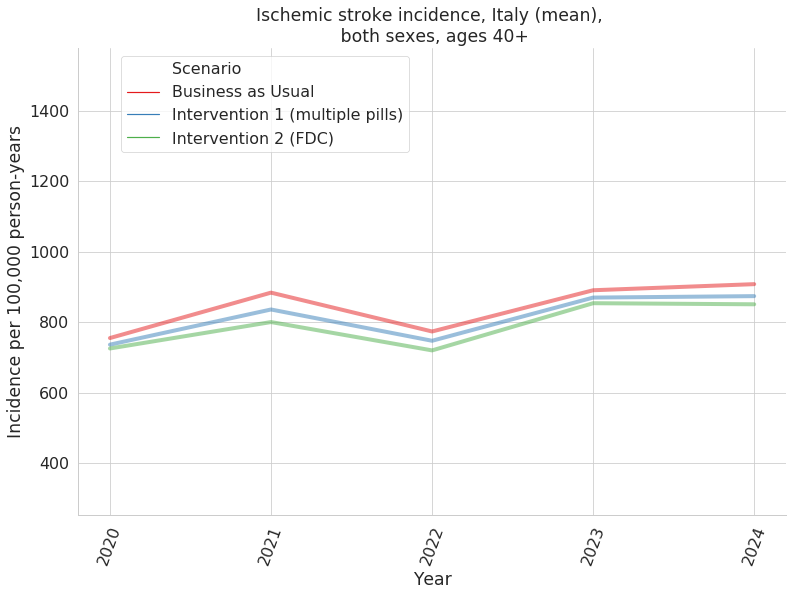

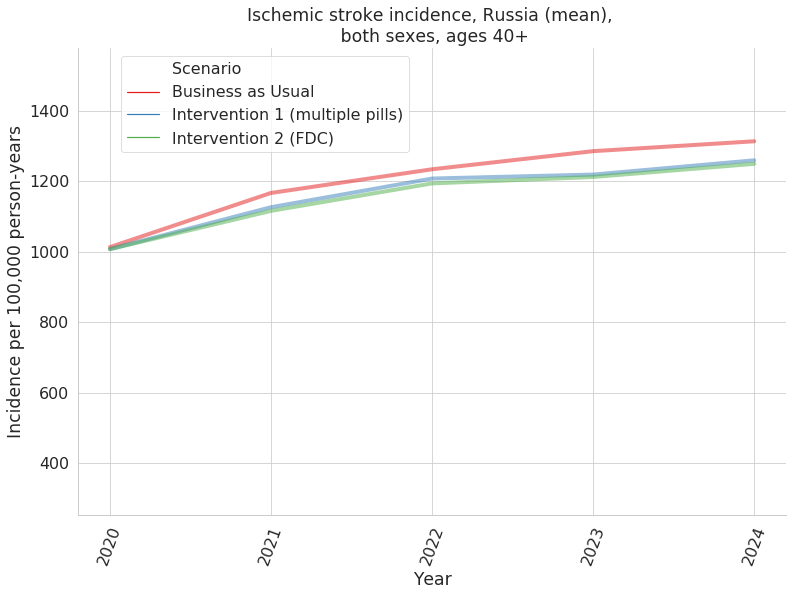

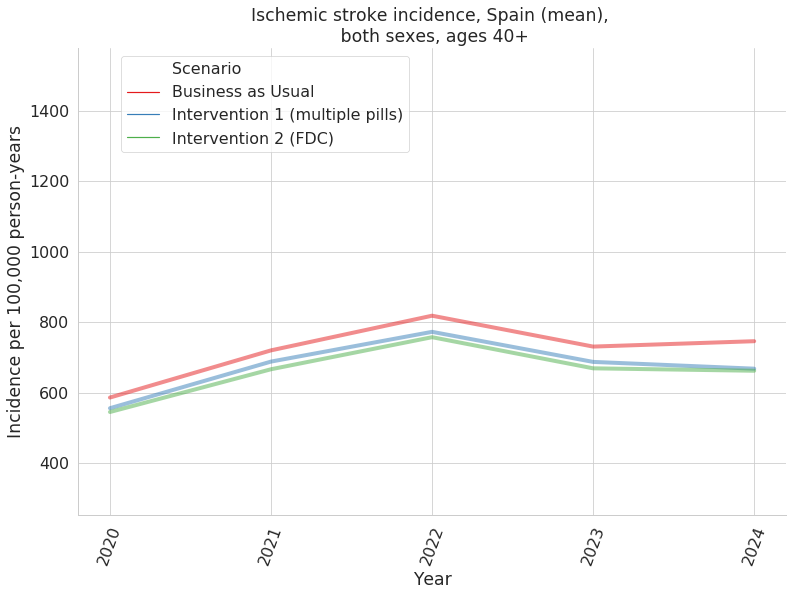

<Figure size 914.4x619.2 with 0 Axes>

In [85]:

def plot_results_mean(rates):
    cause_names = ['Ischemic heart disease', 'Ischemic stroke']
    measure_names = ['deaths', 'incidence']
    
#     scenario_list = ['Business as Usual','Intervention 1 (multiple pills)', 'Intervention 2 (FDC)']
#     palette_list = ['#023eff','#ff7c00','#1ac938']
#     palette_dict = {x:v for x,v in zip(scenario_list,palette_list)}

    for cause in cause_names:
            for measure in measure_names:
                for sex in ['both sexes']:
                    for age in ['40+']:
                        diff_upper = rates[(rates.cause == cause) & (rates.sex == sex) & (rates.age_group == age) & (rates.Measure == measure)].value.max()
                        diff_lower = rates[(rates.cause == cause) & (rates.sex == sex) & (rates.age_group == age) & (rates.Measure == measure)].value.min()

                        for location in ['Brazil', 'China', 'France', 'Italy', 'Russia', 'Spain']:

                            with PdfPages(str(save_path_j)+f'/cause_measure_location/{cause}_{measure}_{location}_mean_v2.pdf') as pdf:

                                        data_r = rates[(rates.cause == cause) & (rates.sex == sex) & (rates.Measure == measure) & (rates.location == location) & (rates.age_group == age)]
                                        data_m = data_r.groupby(['Scenario','year']).value.mean().reset_index()

                                        g = sns.lineplot(x='year', y='value',
                                                     linewidth=4, alpha=0.5,
                                                     hue='Scenario', data=data_m)

                                        g.set_title(f'{cause} {measure}, {location} (mean), \n {sex}, ages {age}')
                                        plt.xticks(rotation=70)
                                        g.set_xlabel('Year')
                                        g.set_ylabel(f'{measure.capitalize()} per 100,000 person-years')
                                        g.set_ylim(diff_lower,diff_upper)

                                        handles, labels = g.get_legend_handles_labels()
                                        g.legend(handles[:4],labels[:4],bbox_to_anchor=(0.05, 1), loc='upper left')

                                        pdf.savefig(orientation = 'landscape', bbox_inches='tight')

                                        plt.show()
                                        plt.clf() 

plot_results_mean(rates)

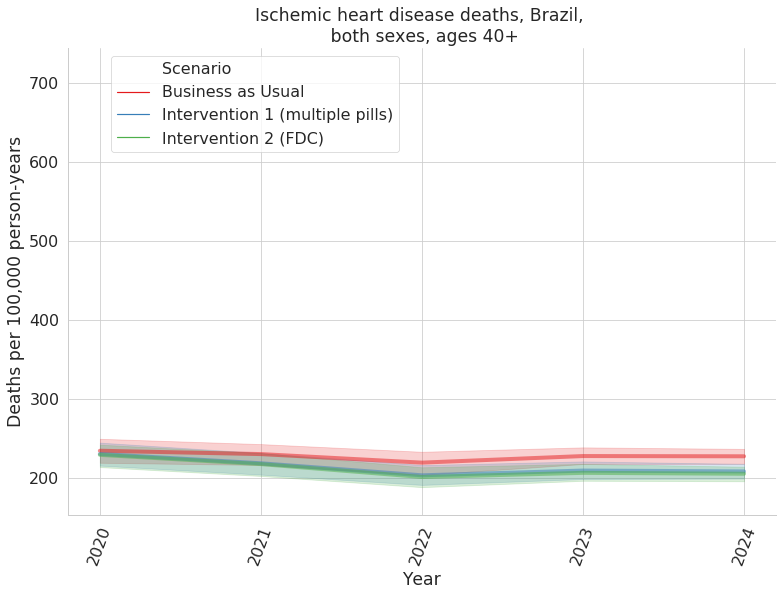

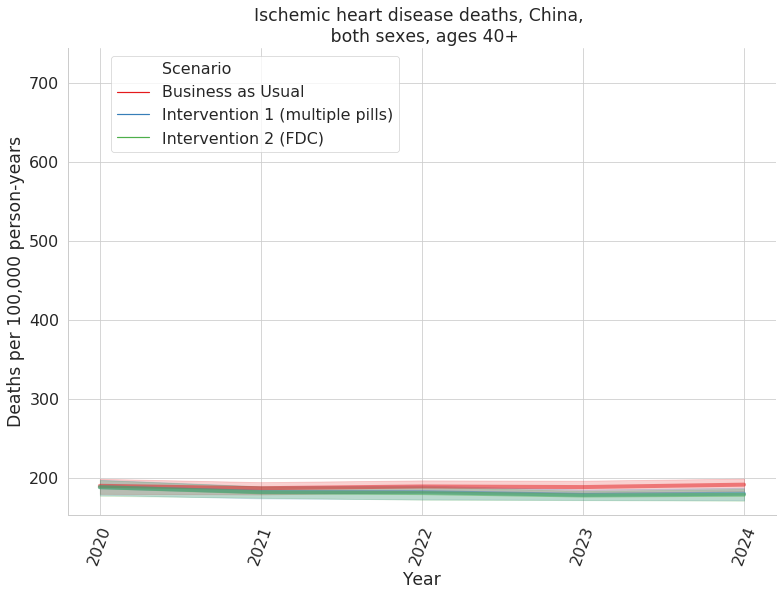

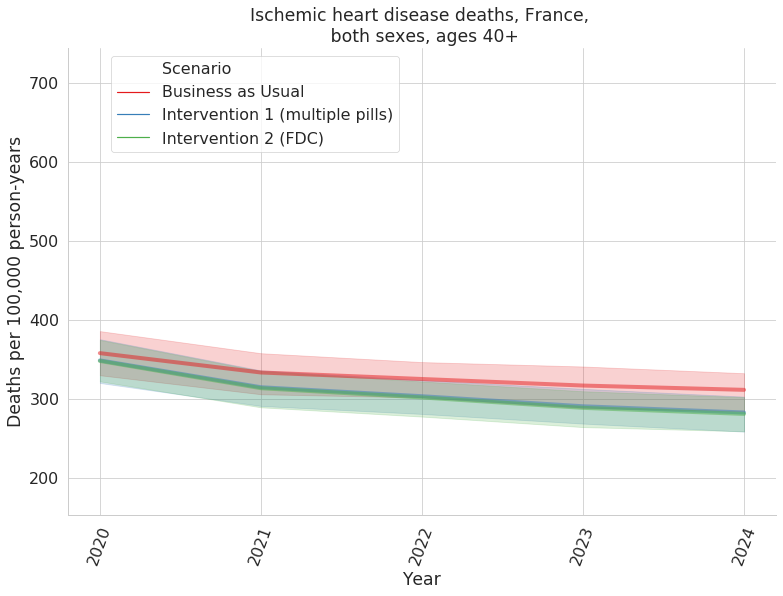

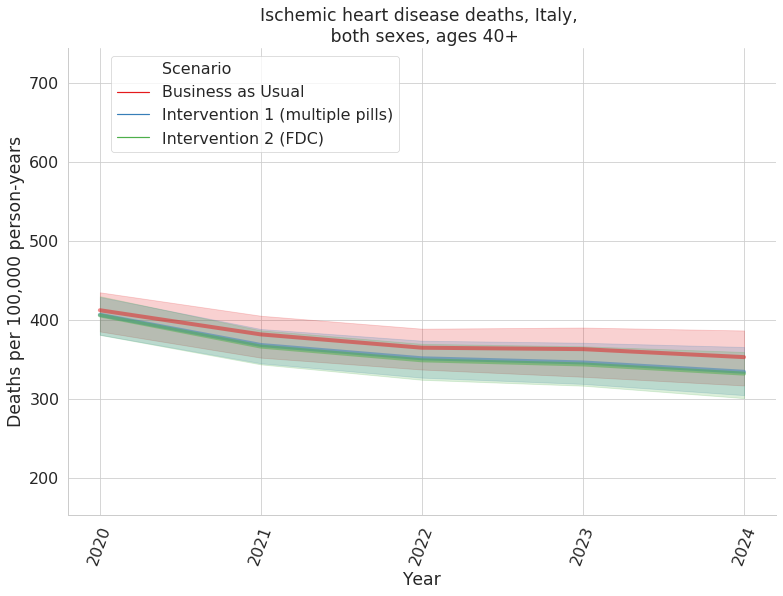

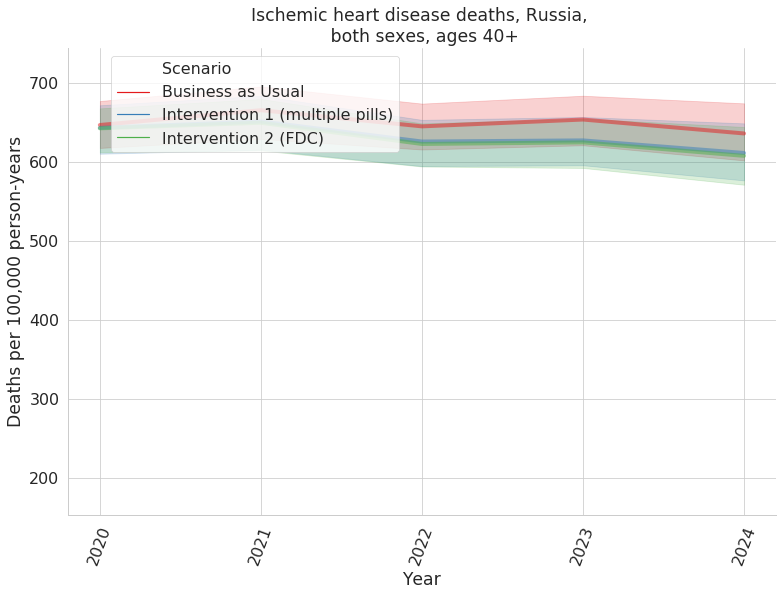

...

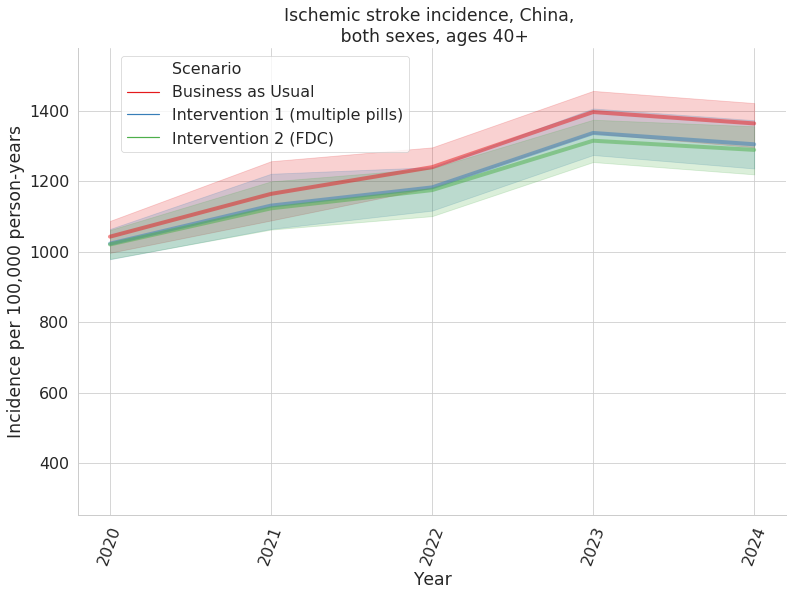

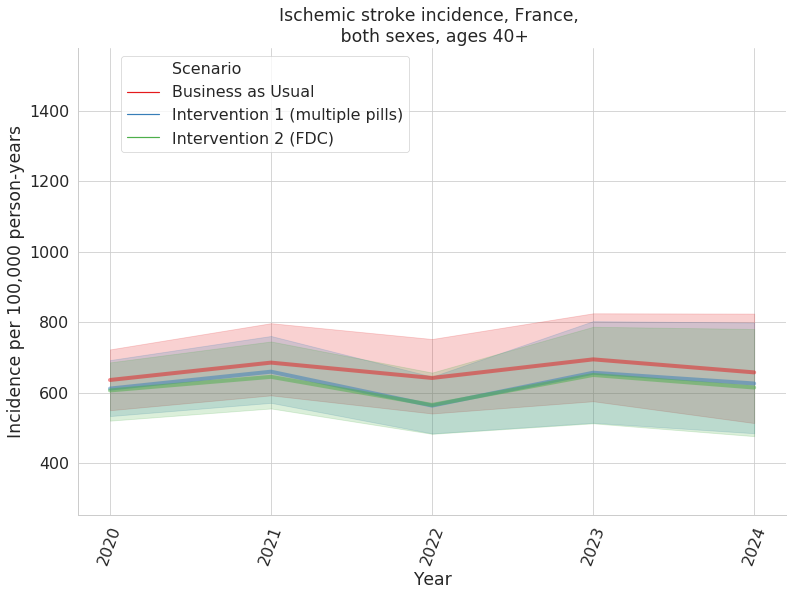

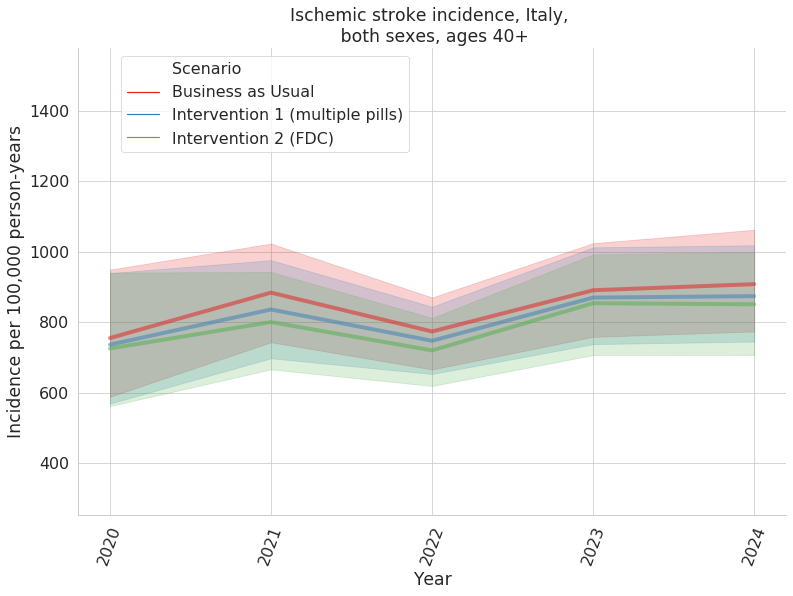

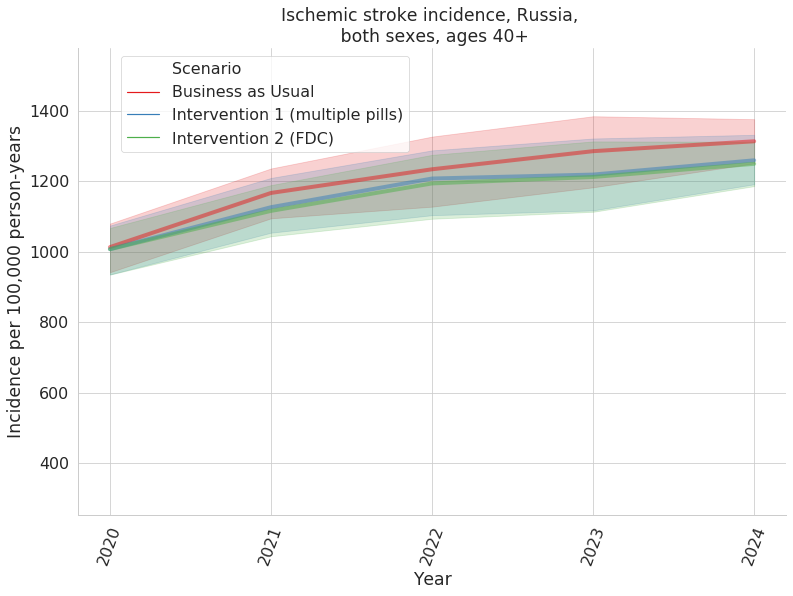

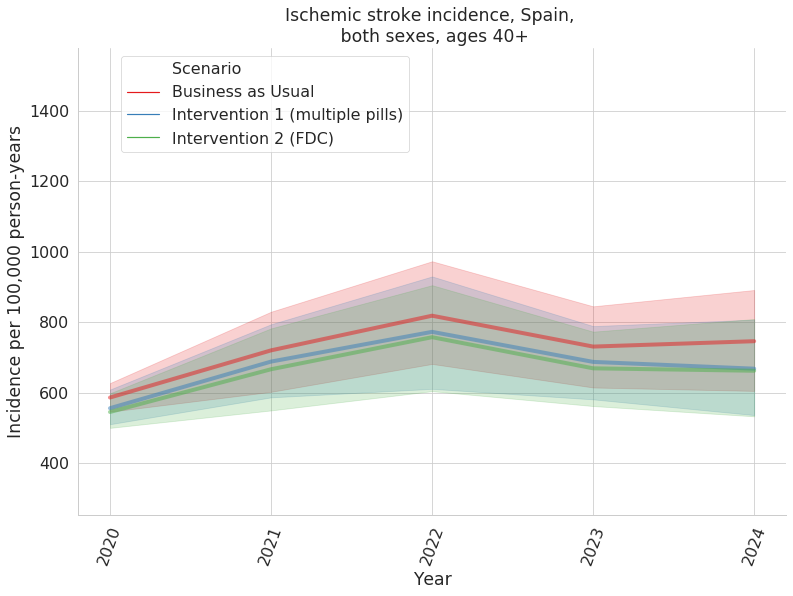

<Figure size 914.4x619.2 with 0 Axes>

In [81]:
def plot_results(rates):
    cause_names = ['Ischemic heart disease', 'Ischemic stroke']
    measure_names = ['deaths', 'incidence']
    
#     scenario_list = ['Business as Usual','Intervention 1 (multiple pills)', 'Intervention 2 (FDC)']
#     palette_list = ['#023eff','#ff7c00','#1ac938']
#     palette_dict = {x:v for x,v in zip(scenario_list,palette_list)}

    for cause in cause_names:
            for measure in measure_names:
                for sex in ['both sexes']:
                    for age in ['40+']:
                        diff_upper = rates[(rates.cause == cause) & (rates.sex == sex) & (rates.age_group == age) & (rates.Measure == measure)].value.max()
                        diff_lower = rates[(rates.cause == cause) & (rates.sex == sex) & (rates.age_group == age) & (rates.Measure == measure)].value.min()

                        for location in ['Brazil', 'China', 'France', 'Italy', 'Russia', 'Spain']:

                            with PdfPages(str(save_path_j)+f'/cause_measure_location/{cause}_{measure}_{location}_uncertainty_intervals_v2.pdf') as pdf:

                                        data_r = rates[(rates.cause == cause) & (rates.sex == sex) & (rates.Measure == measure) & (rates.location == location) & (rates.age_group == age)]
                                        data_m = data_r.groupby(['Scenario','year']).value.mean().reset_index()

                                        g = sns.lineplot(x='year', y='value',
                                                     linewidth=4, alpha=0.5,
                                                     hue='Scenario', data=data_r)

                                        g.set_title(f'{cause} {measure}, {location}, \n {sex}, ages {age}')
                                        plt.xticks(rotation=70)
                                        g.set_xlabel('Year')
                                        g.set_ylabel(f'{measure.capitalize()} per 100,000 person-years')
                                        g.set_ylim(diff_lower,diff_upper)

                                        handles, labels = g.get_legend_handles_labels()
                                        g.legend(handles[:4],labels[:4],bbox_to_anchor=(0.05, 1), loc='upper left')

                                        pdf.savefig(orientation = 'landscape', bbox_inches='tight')

                                        plt.show()
                                        plt.clf() 

plot_results(rates)

### For LDL-c: 
* do the draw level and then take the mean (x: age group, y: proportion of total person-time that is high LDL-c group of the population)
* high ldl / groupby['age_group', 'sex', 'year', ].value().sum().reset_index()

In [40]:
person_time = get_person_time(locations)

In [17]:
person_time_misc = get_person_time_misc(locations)

In [26]:
person_time_misc['scenario'].unique()

array(['baseline', 'guideline', 'guideline_and_new_treatment'],
      dtype=object)

# findings

* RT finds there is a bug

* LDL-c (high) PT is the same
* Adherence PT is different

* Decision: There is a bug. There is an error in the cholesterol calculation. As a result, they're using identical cholesterols in the risk-exposure cause relationships/health outcomes.



In [68]:
# person_time_high= person_time_misc[(person_time_misc.ldl == 'high') & (person_time_misc.measure == 'ldlc_person_time')]
person_time_adherent= person_time_misc[(person_time_misc.measure == 'adherent_person_time')]

# person_time_high.groupby(['scenario','location']).value.sum().reset_index
person_time_adherent.groupby(['scenario','location']).value.sum().reset_index()


,scenario,location,value
0,baseline,brazil,1.373929e+06
1,baseline,china,4.389183e+05
2,baseline,france,2.137824e+06
3,baseline,italy,1.142766e+06
4,baseline,russian_federation,8.819076e+05
5,guideline,brazil,5.644510e+06
6,guideline,china,3.446479e+06
7,guideline,france,6.728137e+06
8,guideline,italy,5.449450e+06
9,guideline,russian_federation,3.780361e+06


In [18]:
def get_pct_high_ldlc_pt(person_time_misc):    
    person_time_high = person_time_misc[(person_time_misc.ldl == 'high') & (person_time_misc.measure == 'ldlc_person_time')]
    person_time_total = person_time_misc[(person_time_misc.measure == 'ldlc_person_time')]
    person_time_total = person_time_misc.groupby(['age_group', 'sex', 'year', 'input_draw', 'scenario', 'location']).value.sum().reset_index()
    index_columns = ['age_group', 'sex', 'year', 'input_draw','scenario', 'location']
    person_time_high = person_time_high.set_index(index_columns).value
    person_time_total = person_time_total.set_index(index_columns).value
    pct_high_ldlc = person_time_high / person_time_total
    pct_high_ldlc = pct_high_ldlc.reset_index()
    pct_high_ldlc['location'] = pct_high_ldlc.location.map(mapping_dict_data['location'])
    pct_high_ldlc['scenario'] = pct_high_ldlc.scenario.map(mapping_dict_data['scenario'])
    pct_high_ldlc = pct_high_ldlc.rename(columns={'scenario':'Scenario'})
    return pct_high_ldlc

In [19]:
high_ldlc_pct = get_pct_high_ldlc_pt(person_time_misc)

In [30]:
high_ldlc_pct['Scenario'].unique()

array(['Business as Usual', 'Intervention 1 (multiple pills)',
       'Intervention 2 (FDC)'], dtype=object)

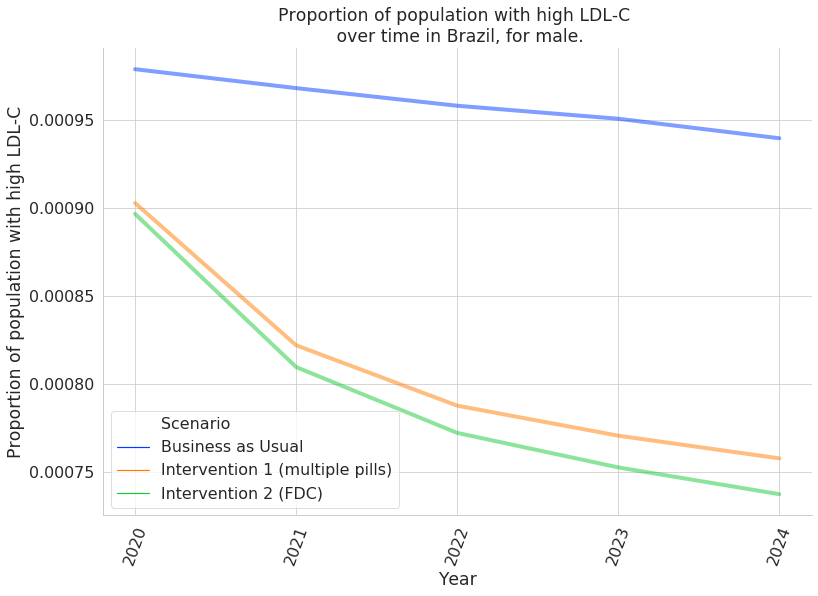

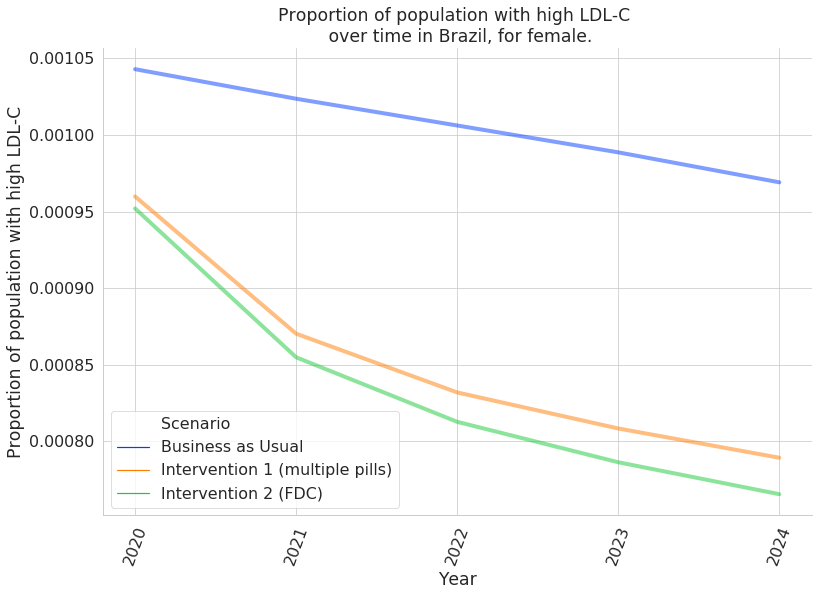

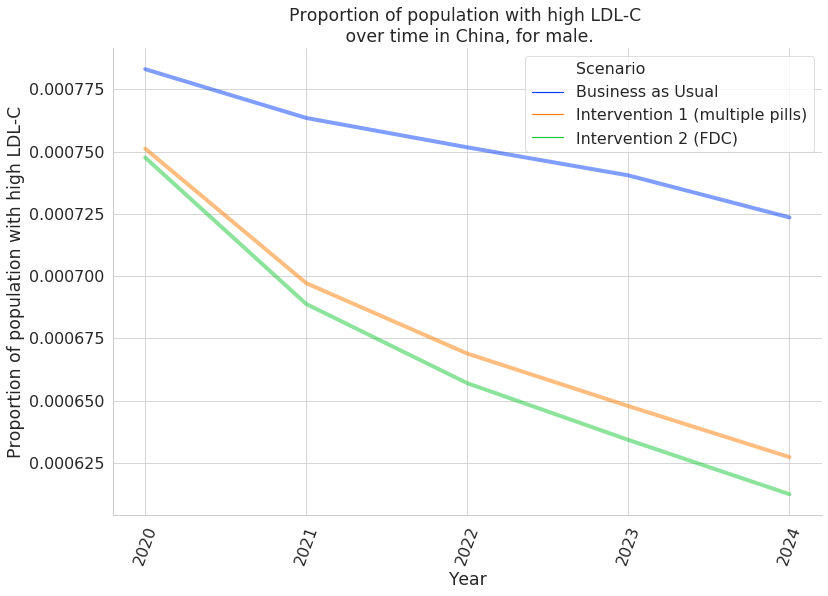

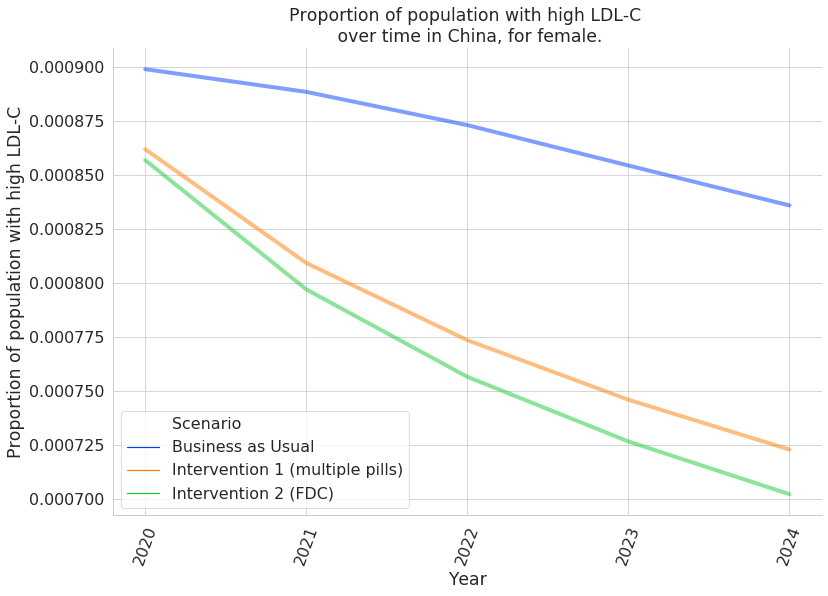

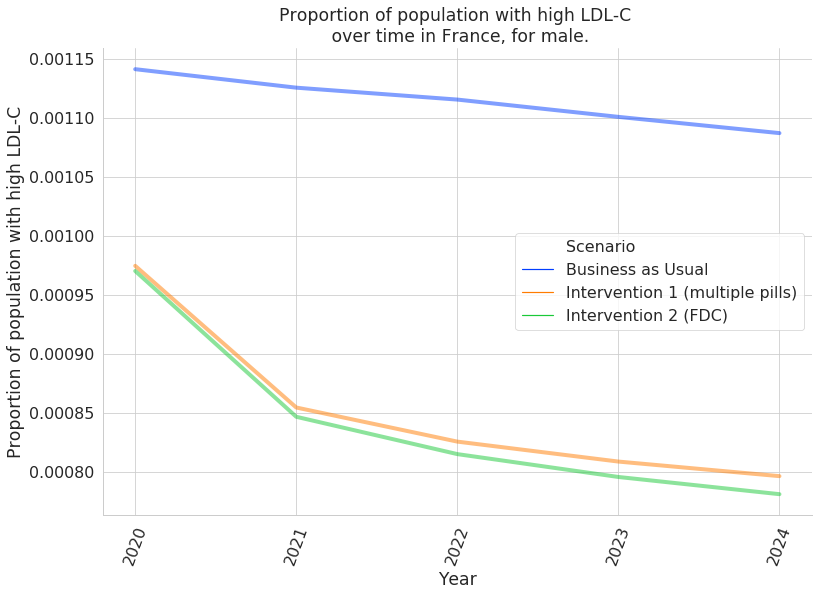

...

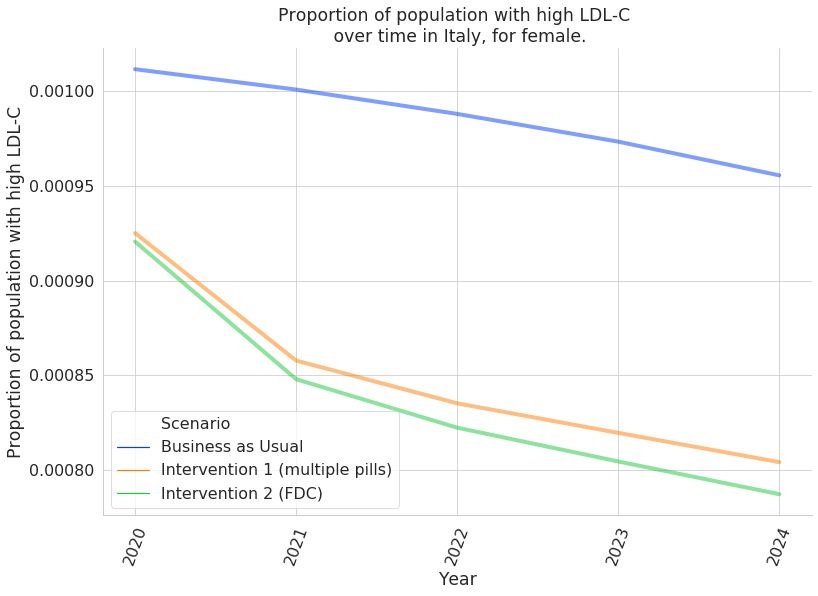

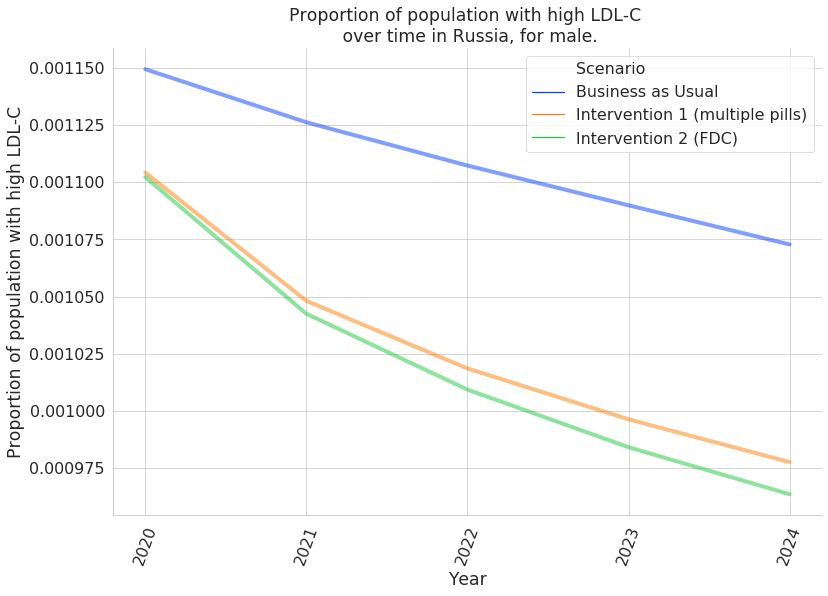

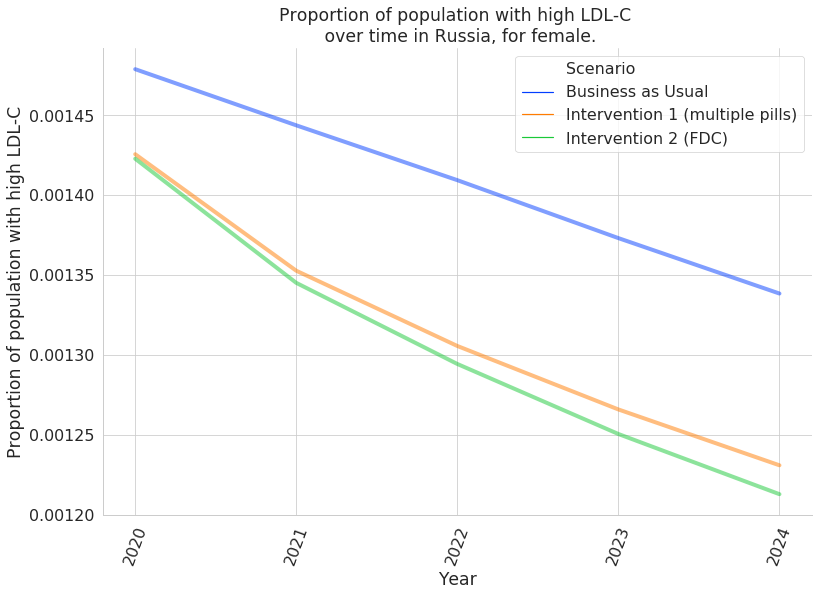

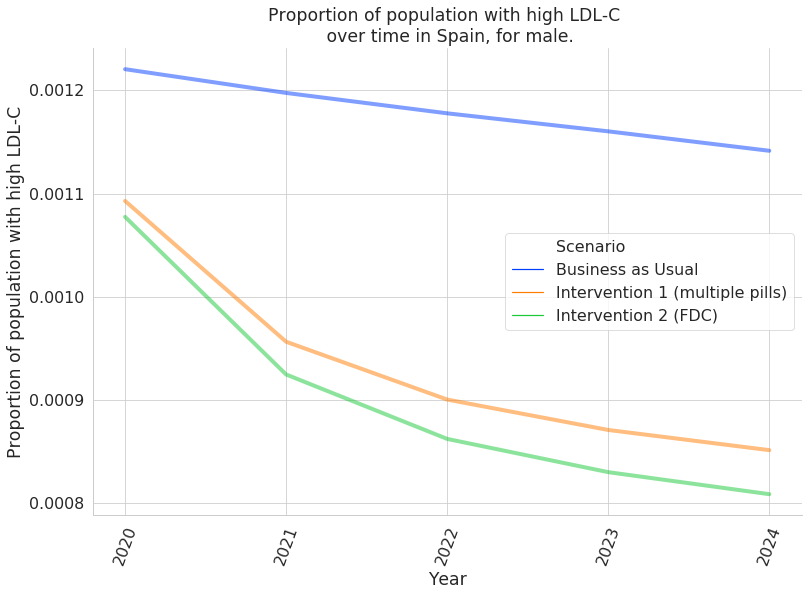

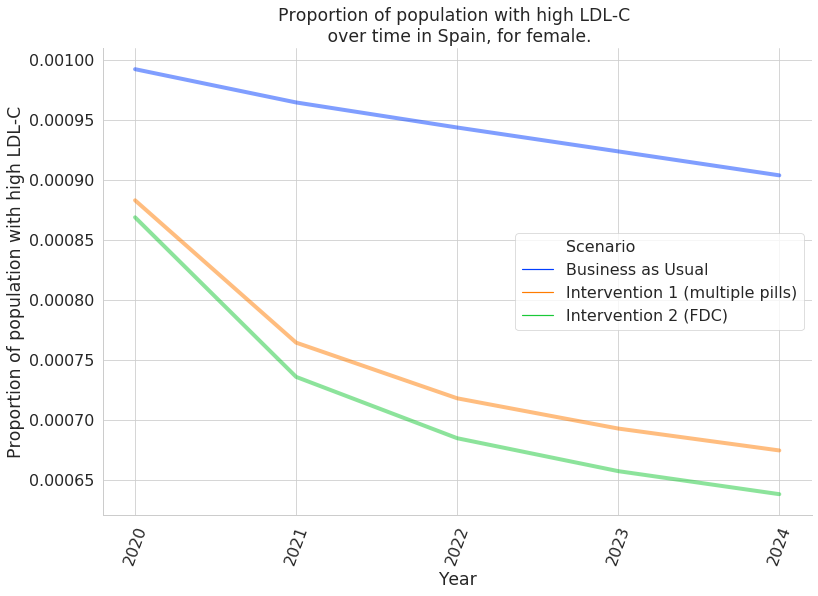

<Figure size 914.4x619.2 with 0 Axes>

In [21]:
def plot_ldl_time_series(high_ldlc_pct):
    
    scenario_list = ['Business as Usual','Intervention 1 (multiple pills)', 'Intervention 2 (FDC)']
    palette_list = ['#023eff','#ff7c00','#1ac938']
    palette_dict = {x:v for x,v in zip(scenario_list,palette_list)}

    for location in ['Brazil', 'China', 'France', 'Italy', 'Russia', 'Spain']:

        with PdfPages(str(save_path_j)+f'/ldl_c_over_time/{location}_high_ldl_c_over_time_mean.pdf') as pdf:
            for sex in ['male', 'female']:
                data_r = high_ldlc_pct[(high_ldlc_pct.sex == sex) & (high_ldlc_pct.location == location) ]
                data_m = data_r.groupby(['Scenario','year']).value.mean().reset_index()

                g = sns.lineplot(x='year', y='value', hue= 'Scenario',
                             linewidth=4, palette=palette_dict, alpha=0.5, 
                             data=data_m)

#                 g.fill_between(data_r.age_group, data_r.upper, data_r.lower, alpha=0.3, facecolor='red')

                g.set_title(f'Proportion of population with high LDL-C \n over time in {location}, for {sex}.')
                plt.xticks(rotation=70)
                g.set_xlabel('Year')
                g.set_ylabel(f'Proportion of population with high LDL-C')

                pdf.savefig(orientation = 'landscape', bbox_inches='tight')

                plt.show()
                plt.clf() 


plot_ldl_time_series(high_ldlc_pct)

## Total CVD deaths and incidence across locations, per scenario

In [210]:
def outcomes_barplot_all_countries(population_counts):
    
    cause_names = ['CVD']
    scenario_list = ['Business as Usual','Intervention 1 (multiple pills)', 'Intervention 2 (FDC)']
    palette_list = ['#000000','#ff7c00','#1ac938']
    palette_dict = {x:v for x,v in zip(scenario_list,palette_list)}
    
    for cause in cause_names:
        with PdfPages(str(save_path_j)+f'/{cause}_outcomes.pdf') as pdf:
            for measure in ['deaths', 'incidence']:
                data_r = population_counts[(population_counts.cause == cause) & (population_counts.sex == 'both sexes') & (population_counts.age_group == '40+') & (population_counts.Measure == measure)]
                data_m = data_r.groupby(['age_group', 'cause','location', 'Measure', 'Scenario', 'sex', 'year']).population_counts.mean().reset_index()
                
                data_m = data_m.groupby(['age_group', 'cause','location', 'Measure', 'Scenario', 'sex']).population_counts.sum().reset_index()

                g = sns.catplot(x="location", y= "population_counts", hue="Scenario", data=data_m, palette = palette_dict,
                        height=6, kind="bar")

                g.fig.suptitle(f'Total Cardiovascular disease-related {measure}, \n both sexes, ages 40+', fontsize=15)
                plt.subplots_adjust(top=0.85)
                plt.xticks(rotation=45, fontsize=10)
                g.set_xlabels('Location', fontsize=10)
                g.set_ylabels(f'Adjusted cumulative {measure} of \n Cardiovascular Disease (IHD, Ischemic Stroke)', fontsize=10)
                labels = g.axes[0,0].get_yticks()
                formatted_labels = ['{:,}'.format(int(label)) for label in labels]
                g.set_yticklabels(formatted_labels, fontsize=12)

                pdf.savefig(orientation = 'landscape')

                plt.show()
                plt.clf() 



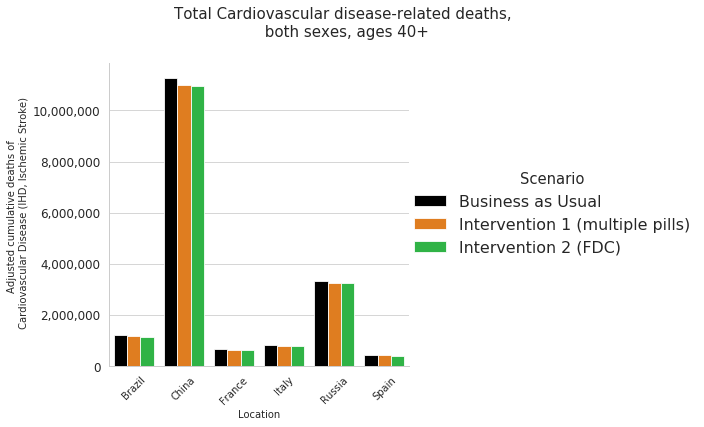

<Figure size 914.4x619.2 with 0 Axes>

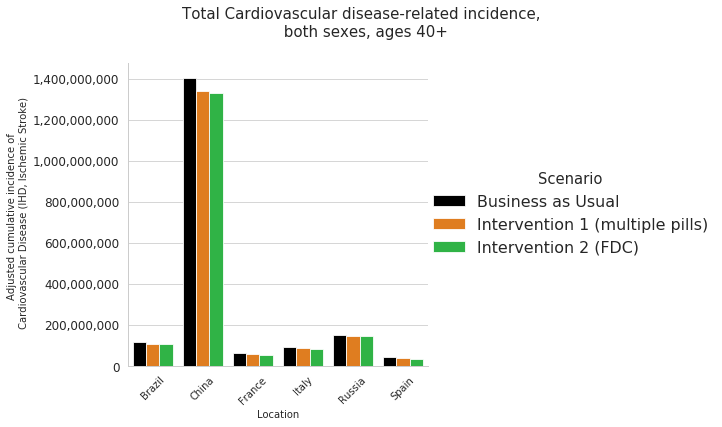

<Figure size 914.4x619.2 with 0 Axes>

In [211]:
outcomes_barplot_all_countries(population_counts)

In [127]:
def add_comma(t):
    n=1
    newt = ''
    for i in t[::-1]:
        newt+=i
        if n%3==0 and n>=3 and n<len(t):
            newt+=','
        n+=1
    return newt[::-1]

In [128]:
def reformat_labels(ticks):
    labels=[]
    pos = []
    for val in ticks:
        txt = str(int(val))
        pos.append(val)
        newtxt = add_comma(txt)
        labels.append(newtxt)
    return labels,pos

## Plot outcomes over time, for all countries in rate-space

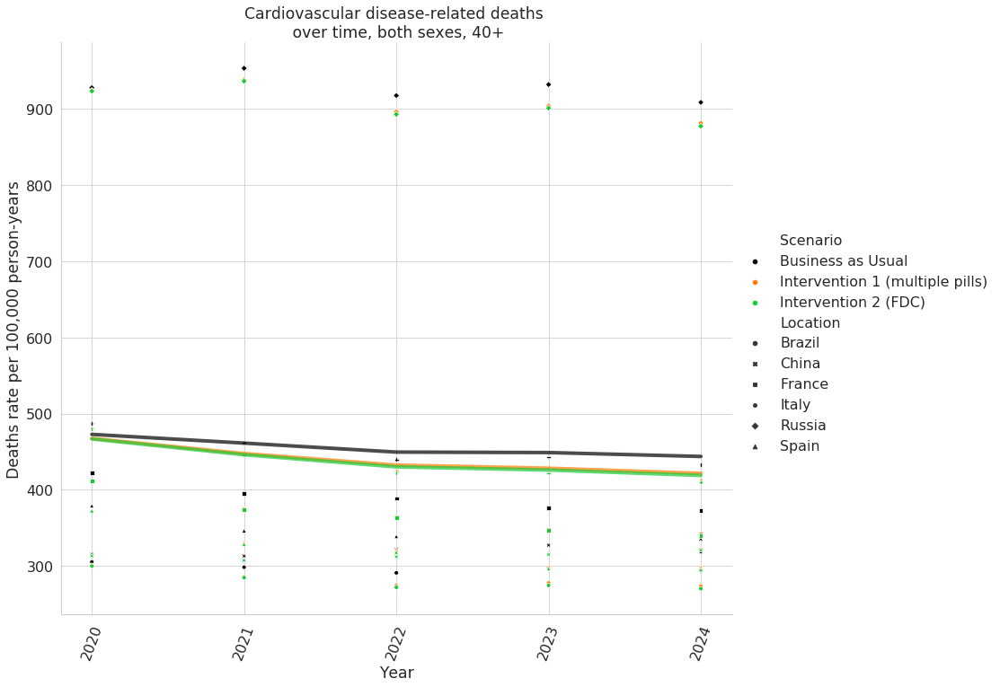

<Figure size 914.4x619.2 with 0 Axes>

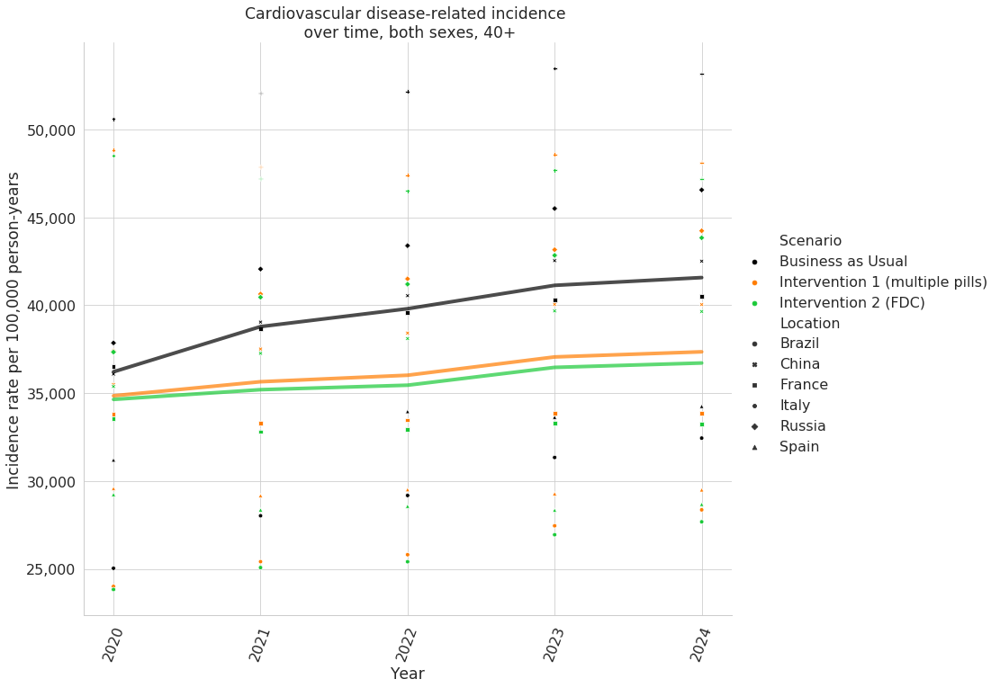

<Figure size 914.4x619.2 with 0 Axes>

In [132]:
def plot_outcomes_time_series(rates):
    
    scenario_list = ['Business as Usual','Intervention 1 (multiple pills)', 'Intervention 2 (FDC)']
    palette_list = ['#000000','#ff7c00','#1ac938']
    palette_dict = {x:v for x,v in zip(scenario_list,palette_list)}
    rates = rates.rename(columns={'location':'Location'})
    with PdfPages(str(save_path_j)+f'/cvd_outcomes_over_time.pdf') as pdf:
        for measure in ['deaths', 'incidence']:
            
                data_r = rates[(rates.sex == 'both sexes') & (rates.Measure == measure) & (rates.cause == 'CVD') & (rates.age_group == '40+')]
                data_m = data_r.groupby(['Scenario', 'year', 'Location']).value.mean().reset_index()
                data_all = data_m.groupby(['Scenario', 'year']).value.mean().reset_index()
            
                g = sns.relplot(x='year', y='value', hue='Scenario', style='Location',
                                        height=10, palette=palette_dict, aspect=1.2,
                                        data=data_m)

                sns.lineplot(x='year', y='value', hue = 'Scenario',
                             linewidth=4, alpha=0.7, ax=g.ax, palette=palette_dict, legend=False,
                             data=data_all)

#                 g.fill_between(data_r.age_group, data_r.upper, data_r.lower, alpha=0.3, facecolor='red')

                g.ax.set_title(f'Cardiovascular disease-related {measure} \n over time, both sexes, 40+')
                g.ax.set_xticklabels(g.ax.get_xticklabels(), rotation=70)                
                g.ax.set_xlabel('Year')
                g.ax.set_ylabel(f'{measure.capitalize()} rate per 100,000 person-years')
                labels = g.axes[0,0].get_yticks()
                formatted_labels = ['{:,}'.format(int(label)) for label in labels]
                g.set_yticklabels(formatted_labels)
                pdf.savefig(orientation = 'landscape', bbox_inches='tight')

                plt.show()
                plt.clf() 


plot_outcomes_time_series(rates)

## Outcomes averted, with population 

In [202]:
def outcomes_averted_population_counts(population_counts):
    
    cause_names = ['CVD']
    
    scenario_list = ['Intervention 1 (multiple pills)', 'Intervention 2 (FDC)']
    palette_list = ['#ff7c00','#1ac938']
    palette_dict = {x:v for x,v in zip(scenario_list,palette_list)}

    
    for cause in cause_names:
        with PdfPages(str(save_path_j)+f'/outcomes_averted/{cause}_outcomes_averted_population_counts.pdf') as pdf:
            for measure in ['deaths', 'incidence']:
#             for scenario in ['Intervention 1 (multiple pills)', 'Intervention 2 (FDC)']:    
                data_r = population_counts[(population_counts.cause == cause) & (population_counts.sex == 'both sexes') & (population_counts.age_group == '40+') & (population_counts.Measure == measure) & (population_counts.Scenario != 'Business as Usual')]
                data_m = data_r.groupby(['age_group', 'cause','location', 'Measure', 'Scenario', 'sex', 'year']).population_difference_from_baseline.mean().reset_index()
                data_m = data_m.groupby(['age_group', 'cause','location', 'Measure', 'Scenario', 'sex']).population_difference_from_baseline.sum().reset_index()

                g = sns.catplot(x="location", y= "population_difference_from_baseline", hue="Scenario", data=data_m, palette = palette_dict,
                        height=6, kind="bar")

                g.fig.suptitle(f'{cause} {measure} avoided compared to BAU, \n both sexes, ages 40+', fontsize=15)
                plt.subplots_adjust(top=0.85)
                plt.xticks(rotation=45, fontsize=10)
                g.set_xlabels('Location', fontsize=10)
                g.set_ylabels(f'{measure.capitalize()} avoided, population count', fontsize=10)
                labels = g.axes[0,0].get_yticks()
                formatted_labels = ['{:,}'.format(int(label)) for label in labels]
                g.set_yticklabels(formatted_labels)

                pdf.savefig(orientation = 'landscape')

                plt.show()
                plt.clf() 

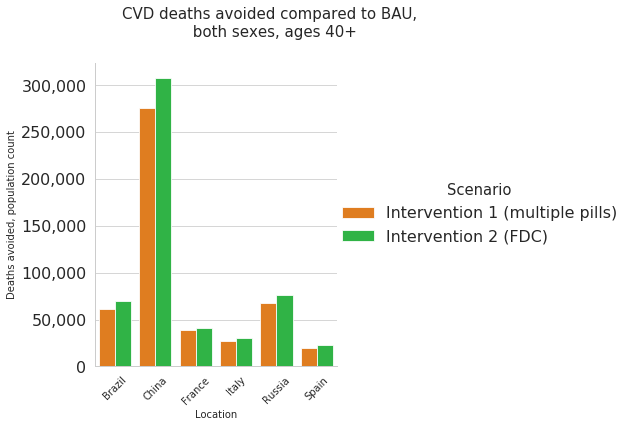

<Figure size 914.4x619.2 with 0 Axes>

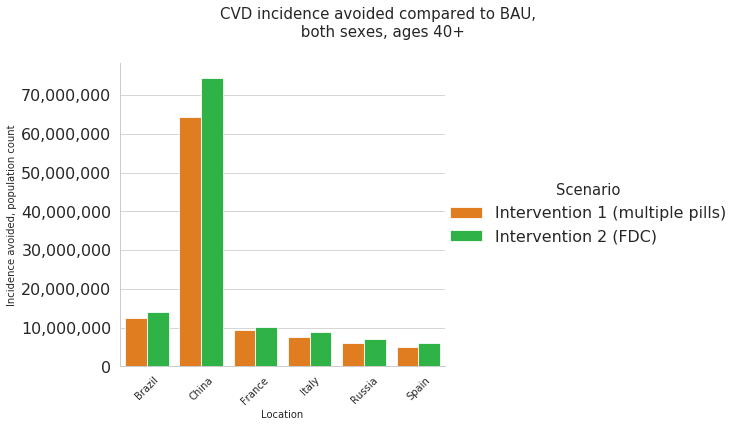

<Figure size 914.4x619.2 with 0 Axes>

In [203]:
outcomes_averted_population_counts(population_counts)

In [78]:
def outcomes_averted_countries(rates):
    
    cause_names = ['Ischemic heart disease', 'Ischemic stroke']
    
    for cause in cause_names:
        with PdfPages(str(save_path_j)+f'/outcomes_averted/{cause}_outcomes_averted.pdf') as pdf:
            for measure in ['deaths', 'incidence']:
#             for scenario in ['Intervention 1 (multiple pills)', 'Intervention 2 (FDC)']:    
                data_r = rates[(rates.cause == cause) & (rates.sex == 'both sexes') & (rates.age_group == '40+') & (rates.Measure == measure) & (rates.Scenario != 'Business as Usual') ]
                data_m = data_r.groupby(['age_group', 'cause','location', 'Measure', 'Scenario', 'sex', 'year']).difference_from_baseline_count.mean().reset_index()
                data_m = data_m.groupby(['age_group', 'cause','location', 'Measure', 'Scenario', 'sex']).difference_from_baseline_count.sum().reset_index()

                g = sns.catplot(x="location", y= "difference_from_baseline_count", hue="Scenario", data=data_m,
                        height=6, kind="bar")

                g.fig.suptitle(f'{cause} {measure} avoided compared to BAU, \n both sexes, ages 40+', fontsize=15)
                plt.subplots_adjust(top=0.85)
                plt.xticks(rotation=45, fontsize=10)
                g.set_xlabels('Location', fontsize=10)
                g.set_ylabels(f'{measure.capitalize()} per 100,000 person-years', fontsize=10)

                pdf.savefig(orientation = 'landscape')

                plt.show()
                plt.clf() 



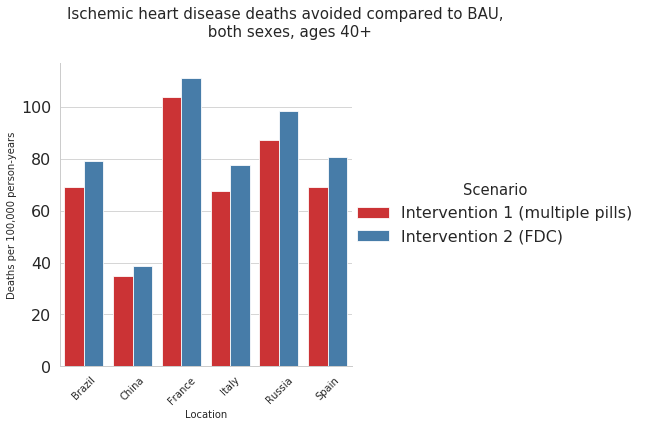

<Figure size 914.4x619.2 with 0 Axes>

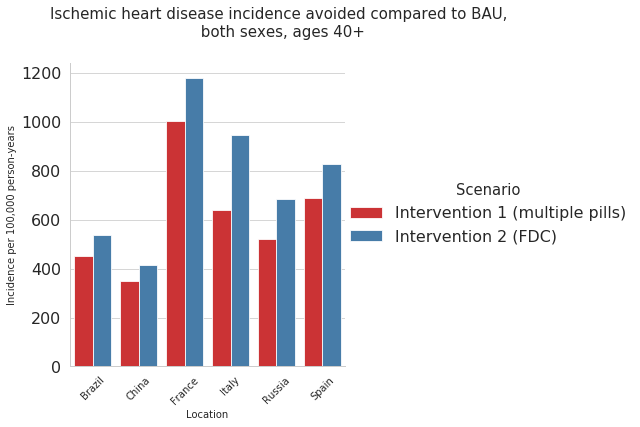

<Figure size 914.4x619.2 with 0 Axes>

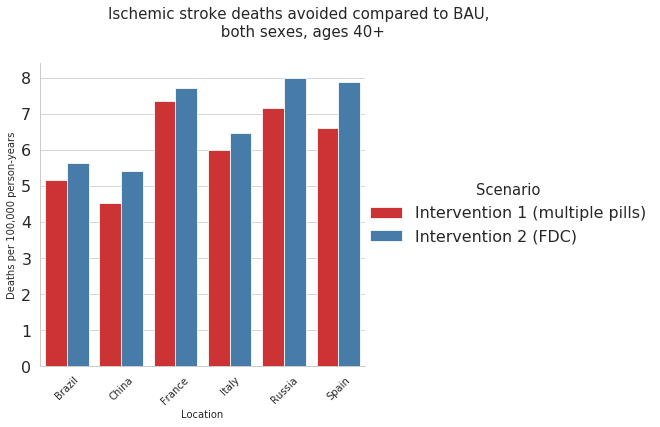

<Figure size 914.4x619.2 with 0 Axes>

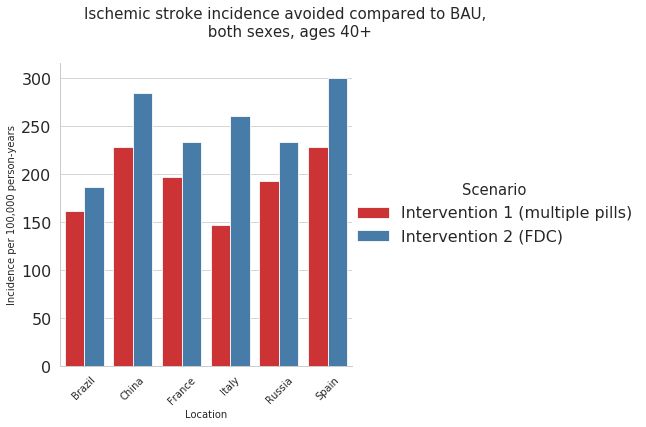

<Figure size 914.4x619.2 with 0 Axes>

In [79]:
outcomes_averted_countries(rates)

In [38]:
person_time_misc['measure'].unique()

array(['fpg_person_time', 'sbp_person_time', 'ldlc_person_time',
       'cv_risk_score_person_time', 'adherent_person_time',
       'at_target_person_time', 'none_person_time',
       'lifestyle_intervention_person_time', 'fibrates_person_time',
       'ezetimibe_person_time', 'low_potency_statin_low_dose_person_time',
       'low_potency_statin_high_dose_person_time',
       'high_potency_statin_low_dose_person_time',
       'high_potency_statin_high_dose_person_time',
       'low_potency_statin_low_dose_multi_person_time',
       'low_potency_statin_high_dose_multi_person_time',
       'high_potency_statin_low_dose_multi_person_time',
       'high_potency_statin_high_dose_multi_person_time',
       'low_potency_statin_low_dose_fdc_person_time',
       'low_potency_statin_high_dose_fdc_person_time',
       'high_potency_statin_low_dose_fdc_person_time',
       'high_potency_statin_high_dose_fdc_person_time'], dtype=object)

In [154]:
person_time_adherent = person_time_misc[(person_time_misc.measure == 'adherent_person_time') & ((person_time_misc.age_group != '30_to_34') | (person_time_misc.age_group != '35_to_39'))]
                                                                                                

In [164]:
person_time_adherent[(person_time_adherent.scenario != 'baseline') & (person_time_adherent.age_group == '60_to_64') & (person_time_adherent.sex == 'male') & (person_time_adherent.year == '2022') & (person_time_adherent.input_draw == 29) & (person_time_adherent.acs == 'post') & (person_time_adherent.fpg == 'high') & (person_time_adherent.sbp == 'high') & (person_time_adherent.ldl == 'high')]



,age_group,sex,year,input_draw,scenario,value,acs,fpg,sbp,ldl,measure,location
707876,60_to_64,male,2022,29,guideline,12.878850,post,high,high,high,adherent_person_time,brazil
708228,60_to_64,male,2022,29,guideline_and_new_treatment,12.878850,post,high,high,high,adherent_person_time,brazil
707876,60_to_64,male,2022,29,guideline,1.763176,post,high,high,high,adherent_person_time,china
708228,60_to_64,male,2022,29,guideline_and_new_treatment,1.763176,post,high,high,high,adherent_person_time,china
707876,60_to_64,male,2022,29,guideline,5.672827,post,high,high,high,adherent_person_time,france
708228,60_to_64,male,2022,29,guideline_and_new_treatment,5.672827,post,high,high,high,adherent_person_time,france
707876,60_to_64,male,2022,29,guideline,3.986311,post,high,high,high,adherent_person_time,italy
708228,60_to_64,male,2022,29,guideline_and_new_treatment,3.986311,post,high,high,high,adherent_person_time,italy
707876,60_to_64,male,2022,29,guideline,1.149897,post,high,high,high,adherent_person_time,russian_federation
708228,60_to_64,male,2022,29,guideline_and_new_treatment,1.149897,post,high,high,high,adherent_person_time,russian_federation


In [22]:
def get_person_time_adherent():
    person_time_adherent = person_time_misc[(person_time_misc.measure == 'adherent_person_time') & ((person_time_misc.age_group != '30_to_34') | (person_time_misc.age_group != '35_to_39'))]
    person_time_adherent['scenario'] = person_time_adherent.scenario.map(mapping_dict_data['scenario'])
    person_time_adherent['location'] = person_time_adherent.location.map(mapping_dict_data['location'])
    adherence_df = person_time_adherent.groupby(['age_group', 'sex', 'location','scenario','year']).value.mean().reset_index()
    adherence_df = adherence_df.groupby(['location','scenario','year']).value.sum().reset_index()
    adherence_df = adherence_df.rename(columns={'scenario':'Scenario'})
    return adherence_df

In [23]:
adherence = get_person_time_adherent()

/share/code/santonis/miniconda/envs/validation/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/share/code/santonis/miniconda/envs/validation/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


In [24]:
def get_person_time_fdc():
    person_time_fdc = person_time_misc[(person_time_misc.measure.str.contains('fdc')) & ((person_time_misc.age_group != '30_to_34') | (person_time_misc.age_group != '35_to_39'))]
    person_time_fdc['scenario'] = person_time_fdc.scenario.map(mapping_dict_data['scenario'])
    person_time_fdc['location'] = person_time_fdc.location.map(mapping_dict_data['location'])
    person_time_fdc_df = person_time_fdc.groupby(['age_group', 'sex', 'location','scenario','year']).value.mean().reset_index()
    person_time_fdc_df = person_time_fdc_df.groupby(['location','scenario','year']).value.sum().reset_index()
    person_time_fdc_df = person_time_fdc_df.rename(columns={'scenario':'Scenario'})
    return person_time_fdc_df

In [25]:
fdc = get_person_time_fdc()

/share/code/santonis/miniconda/envs/validation/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/share/code/santonis/miniconda/envs/validation/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


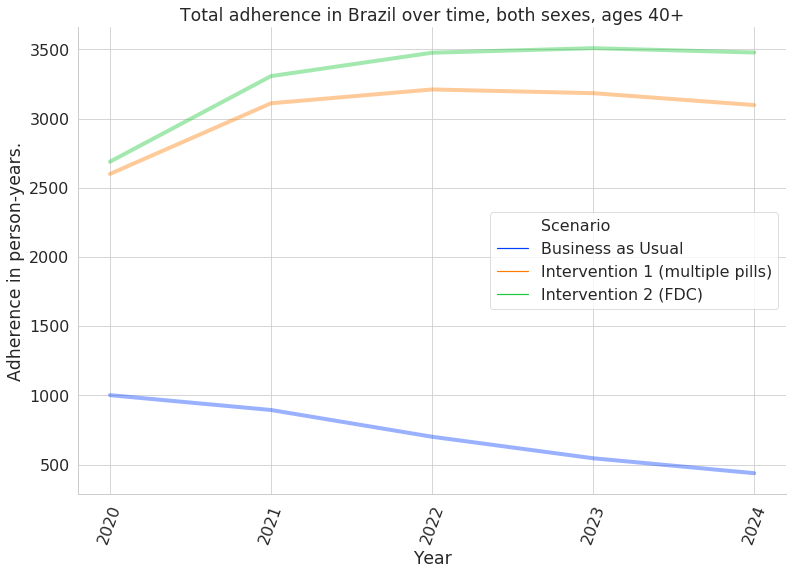

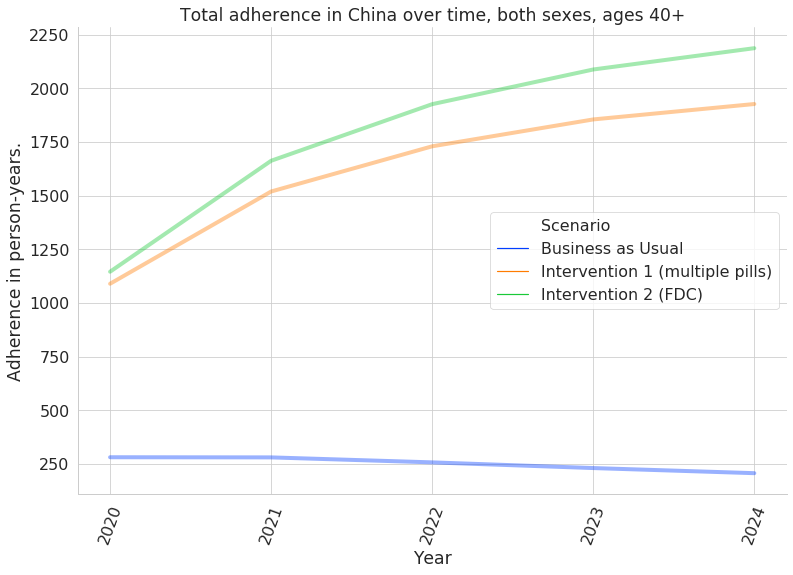

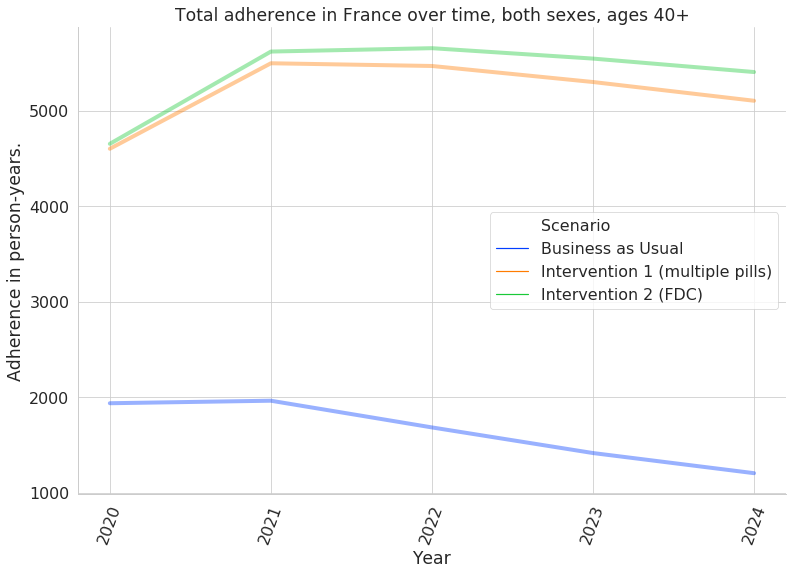

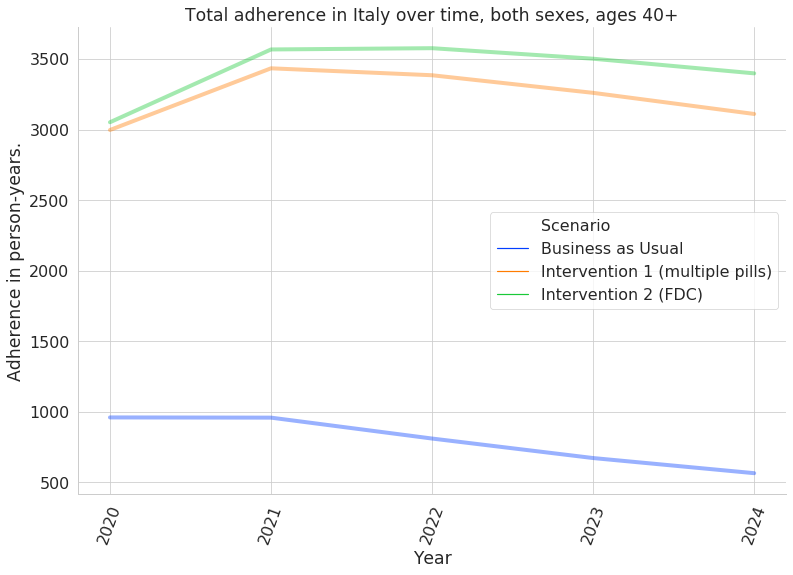

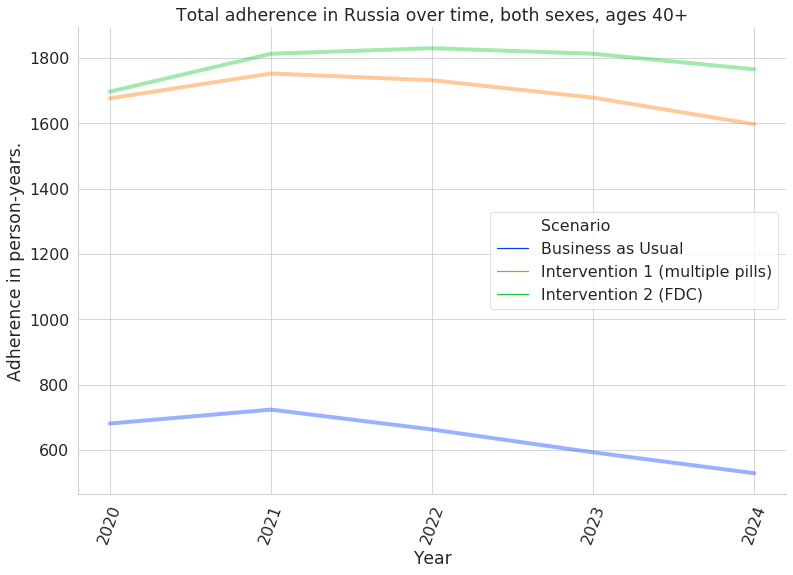

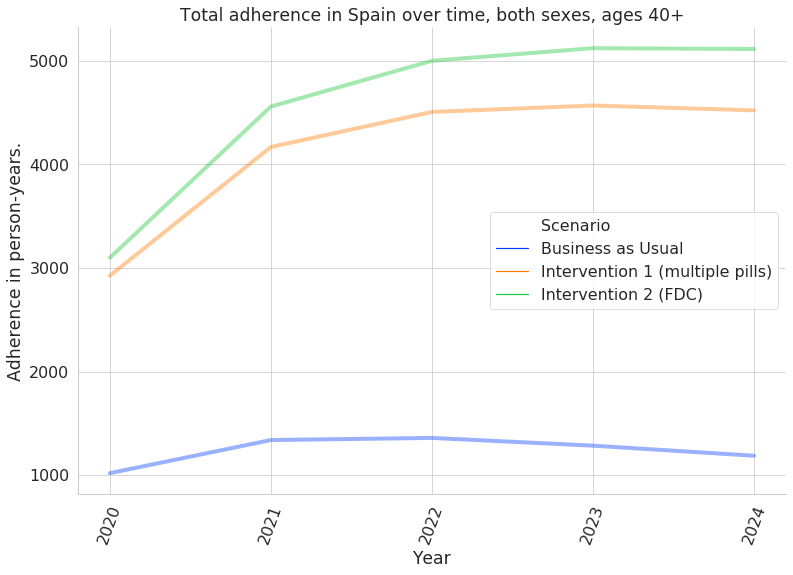

<Figure size 914.4x619.2 with 0 Axes>

In [28]:
def plot_adherence_time_series(adherence):
    
    scenario_list = ['Business as Usual','Intervention 1 (multiple pills)', 'Intervention 2 (FDC)']
    palette_list = ['#023eff','#ff7c00','#1ac938']
    palette_dict = {x:v for x,v in zip(scenario_list,palette_list)}
#     scenario_list = ['Intervention 1 (multiple pills)', 'Intervention 2 (FDC)']
#     palette_list = ['#ff7c00','#1ac938']
#     palette_dict = {x:v for x,v in zip(scenario_list,palette_list)}

    for location in ['Brazil', 'China', 'France', 'Italy', 'Russia', 'Spain']:

        with PdfPages(str(save_path_j)+f'/adherence_over_time/{location}_adherence_over_time.pdf') as pdf:
                data_r = adherence[(adherence.location == location)]
                data_m = data_r.groupby(['Scenario','year']).value.mean().reset_index()

                g = sns.lineplot(x='year', y='value', hue= 'Scenario',
                             linewidth=4, palette=palette_dict, alpha=0.4, 
                             data=data_r)

                g.set_title(f'Total adherence in {location} over time, both sexes, ages 40+')
                plt.xticks(rotation=70)
                g.set_xlabel('Year')
                g.set_ylabel(f'Adherence in person-years')

                pdf.savefig(orientation = 'landscape', bbox_inches='tight')

                plt.show()
                plt.clf() 


plot_adherence_time_series(adherence)

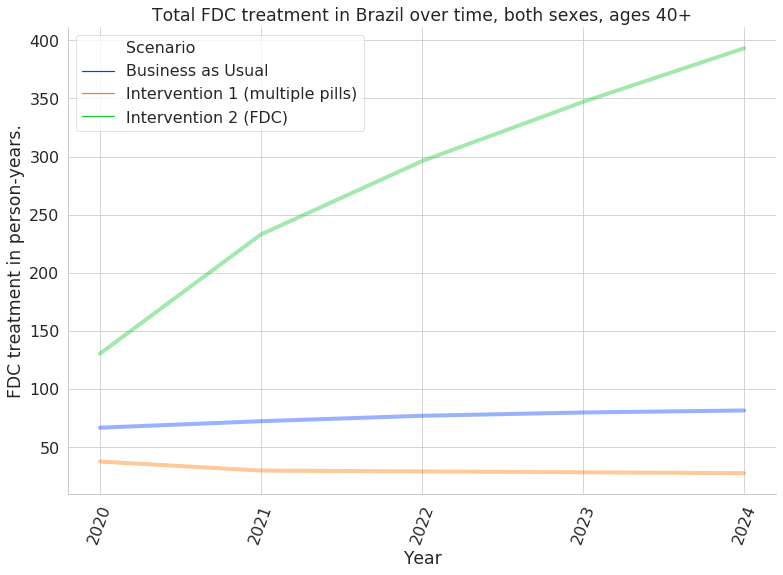

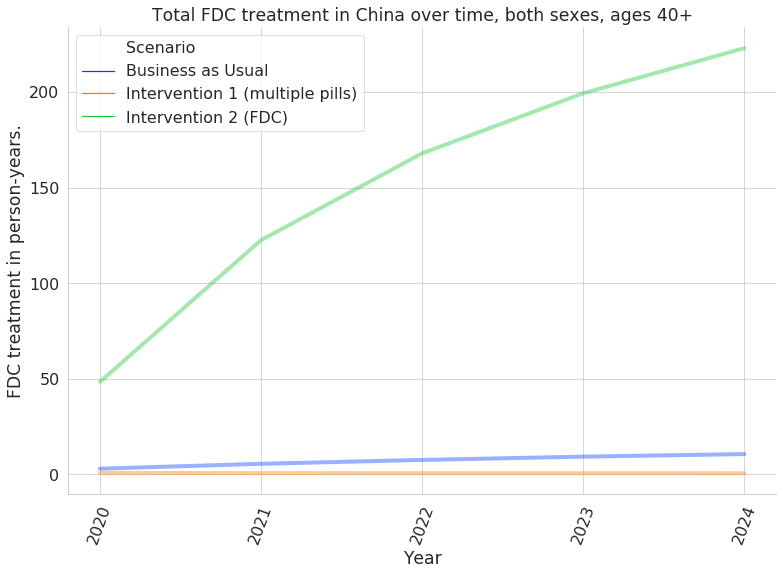

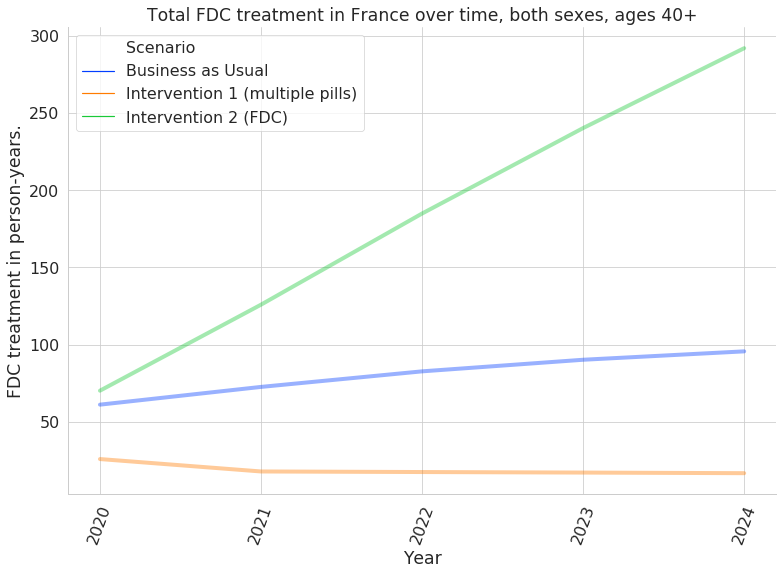

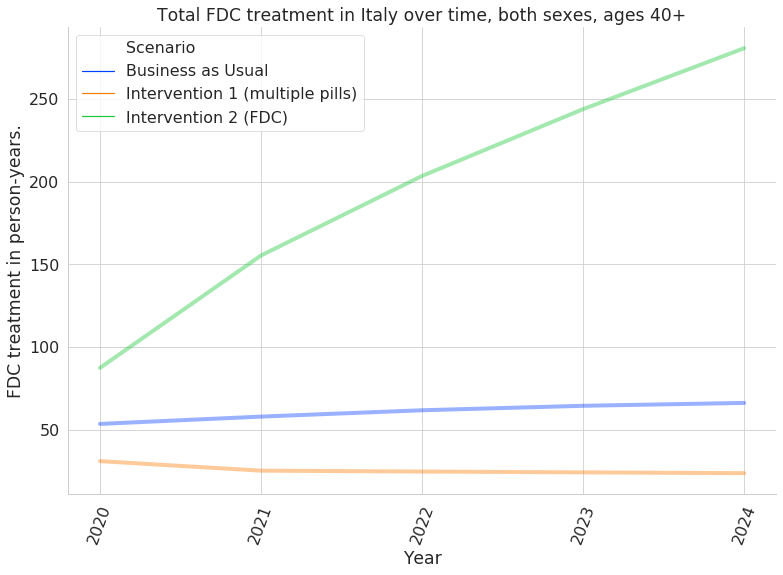

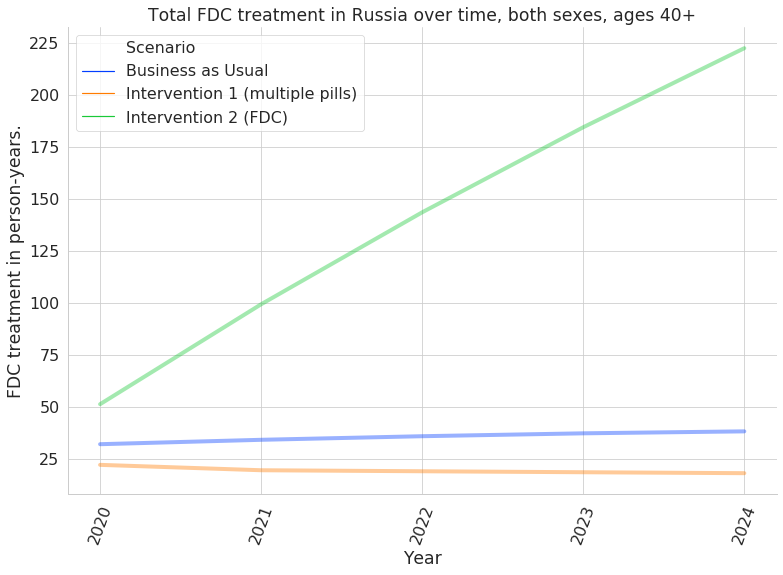

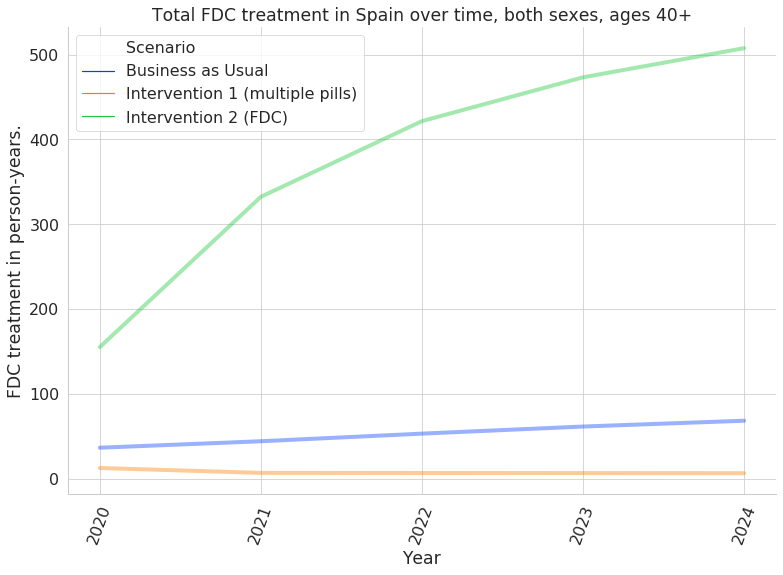

<Figure size 914.4x619.2 with 0 Axes>

In [27]:
def plot_fdc_time_series(fdc):
    
    scenario_list = ['Business as Usual','Intervention 1 (multiple pills)', 'Intervention 2 (FDC)']
    palette_list = ['#023eff','#ff7c00','#1ac938']

    palette_dict = {x:v for x,v in zip(scenario_list,palette_list)}

    for location in ['Brazil', 'China', 'France', 'Italy', 'Russia', 'Spain']:

        with PdfPages(str(save_path_j)+f'/fdc_over_time/{location}_fdc_over_time_mean.pdf') as pdf:
                data_r = fdc[(fdc.location == location)]
                data_m = data_r.groupby(['Scenario','year']).value.mean().reset_index()

                g = sns.lineplot(x='year', y='value', hue= 'Scenario',
                             linewidth=4, palette=palette_dict, alpha=0.4, 
                             data=data_r)

                g.set_title(f'Total FDC treatment in {location} over time, both sexes, ages 40+')
                plt.xticks(rotation=70)
                g.set_xlabel('Year')
                g.set_ylabel(f'FDC treatment in person-years.')

                pdf.savefig(orientation = 'landscape', bbox_inches='tight')

                plt.show()
                plt.clf() 


plot_fdc_time_series(fdc)

In [ ]:
# def get_incidence(susceptible_to_acute, post_to_acute, locations, risk_strat = False, final_cause_strat = False):
#     transitions = pd.concat([susceptible_to_acute, post_to_acute])
#     transitions = transitions[(transitions.age_group!= '35_to_39') & (transitions.age_group!= '30_to_34')]
#     transitions_both_sexes = transitions.groupby(['age_group', 'cause','input_draw', 'scenario', 'year', 'location']).sum().reset_index()
#     transitions_both_sexes['sex'] = 'both_sexes_combined'
#     transitions = pd.concat([transitions, transitions_both_sexes])
#     #add in 40+ age group
#     transitions_40plus = transitions.groupby(['cause', 'sex','input_draw', 'scenario', 'year', 'location']).sum().reset_index()
#     transitions_40plus['age_group'] = '40_plus'
#     transitions = pd.concat([transitions, transitions_40plus])
#     #query for 'baseline scenario' only scenario
#     transitions_baseline = transitions[(transitions['scenario']=='baseline')]
#     #add it back to the original DF for diff. from baseline calculation
#     transitions = pd.merge(transitions, transitions_baseline,left_on=['age_group', 'cause','input_draw', 'sex', 'year', 'location'],right_on=['age_group', 'cause','input_draw', 'sex', 'year', 'location'],how='left')
#     transitions['difference_from_baseline_count'] = transitions.apply(lambda row: (row['value_y'] - row['value_x']),axis=1)
#     transitions = transitions.rename(columns={'scenario_x':'scenario', 'value_x':'value'})
#     state = get_model_outputs_sequela(locations, 'state_person_time')
#     state = state[(state.age_group!= '35_to_39') & (state.age_group!= '30_to_34')]
#     state = state.groupby(['age_group','sex','year','cause','input_draw','location', 'measure', 'scenario']).value.sum().reset_index()
#     state = state[(state.cause.str.contains('susceptible')) | (state.cause.str.contains('post'))]
#     state['susceptible'] = state.cause.str.replace('susceptible_to_', '')
#     state_both_sexes = state.groupby(['age_group', 'cause', 'measure', 'input_draw', 'scenario', 'year', 'location']).sum().reset_index()
#     state_both_sexes['sex'] = 'both_sexes_combined'
#     state = pd.concat([state, state_both_sexes])
#     #add in 40+ age group
#     state_40plus = state.groupby(['cause', 'sex','measure', 'input_draw', 'scenario', 'year', 'location']).sum().reset_index()
#     state_40plus['age_group'] = '40_plus'
#     state = pd.concat([state, state_40plus])
#     state = state.drop(['cause', 'measure'], axis = 1)
#     if not risk_strat:
#         # state = collapse_frame(state, ['acs','fpg', 'sbp', 'ldl'])
#         transitions = collapse_frame(transitions, ['acs','fpg', 'sbp', 'ldl'])
#     if not final_cause_strat:
#         transitions = collapse_frame(transitions, ['cause'])
#         transitions = transitions.set_index([x for x in state.columns if x != 'value']).value
#     #if not :
#     #transitions = collapse_frame(trans)
#     else:
#         transitions = transitions.set_index([x for x in state.columns if x != 'value'] + ['cause']).value
#     state = state.set_index([x for x in state.columns if x != 'value']).value
#     incidence = (transitions.div(state) * 100000).reset_index()
#     incidence['measure'] = 'incidence'
#     if 'cause' not in incidence.columns:
#         incidence.rename(columns = {'susceptible':'cause'}, inplace = True)
#     incidence['cause'] = incidence.cause.map(mapping_dict_data['cause'])
#     incidence = incidence.groupby(['age_group','sex','year','cause','input_draw','location', 'measure', 'scenario']).value.sum().reset_index()
#     return incidence